## 5 - Area-of-Interest Data Exploration (task-based)

##### Imports

In [1]:
import os
import ast
import json
import pandas as pd
import numpy as np
import scipy as su
# from typing import Dict
# from scipy.signal import
# from scikit-learn import

from matplotlib.path import Path
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

import dask.dataframe as dd

##### Data Loading (AoI)

In [2]:
# Load AoI ddfs into dictionary
root_dir = './aoi_data'
def load_aoi_data(root_dir, exception=False): # Get csv file reads into one dictionary
    data = {}
    for file in os.listdir(root_dir):
        file_path = os.path.join(root_dir, file)
        file_name = os.path.splitext(file)[0]  # file name without '.csv'
        data[file_name] = dd.read_csv(file_path)  # read and attach to dict
    return data

data = load_aoi_data(root_dir)
participant_ids = [1,2,4,5,6,7,8,9,10,12,13,14,15,16,17,18,19,20]

In [3]:
# GUI data
gui_ddf = data['gui']
gui_df = gui_ddf.compute()
gui_df['block_data'] = gui_df['block_data'].apply(lambda x: eval(x))

block_type_mapping = {
    1: 1,
    2: 2,
    3: 3,
    4: 4,
    5: 1,
    6: 2,
    7: 3,
    8: 4
}
gui_df['condition'] = gui_df['block_type'].map(block_type_mapping)

In [4]:
# AoI data (task based)
ddf = data['aoi']
df = ddf.compute()
df = df.dropna(subset=['task_id'])

custom_labels = ['Easy Slow', 'Easy Fast', 'Hard Slow', 'Hard Fast']
custom_palette = ['#E9D4D0', '#C08FA0', '#7C5378', '#2D223A']

In [5]:
# AoI features (task based)
def convert_to_list(value):
    value = value.replace('nan', 'null')
    result = json.loads(value)
    result = [np.nan if x is None else x for x in result]
    return result

# Reading the data and converting specific columns
df_long = pd.read_csv('aoi_data/aoi_features.csv', converters={
    'duration': convert_to_list,
    'fix_count': convert_to_list,
    'fix_freq': convert_to_list,
    'time_1st_fix': convert_to_list,
    'visit_count': convert_to_list,
    'visit_freq': convert_to_list,
    'visit_len': convert_to_list,
    'dwell_pct': convert_to_list,
    'stat_entropy': convert_to_list,
    'trans_entropy': convert_to_list,
})
df_long['condition'] =  df_long['difficulty'] + ' ' + df_long['frequency']

In [6]:
# Explode lists
list_columns = [
    'duration',
    'fix_count',
    'fix_freq',
    'time_1st_fix',
    'visit_count',
    'visit_freq',
    'visit_len',
    'dwell_pct',
    'stat_entropy',
    'trans_entropy'
]
def explode_row(row, list_columns):
    num_elements = len(row[list_columns[0]])
    expanded_rows = pd.DataFrame({
        col: [row[col]] * num_elements if col not in list_columns else row[col]
        for col in row.index
    })
    return expanded_rows
df_long_expanded = pd.concat(df_long.apply(explode_row, list_columns=list_columns, axis=1).values).reset_index(drop=True)

### 1. Inspection
Head & Tail,  Basic statistics,  Missing values

##### Head & tail
- Good

In [7]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(participant_df.iloc[:, 1:].head())
    display(participant_df.iloc[:, 1:].tail())

'Participant 1'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
96,201,4.0,1.0,3.0,1.710323e+09,188.6645,1.410605,0.437134,0.637624,1.0
97,202,4.0,1.0,3.0,1.710323e+09,218.6145,1.340823,0.444758,0.618050,1.0
98,203,4.0,1.0,3.0,1.710323e+09,95.8820,1.405721,0.432927,0.602019,1.0
99,204,4.0,1.0,1.0,1.710323e+09,161.9675,1.412303,0.965099,0.889723,1.0
100,205,4.0,1.0,1.0,1.710323e+09,89.4650,1.479694,0.936560,0.899954,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
17958,19489,4.0,9.0,2.0,1.710327e+09,96.0095,0.906359,0.560431,0.569559,8.0
17959,19490,4.0,9.0,2.0,1.710327e+09,140.0950,1.425048,0.615338,0.503320,8.0
17960,19491,4.0,9.0,2.0,1.710327e+09,189.9255,1.429648,0.718714,0.538252,8.0
17961,19492,4.0,9.0,2.0,1.710327e+09,114.0190,0.608615,0.734868,0.530720,8.0
17962,19493,4.0,9.0,2.0,1.710327e+09,216.1990,1.445862,0.759970,0.491401,8.0


'Participant 2'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
18871,309,4.0,1.0,3.0,1.710331e+09,122.0735,1.292173,0.265855,0.770608,1.0
18872,310,4.0,1.0,3.0,1.710331e+09,89.8370,1.451306,0.264618,0.742452,1.0
18873,311,4.0,1.0,3.0,1.710331e+09,188.0390,1.476323,0.231527,0.783227,1.0
18874,312,4.0,1.0,3.0,1.710331e+09,92.0105,0.945615,0.244362,0.834844,1.0
18875,313,4.0,1.0,1.0,1.710331e+09,80.0285,1.479439,0.907972,0.897221,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
32864,14959,1.0,6.0,2.0,1.710334e+09,80.0795,0.486328,0.554679,0.854910,8.0
32865,14960,1.0,6.0,5.0,1.710334e+09,218.0150,1.370218,0.792571,0.322644,8.0
32866,14961,1.0,6.0,5.0,1.710334e+09,80.0100,0.993822,0.791835,0.249432,8.0
32867,14962,1.0,6.0,5.0,1.710334e+09,154.1130,1.443377,0.707620,0.297012,8.0
32868,14963,1.0,6.0,5.0,1.710334e+09,87.9965,1.438773,0.591528,0.241328,8.0


'Participant 4'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
33557,35,1.0,1.0,2.0,1.710408e+09,90.0010,1.317601,0.764273,0.884974,1.0
33558,36,1.0,1.0,1.0,1.710408e+09,133.8680,1.333848,0.915155,0.908830,1.0
33559,38,1.0,1.0,1.0,1.710408e+09,191.9975,1.445748,0.917329,0.895057,1.0
33560,39,1.0,1.0,2.0,1.710408e+09,122.8100,1.493597,0.691708,0.777870,1.0
33561,40,1.0,1.0,4.0,1.710408e+09,93.4120,1.284869,0.403101,0.353543,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
46837,14453,3.0,7.0,4.0,1.710411e+09,213.6545,1.495983,0.484168,0.363864,8.0
46838,14454,3.0,7.0,4.0,1.710411e+09,80.9965,1.494191,0.412648,0.349879,8.0
46839,14455,3.0,7.0,4.0,1.710411e+09,211.3185,1.438521,0.417900,0.378467,8.0
46840,14456,3.0,7.0,4.0,1.710411e+09,92.8325,0.579061,0.425497,0.361927,8.0
46841,14457,3.0,7.0,5.0,1.710411e+09,216.0425,1.461614,0.550949,0.211468,8.0


'Participant 5'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
47522,212,3.0,1.0,5.0,1.710417e+09,145.2040,1.405467,0.582787,0.304985,1.0
47523,213,3.0,1.0,5.0,1.710417e+09,104.1140,1.400864,0.546163,0.237945,1.0
47524,214,3.0,1.0,5.0,1.710417e+09,94.0445,1.198802,0.582501,0.265140,1.0
47525,215,3.0,1.0,4.0,1.710417e+09,146.0760,1.477105,0.392674,0.390477,1.0
47526,216,3.0,1.0,4.0,1.710417e+09,146.7740,1.272579,0.413701,0.033128,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
63014,16136,1.0,5.0,2.0,1.710420e+09,107.5630,1.448199,0.579110,0.896965,8.0
63015,16137,1.0,5.0,2.0,1.710420e+09,149.9740,1.345121,0.609617,0.728114,8.0
63016,16138,1.0,5.0,2.0,1.710420e+09,198.0215,1.291911,0.650213,0.800711,8.0
63017,16139,1.0,5.0,2.0,1.710420e+09,132.0025,1.474045,0.610016,0.691797,8.0
63018,16140,1.0,5.0,3.0,1.710420e+09,83.9295,1.403790,0.373216,0.707857,8.0


'Participant 6'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
64289,169,3.0,1.0,3.0,1.710505e+09,81.9660,1.498476,0.334908,0.595256,1.0
64290,170,3.0,1.0,3.0,1.710505e+09,216.0475,0.996756,0.346574,0.592872,1.0
64291,171,3.0,1.0,3.0,1.710505e+09,216.1370,1.399497,0.346877,0.560960,1.0
64292,172,3.0,1.0,3.0,1.710505e+09,219.4740,1.412040,0.325254,0.545829,1.0
64293,173,3.0,1.0,3.0,1.710505e+09,218.0340,0.826212,0.311296,0.543122,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
79055,15332,3.0,6.0,2.0,1.710508e+09,102.0360,0.969315,0.734378,0.525379,8.0
79056,15333,3.0,6.0,2.0,1.710508e+09,217.5885,1.072452,0.689654,0.542354,8.0
79057,15334,3.0,6.0,2.0,1.710508e+09,111.9845,1.081732,0.674081,0.513858,8.0
79058,15335,3.0,6.0,2.0,1.710508e+09,176.0020,1.473138,0.592930,0.505266,8.0
79059,15336,3.0,6.0,2.0,1.710508e+09,159.9755,1.434950,0.653029,0.517138,8.0


'Participant 7'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
79944,195,2.0,1.0,2.0,1.710773e+09,104.6370,1.472995,0.573869,0.878732,1.0
79945,196,2.0,1.0,2.0,1.710773e+09,82.0905,0.570235,0.685507,0.950075,1.0
79946,197,2.0,1.0,2.0,1.710773e+09,144.2840,1.337116,0.794066,0.852944,1.0
79947,198,2.0,1.0,2.0,1.710773e+09,176.0250,1.486072,0.801867,0.877914,1.0
79948,201,2.0,1.0,2.0,1.710773e+09,88.3420,1.320609,0.773984,0.592794,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
94128,14679,4.0,12.0,4.0,1.710776e+09,113.9915,0.972483,0.398233,0.353497,8.0
94129,14680,4.0,12.0,4.0,1.710776e+09,108.0490,1.457061,0.396467,0.370614,8.0
94130,14681,4.0,12.0,5.0,1.710776e+09,82.0215,1.474681,0.600306,0.141906,8.0
94131,14682,4.0,12.0,5.0,1.710776e+09,129.9295,1.459885,0.629349,0.089937,8.0
94132,14683,4.0,12.0,5.0,1.710776e+09,215.9880,1.435253,0.564351,0.090277,8.0


'Participant 8'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
94782,93,1.0,1.0,3.0,1.710841e+09,218.0055,0.514981,0.442440,0.554785,1.0
94783,94,1.0,1.0,3.0,1.710841e+09,84.0000,0.762816,0.460534,0.552613,1.0
94784,95,1.0,1.0,3.0,1.710841e+09,218.0570,1.299407,0.428977,0.639043,1.0
94785,96,1.0,1.0,3.0,1.710841e+09,217.9320,0.929107,0.445105,0.659153,1.0
94786,97,1.0,1.0,3.0,1.710841e+09,150.0040,0.957347,0.447208,0.651973,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
106405,12070,3.0,6.0,2.0,1.710844e+09,176.1665,1.480574,0.782661,0.662390,8.0
106406,12071,3.0,6.0,2.0,1.710844e+09,86.0570,1.427172,0.748493,0.645949,8.0
106407,12072,3.0,6.0,2.0,1.710844e+09,97.9170,1.442146,0.709310,0.625885,8.0
106408,12073,3.0,6.0,2.0,1.710844e+09,80.0945,1.450020,0.719634,0.623854,8.0
106409,12074,3.0,6.0,2.0,1.710844e+09,219.9270,0.830211,0.669560,0.615743,8.0


'Participant 9'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
107218,125,4.0,1.0,2.0,1.710859e+09,136.004,1.475910,0.536991,0.628032,1.0
107219,126,4.0,1.0,3.0,1.710859e+09,108.016,1.334540,0.488305,0.583584,1.0
107220,127,4.0,1.0,3.0,1.710859e+09,216.008,1.469420,0.497591,0.564301,1.0
107221,128,4.0,1.0,3.0,1.710859e+09,219.892,1.051768,0.506940,0.558873,1.0
107222,129,4.0,1.0,3.0,1.710859e+09,108.083,1.452866,0.510194,0.541040,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
121945,15434,2.0,15.0,4.0,1.710863e+09,117.2330,1.030624,0.180143,0.319624,8.0
121946,15435,2.0,15.0,4.0,1.710863e+09,99.1750,0.840446,0.123392,0.293887,8.0
121947,15436,2.0,15.0,5.0,1.710863e+09,154.0995,1.356414,0.659406,0.108103,8.0
121948,15437,2.0,15.0,5.0,1.710863e+09,141.8145,1.497811,0.713800,0.188780,8.0
121949,15438,2.0,15.0,5.0,1.710863e+09,120.4755,1.330491,0.754554,0.179788,8.0


'Participant 10'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
122883,121,3.0,1.0,4.0,1.711021e+09,219.7585,0.798063,0.462526,0.498072,1.0
122884,122,3.0,1.0,2.0,1.711021e+09,104.1135,1.343693,0.845744,0.875058,1.0
122885,123,3.0,1.0,1.0,1.711021e+09,203.9185,1.458944,0.925100,0.950259,1.0
122886,124,3.0,1.0,2.0,1.711021e+09,111.8005,1.366667,0.671380,0.874238,1.0
122887,125,3.0,1.0,3.0,1.711021e+09,219.8955,0.987467,0.217748,0.736363,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
137183,15330,4.0,13.0,4.0,1.711025e+09,108.0145,0.781333,0.454621,0.101135,8.0
137184,15331,4.0,13.0,4.0,1.711025e+09,180.0270,1.077551,0.257393,0.372486,8.0
137185,15332,4.0,13.0,4.0,1.711025e+09,108.0085,1.013147,0.260354,0.378346,8.0
137186,15333,4.0,13.0,4.0,1.711025e+09,95.9875,1.485458,0.391875,0.375672,8.0
137187,15334,4.0,13.0,4.0,1.711025e+09,192.2305,1.468349,0.441654,0.340866,8.0


'Participant 12'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
137902,140,2.0,1.0,3.0,1.711100e+09,216.0375,0.862335,0.503832,0.566038,1.0
137903,141,2.0,1.0,2.0,1.711100e+09,126.0335,0.814809,0.515662,0.543546,1.0
137904,142,2.0,1.0,2.0,1.711100e+09,106.0605,1.475532,0.636782,0.873088,1.0
137905,143,2.0,1.0,2.0,1.711100e+09,219.9155,0.956787,0.618519,0.866123,1.0
137906,144,2.0,1.0,3.0,1.711100e+09,218.0070,1.224820,0.507523,0.679265,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
153499,15890,1.0,7.0,2.0,1.711103e+09,83.9225,1.400936,0.720723,0.831648,8.0
153500,15891,1.0,7.0,5.0,1.711103e+09,128.0525,1.475772,0.530896,0.120133,8.0
153501,15892,1.0,7.0,4.0,1.711103e+09,147.9250,1.457686,0.445341,0.067198,8.0
153502,15893,1.0,7.0,4.0,1.711103e+09,192.5695,1.454303,0.496841,0.118504,8.0
153503,15894,1.0,7.0,4.0,1.711103e+09,168.0100,1.004685,0.495063,0.041494,8.0


'Participant 13'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
154171,75,3.0,1.0,1.0,1.711110e+09,95.9585,1.474263,0.901497,0.815395,1.0
154172,76,3.0,1.0,1.0,1.711110e+09,80.0680,1.471816,0.944153,0.868049,1.0
154173,77,3.0,1.0,1.0,1.711110e+09,167.9690,0.995170,0.949283,0.905167,1.0
154174,78,3.0,1.0,1.0,1.711110e+09,105.1720,1.445659,0.943270,0.834215,1.0
154175,79,3.0,1.0,1.0,1.711110e+09,84.0490,1.473123,0.934299,0.683632,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
170281,17127,3.0,6.0,4.0,1.711113e+09,216.1015,1.444356,0.486638,0.072626,8.0
170282,17128,3.0,6.0,4.0,1.711113e+09,111.9410,1.351494,0.488019,0.083068,8.0
170283,17129,3.0,6.0,4.0,1.711113e+09,219.9555,1.462683,0.482085,0.037671,8.0
170284,17130,3.0,6.0,4.0,1.711113e+09,83.1415,1.471268,0.428908,0.373479,8.0
170285,17131,3.0,6.0,4.0,1.711113e+09,216.0590,0.849335,0.423280,0.388113,8.0


'Participant 14'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
171204,103,1.0,1.0,2.0,1.711116e+09,96.3025,1.292960,0.625757,0.879167,1.0
171205,104,1.0,1.0,2.0,1.711116e+09,196.0590,1.391781,0.713107,0.956978,1.0
171206,105,1.0,1.0,2.0,1.711116e+09,81.9155,1.443248,0.699206,0.925523,1.0
171207,106,1.0,1.0,2.0,1.711116e+09,174.0380,1.114846,0.671465,0.938798,1.0
171208,107,1.0,1.0,2.0,1.711116e+09,135.9970,1.440651,0.522561,0.654979,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
187599,16714,3.0,6.0,2.0,1.711119e+09,217.1315,0.877680,0.853082,0.533273,8.0
187600,16715,3.0,6.0,2.0,1.711119e+09,217.9230,1.470944,0.835452,0.553680,8.0
187601,16716,3.0,6.0,2.0,1.711119e+09,138.0020,1.116422,0.812356,0.548774,8.0
187602,16717,3.0,6.0,2.0,1.711119e+09,144.0015,1.411181,0.611541,0.662009,8.0
187603,16718,3.0,6.0,2.0,1.711119e+09,189.9260,1.266717,0.571622,0.647753,8.0


'Participant 15'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
188747,161,4.0,1.0,3.0,1.711381e+09,219.9580,1.331828,0.353195,0.637722,1.0
188748,162,4.0,1.0,3.0,1.711381e+09,219.9545,1.387820,0.343919,0.660913,1.0
188749,163,4.0,1.0,3.0,1.711381e+09,217.9275,1.090952,0.328056,0.636256,1.0
188750,164,4.0,1.0,3.0,1.711381e+09,103.6755,1.306575,0.331019,0.655667,1.0
188751,165,4.0,1.0,1.0,1.711381e+09,87.9775,1.466073,0.960522,0.920974,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
202810,14843,4.0,14.0,4.0,1.711384e+09,83.9405,1.471547,0.498765,0.354125,8.0
202811,14844,4.0,14.0,5.0,1.711384e+09,159.9715,1.076826,0.518225,0.371373,8.0
202812,14845,4.0,14.0,5.0,1.711384e+09,215.9830,1.257226,0.540908,0.078339,8.0
202813,14846,4.0,14.0,5.0,1.711384e+09,125.1010,1.021517,0.577235,0.121214,8.0
202814,14847,4.0,14.0,5.0,1.711384e+09,144.0145,1.486924,0.554503,0.194952,8.0


'Participant 16'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
203559,132,1.0,1.0,2.0,1.711465e+09,174.5495,1.442185,0.523768,0.860920,1.0
203560,133,1.0,1.0,3.0,1.711465e+09,166.2960,1.473086,0.490015,0.826512,1.0
203561,134,1.0,1.0,3.0,1.711465e+09,217.9615,1.099035,0.488289,0.837668,1.0
203562,135,1.0,1.0,2.0,1.711465e+09,219.9575,1.470389,0.685002,0.946374,1.0
203563,136,1.0,1.0,2.0,1.711465e+09,196.0245,0.949353,0.533073,0.757181,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
220097,17107,1.0,8.0,4.0,1.711469e+09,154.0855,1.483687,0.412770,0.305903,8.0
220098,17108,1.0,8.0,4.0,1.711469e+09,217.9030,0.684859,0.411512,0.329398,8.0
220099,17109,1.0,8.0,5.0,1.711469e+09,218.1080,1.463053,0.582955,0.012089,8.0
220100,17110,1.0,8.0,5.0,1.711469e+09,217.9645,1.249794,0.609320,0.060770,8.0
220101,17111,1.0,8.0,5.0,1.711469e+09,202.0540,1.439011,0.544318,0.065975,8.0


'Participant 17'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
221719,534,3.0,1.0,3.0,1.711531e+09,91.3900,0.605898,0.266557,0.773739,1.0
221720,535,3.0,1.0,3.0,1.711531e+09,189.9705,1.489551,0.224128,0.913229,1.0
221721,536,3.0,1.0,3.0,1.711531e+09,87.9305,1.348505,0.460417,0.678195,1.0
221722,537,3.0,1.0,3.0,1.711531e+09,160.0215,1.382379,0.462208,0.638943,1.0
221723,538,3.0,1.0,3.0,1.711531e+09,217.9970,1.056853,0.364148,0.665073,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
237337,16407,2.0,14.0,4.0,1.711534e+09,218.1135,0.614977,0.253187,0.061632,8.0
237338,16408,2.0,14.0,4.0,1.711534e+09,217.9100,1.058644,0.251296,0.057044,8.0
237339,16409,2.0,14.0,4.0,1.711534e+09,82.0235,1.126522,0.313707,0.046155,8.0
237340,16410,2.0,14.0,4.0,1.711534e+09,115.6820,1.228689,0.339587,0.013379,8.0
237341,16412,2.0,14.0,4.0,1.711534e+09,105.9910,1.397662,0.173426,0.151381,8.0


'Participant 18'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
238046,99,2.0,1.0,3.0,1.711550e+09,91.9755,0.516246,0.463599,0.682548,1.0
238047,100,2.0,1.0,3.0,1.711550e+09,216.0415,1.390425,0.482728,0.602807,1.0
238048,101,2.0,1.0,3.0,1.711550e+09,216.0320,0.797795,0.483225,0.619120,1.0
238049,102,2.0,1.0,3.0,1.711550e+09,219.9825,1.161076,0.484397,0.629198,1.0
238050,103,2.0,1.0,3.0,1.711550e+09,219.6925,0.949587,0.491987,0.645502,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
253335,15582,2.0,15.0,4.0,1.711553e+09,188.0445,0.975892,0.391090,0.406525,8.0
253336,15583,2.0,15.0,4.0,1.711553e+09,217.5735,1.090966,0.158628,0.076377,8.0
253337,15584,2.0,15.0,4.0,1.711553e+09,218.7005,1.284764,0.154779,0.064571,8.0
253338,15585,2.0,15.0,4.0,1.711553e+09,87.8830,1.402417,0.391329,0.371159,8.0
253339,15586,2.0,15.0,4.0,1.711553e+09,206.1155,1.420314,0.399206,0.405649,8.0


'Participant 19'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
254931,79,4.0,1.0,5.0,1.711617e+09,108.0420,1.433065,1.139535,0.891075,1.0
254932,80,4.0,1.0,5.0,1.711617e+09,82.0445,1.473739,1.154638,0.877706,1.0
254933,81,4.0,1.0,5.0,1.711617e+09,112.6605,1.285628,1.140222,0.873653,1.0
254934,82,4.0,1.0,5.0,1.711617e+09,110.0350,0.871251,1.151106,0.870055,1.0
254935,83,4.0,1.0,1.0,1.711617e+09,218.0480,1.259368,0.998309,0.911958,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
269650,15414,3.0,6.0,2.0,1.711621e+09,209.8405,1.488789,0.677229,0.575328,8.0
269651,15415,3.0,6.0,2.0,1.711621e+09,186.1265,1.490920,0.664992,0.562659,8.0
269652,15416,3.0,6.0,2.0,1.711621e+09,169.8920,1.280507,0.734538,0.569491,8.0
269653,15417,3.0,6.0,2.0,1.711621e+09,219.4565,1.311287,0.720449,0.550428,8.0
269654,15418,3.0,6.0,2.0,1.711621e+09,209.9775,1.013546,0.767897,0.565995,8.0


'Participant 20'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
270556,93,2.0,1.0,3.0,1.711626e+09,107.9370,0.671023,0.500479,0.836371,1.0
270557,94,2.0,1.0,4.0,1.711626e+09,216.0430,1.394737,0.263864,0.319912,1.0
270558,95,2.0,1.0,4.0,1.711626e+09,215.3215,1.201011,0.233984,0.449166,1.0
270559,96,2.0,1.0,4.0,1.711626e+09,215.8560,1.228473,0.218571,0.371064,1.0
270560,97,2.0,1.0,2.0,1.711626e+09,99.9505,1.458706,0.793374,0.832598,1.0


,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
287118,17182,1.0,7.0,4.0,1.711630e+09,207.6210,1.369080,0.468747,0.336186,8.0
287119,17183,1.0,7.0,4.0,1.711630e+09,101.3290,1.456640,0.512715,0.353742,8.0
287120,17184,1.0,7.0,4.0,1.711630e+09,219.9870,1.490505,0.421550,0.322754,8.0
287121,17185,1.0,7.0,4.0,1.711630e+09,128.0215,1.129183,0.430138,0.328043,8.0
287122,17186,1.0,7.0,5.0,1.711630e+09,156.0820,1.359384,0.555418,0.122214,8.0


##### Basic statistics
- Mean fix duration ~152 ms

In [8]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(participant_df.iloc[:, 1:].describe())

'Participant 1'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,12662.000000,12662.000000,12662.000000,12662.000000,1.266200e+04,12662.000000,12662.000000,12662.000000,12662.000000,12662.000000
mean,10070.803270,2.787632,4.595167,3.201469,1.710325e+09,148.404552,1.290486,0.508477,0.499208,4.434450
std,6155.882901,1.100794,3.105506,1.167344,1.237546e+03,50.149048,0.216769,0.210814,0.291211,2.551284
min,201.000000,1.000000,1.000000,1.000000,1.710323e+09,80.000000,0.373389,0.000254,0.000167,1.000000
25%,4393.250000,2.000000,2.000000,2.000000,1.710324e+09,100.143625,1.204426,0.371000,0.277401,2.000000
50%,9899.500000,3.000000,4.000000,4.000000,1.710325e+09,141.301250,1.375160,0.546085,0.414801,4.000000
75%,15926.750000,4.000000,6.000000,4.000000,1.710326e+09,202.110625,1.447783,0.658274,0.793054,7.000000
max,19493.000000,4.000000,15.000000,5.000000,1.710327e+09,220.000000,1.499989,1.204993,1.003306,8.000000


'Participant 2'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,9845.000000,9845.000000,9845.000000,9845.000000,9.845000e+03,9845.000000,9845.000000,9845.000000,9845.000000,9845.000000
mean,7304.202743,2.692433,4.263687,3.345658,1.710333e+09,152.387880,1.291242,0.509480,0.459499,4.274454
std,4184.674503,1.116838,2.618494,1.170750,8.249926e+02,50.379782,0.220020,0.197622,0.282653,2.257329
min,309.000000,1.000000,1.000000,1.000000,1.710331e+09,80.000000,0.256414,0.002433,0.000442,1.000000
25%,3798.000000,2.000000,2.000000,2.000000,1.710332e+09,104.743000,1.211503,0.397331,0.251340,2.000000
50%,7747.000000,3.000000,4.000000,4.000000,1.710333e+09,147.922000,1.376263,0.500592,0.367064,5.000000
75%,10650.000000,4.000000,6.000000,4.000000,1.710333e+09,212.288500,1.447318,0.642729,0.755344,6.000000
max,14963.000000,4.000000,11.000000,5.000000,1.710334e+09,220.000000,1.499961,1.120625,0.994987,8.000000


'Participant 4'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,7230.000000,7230.000000,7230.000000,7230.000000,7.230000e+03,7230.000000,7230.000000,7230.000000,7230.000000,7230.000000
mean,6953.753527,2.707607,6.381189,3.239696,1.710410e+09,156.802722,1.218173,0.474047,0.501817,4.238451
std,3819.813692,1.079870,4.257571,1.074073,8.025959e+02,50.851874,0.269612,0.181851,0.264115,2.107267
min,35.000000,1.000000,1.000000,1.000000,1.710408e+09,80.000500,0.215181,0.013732,0.000166,1.000000
25%,3695.250000,2.000000,3.000000,2.000000,1.710409e+09,107.910500,1.053914,0.349936,0.299078,2.000000
50%,6762.500000,3.000000,5.000000,3.000000,1.710410e+09,156.768000,1.320600,0.459802,0.526779,4.000000
75%,9919.750000,4.000000,9.000000,4.000000,1.710410e+09,216.039000,1.436055,0.589491,0.758984,6.000000
max,14457.000000,4.000000,18.000000,5.000000,1.710411e+09,219.999000,1.499997,1.095856,0.911371,8.000000


'Participant 5'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,11373.000000,11373.000000,11373.000000,11373.000000,1.137300e+04,11373.000000,11373.000000,11373.000000,11373.000000,11373.000000
mean,8062.131803,2.619801,2.933703,3.518069,1.710419e+09,151.766082,1.247203,0.464813,0.423534,4.331839
std,4568.982420,1.075910,1.647913,1.112536,9.740801e+02,52.019934,0.258302,0.200630,0.279592,2.248023
min,212.000000,1.000000,1.000000,1.000000,1.710417e+09,80.000500,0.210168,0.020388,0.000479,1.000000
25%,3925.000000,2.000000,2.000000,3.000000,1.710418e+09,99.997000,1.107125,0.309922,0.182167,2.000000
50%,8088.000000,3.000000,3.000000,4.000000,1.710419e+09,148.360000,1.356975,0.452043,0.358354,4.000000
75%,11833.000000,4.000000,4.000000,4.000000,1.710420e+09,215.974000,1.444867,0.588021,0.699598,6.000000
max,16140.000000,4.000000,7.000000,5.000000,1.710420e+09,220.000000,1.499989,1.114555,0.996948,8.000000


'Participant 6'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,9511.000000,9511.000000,9511.000000,9511.000000,9.511000e+03,9511.000000,9511.000000,9511.000000,9511.000000,9511.000000
mean,7746.298602,2.704553,4.694354,3.343602,1.710507e+09,162.310675,1.245370,0.443251,0.458069,4.418042
std,4379.358705,1.083273,2.760402,1.033768,8.858226e+02,52.668843,0.251678,0.197856,0.270416,2.284448
min,169.000000,1.000000,1.000000,1.000000,1.710505e+09,80.000000,0.262598,0.014033,0.001424,1.000000
25%,3804.500000,2.000000,2.000000,2.000000,1.710506e+09,109.804500,1.096368,0.288660,0.243271,2.000000
50%,7703.000000,3.000000,4.000000,4.000000,1.710507e+09,169.840000,1.350984,0.414883,0.369330,4.000000
75%,11559.500000,4.000000,7.000000,4.000000,1.710507e+09,217.796250,1.440046,0.590132,0.723199,6.000000
max,15336.000000,4.000000,11.000000,5.000000,1.710508e+09,220.000000,1.499959,1.036807,0.970596,8.000000


'Participant 7'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,8384.000000,8384.000000,8384.000000,8384.000000,8.384000e+03,8384.000000,8384.000000,8384.000000,8384.000000,8384.000000
mean,7464.943583,2.752266,5.388001,3.147543,1.710774e+09,160.431876,1.216327,0.501437,0.515636,4.446565
std,4708.559824,1.062098,3.499609,1.131489,9.854396e+02,51.425166,0.286762,0.211393,0.287255,2.545449
min,195.000000,1.000000,1.000000,1.000000,1.710773e+09,80.000000,0.148288,0.004355,0.000066,1.000000
25%,3011.750000,2.000000,3.000000,2.000000,1.710773e+09,109.965500,1.046382,0.337394,0.289648,2.000000
50%,7400.500000,3.000000,5.000000,3.000000,1.710774e+09,163.257000,1.338722,0.488649,0.555257,4.000000
75%,12019.250000,4.000000,7.000000,4.000000,1.710775e+09,217.376125,1.443337,0.645922,0.795975,7.000000
max,14683.000000,4.000000,17.000000,5.000000,1.710776e+09,220.000000,1.499979,1.214052,0.972632,8.000000


'Participant 8'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,6435.000000,6435.000000,6435.000000,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,6083.763947,2.702098,5.638850,2.902564,1.710843e+09,154.440641,1.186320,0.532085,0.594699,4.217405
std,3037.137279,1.103018,3.637923,1.114512,7.742515e+02,51.208734,0.294578,0.214168,0.248539,2.010342
min,93.000000,1.000000,1.000000,1.000000,1.710841e+09,80.000500,0.178461,0.000088,0.000422,1.000000
25%,3977.500000,2.000000,3.000000,2.000000,1.710842e+09,104.062500,1.001425,0.394439,0.363997,3.000000
50%,6079.000000,3.000000,5.000000,3.000000,1.710843e+09,152.126500,1.288265,0.538709,0.644180,4.000000
75%,8397.500000,4.000000,8.000000,4.000000,1.710843e+09,215.992000,1.429304,0.663491,0.822197,6.000000
max,12074.000000,4.000000,14.000000,5.000000,1.710844e+09,220.000000,1.499998,1.232878,0.964543,8.000000


'Participant 9'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,9056.000000,9056.000000,9056.000000,9056.000000,9.056000e+03,9056.000000,9056.000000,9056.000000,9056.000000,9056.000000
mean,8179.676789,2.726811,5.341983,3.266343,1.710861e+09,162.614767,1.222899,0.507596,0.465484,4.576193
std,4780.023937,1.082267,3.437569,1.210372,9.561965e+02,50.409949,0.265244,0.214806,0.279211,2.459870
min,125.000000,1.000000,1.000000,1.000000,1.710859e+09,80.000000,0.214750,0.004295,0.000941,1.000000
25%,3841.750000,2.000000,3.000000,2.000000,1.710860e+09,115.945625,1.068533,0.368160,0.227555,2.000000
50%,8015.500000,3.000000,5.000000,4.000000,1.710861e+09,166.239750,1.325188,0.483086,0.385403,4.000000
75%,12683.250000,4.000000,8.000000,4.000000,1.710862e+09,216.789500,1.434459,0.630681,0.757031,7.000000
max,15438.000000,4.000000,15.000000,5.000000,1.710863e+09,220.000000,1.499890,1.131517,0.978568,8.000000


'Participant 10'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,8922.000000,8922.000000,8922.000000,8922.000000,8.922000e+03,8922.000000,8922.000000,8922.000000,8922.000000,8922.000000
mean,7942.133602,2.708473,5.645259,3.095382,1.711023e+09,159.336976,1.216172,0.468850,0.537783,4.539565
std,4347.158398,1.066069,3.675131,1.095375,8.969530e+02,52.312279,0.266140,0.233353,0.293836,2.235254
min,121.000000,1.000000,1.000000,1.000000,1.711021e+09,80.000000,0.261881,0.000733,0.000240,1.000000
25%,4734.250000,2.000000,3.000000,2.000000,1.711022e+09,107.942500,1.043150,0.270182,0.279610,3.000000
50%,7595.500000,3.000000,5.000000,3.000000,1.711023e+09,162.291000,1.317969,0.448405,0.611029,4.000000
75%,11563.750000,4.000000,8.000000,4.000000,1.711024e+09,216.371250,1.432003,0.633932,0.800159,6.000000
max,15334.000000,4.000000,15.000000,5.000000,1.711025e+09,220.000000,1.499849,1.220871,0.999147,8.000000


'Participant 12'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,9572.000000,9572.000000,9572.000000,9572.000000,9.572000e+03,9572.000000,9572.000000,9572.000000,9572.000000,9572.000000
mean,7839.780297,2.727016,4.755119,3.107814,1.711102e+09,154.205798,1.281041,0.508945,0.539303,4.315295
std,4681.606440,1.073989,2.902915,1.157295,9.082388e+02,50.737232,0.225172,0.231115,0.297615,2.309788
min,140.000000,1.000000,1.000000,1.000000,1.711100e+09,80.000000,0.333301,0.000335,0.000132,1.000000
25%,3339.750000,2.000000,2.000000,2.000000,1.711101e+09,105.056250,1.188007,0.319285,0.262885,2.000000
50%,8141.500000,3.000000,4.000000,3.000000,1.711102e+09,151.670500,1.367599,0.525204,0.613270,4.000000
75%,11896.250000,4.000000,7.000000,4.000000,1.711102e+09,216.002500,1.445242,0.677849,0.819818,6.000000
max,15894.000000,4.000000,12.000000,5.000000,1.711103e+09,220.000000,1.499967,1.241162,0.972461,8.000000


'Participant 13'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,9923.000000,9923.000000,9923.000000,9923.000000,9.923000e+03,9923.000000,9923.000000,9923.000000,9923.000000,9923.000000
mean,8593.039303,2.683866,4.623199,3.260707,1.711111e+09,161.092237,1.258288,0.473725,0.470392,4.472236
std,4852.291569,1.073554,2.820544,1.103153,9.556127e+02,51.282909,0.230387,0.205190,0.276010,2.288792
min,75.000000,1.000000,1.000000,1.000000,1.711110e+09,80.000500,0.334521,0.000677,0.000962,1.000000
25%,4014.500000,2.000000,2.000000,2.000000,1.711110e+09,112.022750,1.130749,0.359416,0.284766,2.000000
50%,8447.000000,3.000000,4.000000,4.000000,1.711111e+09,163.974000,1.342397,0.441871,0.402176,4.000000
75%,12821.500000,4.000000,6.000000,4.000000,1.711112e+09,216.280000,1.437030,0.589504,0.743892,7.000000
max,17131.000000,4.000000,13.000000,5.000000,1.711113e+09,220.000000,1.499954,1.168857,0.959347,8.000000


'Participant 14'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,10046.000000,10046.000000,10046.000000,10046.000000,1.004600e+04,10046.000000,10046.000000,10046.000000,10046.000000,10046.000000
mean,8496.734919,2.755624,5.100040,3.156679,1.711117e+09,160.843243,1.249245,0.494570,0.516662,4.431515
std,4384.066914,1.082972,3.102985,1.115410,8.529427e+02,51.312170,0.240082,0.204007,0.278600,2.070639
min,103.000000,1.000000,1.000000,1.000000,1.711116e+09,80.000000,0.240540,0.001863,0.000264,1.000000
25%,5151.250000,2.000000,3.000000,2.000000,1.711117e+09,111.731750,1.106180,0.362467,0.294642,3.000000
50%,8354.500000,3.000000,5.000000,3.000000,1.711117e+09,164.042750,1.342819,0.491182,0.537056,4.000000
75%,11932.750000,4.000000,7.000000,4.000000,1.711118e+09,216.510875,1.438717,0.636324,0.791779,6.000000
max,16718.000000,4.000000,13.000000,5.000000,1.711119e+09,220.000000,1.499965,1.151802,1.034610,8.000000


'Participant 15'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,8265.000000,8265.000000,8265.000000,8265.000000,8.265000e+03,8265.000000,8265.000000,8265.000000,8265.000000,8265.000000
mean,7488.921234,2.735027,6.088808,3.198306,1.711382e+09,153.734011,1.255140,0.508643,0.494086,4.369026
std,4750.813707,1.064572,4.130770,1.190271,1.020662e+03,51.179201,0.247388,0.210316,0.282346,2.555542
min,161.000000,1.000000,1.000000,1.000000,1.711381e+09,80.000500,0.302005,0.026398,0.000006,1.000000
25%,3142.000000,2.000000,3.000000,2.000000,1.711381e+09,104.022500,1.131631,0.363837,0.271780,2.000000
50%,7295.000000,3.000000,5.000000,3.000000,1.711382e+09,150.077000,1.355166,0.530386,0.529592,4.000000
75%,12145.000000,4.000000,8.000000,4.000000,1.711383e+09,216.005000,1.442356,0.644011,0.772728,7.000000
max,14847.000000,4.000000,18.000000,5.000000,1.711384e+09,220.000000,1.499966,1.132831,0.971998,8.000000


'Participant 16'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,8752.000000,8752.000000,8752.000000,8752.000000,8.752000e+03,8752.000000,8752.000000,8752.000000,8752.000000,8752.000000
mean,9189.618144,2.747029,6.200983,3.083752,1.711467e+09,171.743935,1.177321,0.526871,0.519869,4.397966
std,4530.815232,1.085633,4.089439,1.200674,9.270003e+02,49.260848,0.285332,0.209968,0.273270,2.054477
min,132.000000,1.000000,1.000000,1.000000,1.711465e+09,80.000500,0.241593,0.000078,0.000183,1.000000
25%,6025.750000,2.000000,3.000000,2.000000,1.711466e+09,127.901125,0.975155,0.389448,0.313309,3.000000
50%,9025.500000,3.000000,5.000000,3.000000,1.711467e+09,188.015000,1.271869,0.536280,0.569731,4.000000
75%,13241.250000,4.000000,9.000000,4.000000,1.711468e+09,217.961125,1.422210,0.665604,0.787892,6.000000
max,17111.000000,4.000000,17.000000,5.000000,1.711469e+09,220.000000,1.499876,0.977566,0.987607,8.000000


'Participant 17'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,9892.000000,9892.000000,9892.000000,9892.000000,9.892000e+03,9892.000000,9892.000000,9892.000000,9892.000000,9892.000000
mean,8443.996866,2.751415,5.121715,3.136373,1.711532e+09,161.599547,1.221004,0.474921,0.525045,4.303983
std,4547.497226,1.064008,3.603370,1.065684,8.625918e+02,51.003922,0.272388,0.206817,0.266738,2.261289
min,534.000000,1.000000,1.000000,1.000000,1.711531e+09,80.000500,0.242376,0.000270,0.000195,1.000000
25%,5311.750000,2.000000,2.000000,2.000000,1.711531e+09,112.042875,1.049408,0.326252,0.321911,3.000000
50%,8371.500000,3.000000,4.000000,3.000000,1.711532e+09,166.039750,1.332118,0.450452,0.588976,4.000000
75%,11777.250000,4.000000,7.000000,4.000000,1.711533e+09,216.429625,1.438029,0.595276,0.764833,6.000000
max,16412.000000,4.000000,15.000000,5.000000,1.711534e+09,220.000000,1.499964,1.030975,0.969054,8.000000


'Participant 18'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,8775.000000,8775.000000,8775.000000,8775.000000,8.775000e+03,8775.000000,8775.000000,8775.000000,8775.000000,8775.000000
mean,7869.501994,2.724558,5.136638,3.368433,1.711552e+09,174.250302,1.142220,0.460846,0.447531,4.423818
std,4885.214922,1.077531,3.140309,1.085466,1.015618e+03,49.699070,0.307119,0.201378,0.274892,2.498388
min,99.000000,1.000000,1.000000,1.000000,1.711550e+09,80.002000,0.222780,0.000382,0.000705,1.000000
25%,3279.500000,2.000000,3.000000,2.000000,1.711551e+09,129.829500,0.910248,0.355699,0.236539,2.000000
50%,7956.000000,3.000000,5.000000,4.000000,1.711552e+09,199.954000,1.227989,0.428527,0.377943,4.000000
75%,12020.500000,4.000000,7.000000,4.000000,1.711552e+09,217.981000,1.419671,0.572009,0.711126,7.000000
max,15586.000000,4.000000,15.000000,5.000000,1.711553e+09,220.000000,1.499960,1.206588,0.954255,8.000000


'Participant 19'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,8613.000000,8613.000000,8613.000000,8613.000000,8.613000e+03,8613.000000,8613.000000,8613.000000,8613.000000,8613.000000
mean,7505.706258,2.747707,5.867874,3.106583,1.711619e+09,152.532905,1.251113,0.501658,0.500467,4.188088
std,4800.603063,1.067549,4.076538,1.148221,9.834154e+02,52.124961,0.249849,0.218544,0.280219,2.437117
min,79.000000,1.000000,1.000000,1.000000,1.711617e+09,80.000000,0.255649,0.021998,0.000795,1.000000
25%,3199.000000,2.000000,3.000000,2.000000,1.711618e+09,100.078000,1.117777,0.363611,0.291490,2.000000
50%,7522.000000,3.000000,5.000000,3.000000,1.711619e+09,149.877000,1.351570,0.511942,0.548111,4.000000
75%,12116.000000,4.000000,8.000000,4.000000,1.711620e+09,215.988000,1.442845,0.650356,0.783816,7.000000
max,15418.000000,4.000000,17.000000,5.000000,1.711621e+09,220.000000,1.499925,1.154638,0.951651,8.000000


'Participant 20'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
count,9528.000000,9528.000000,9528.000000,9528.000000,9.528000e+03,9528.000000,9528.000000,9528.000000,9528.000000,9528.000000
mean,8277.479534,2.717884,5.079870,3.209593,1.711628e+09,152.311765,1.263703,0.503747,0.484526,4.210747
std,5094.205054,1.082397,3.169443,1.163926,9.926768e+02,48.875090,0.231644,0.220025,0.277405,2.301209
min,93.000000,1.000000,1.000000,1.000000,1.711626e+09,80.000000,0.331376,0.001463,0.001725,1.000000
25%,3570.750000,2.000000,2.000000,2.000000,1.711627e+09,106.090750,1.146503,0.356836,0.270181,2.000000
50%,8586.500000,3.000000,5.000000,4.000000,1.711628e+09,149.886000,1.349473,0.488827,0.464046,4.000000
75%,12876.250000,4.000000,7.000000,4.000000,1.711629e+09,203.893500,1.441602,0.657150,0.763755,6.000000
max,17186.000000,4.000000,13.000000,5.000000,1.711630e+09,220.000000,1.499987,1.014200,0.973962,8.000000


##### Missing values
- no missing values

In [9]:
def missing_values(df):     # Compute missing values (count, pct and location)
    missing_data = df.isnull().sum()
    missing_percentage = ((missing_data / len(df)) * 100).apply(lambda x: f"{x:.2f}")
    missing_positions = df.apply(lambda x: ', '.join(str(idx) for idx in x.index[x.isnull()]), axis=0)

    missing_df = pd.DataFrame({     #create df to display
        'null_count': missing_data,
        'null_pct': missing_percentage,
        'location': missing_positions
    }).transpose()  # Transpose to have columns as indexes and new parameters as row indexes

    return missing_df

In [10]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(missing_values(participant_df.iloc[:, 1:]))

'Participant 1'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 2'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 4'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 5'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 6'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 7'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 8'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 9'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 10'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 12'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 13'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 14'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 15'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 16'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 17'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 18'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 19'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


'Participant 20'

,fixation_id,condition,task_id,area,start_timestamp,duration,dispersion,norm_pos_x,norm_pos_y,block_id
null_count,0,0,0,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,,,,


### 2. Fixation Duration
Area- & condition based, per participant

##### Area-based
- A1: Longer fix
- A5: Shorter fix

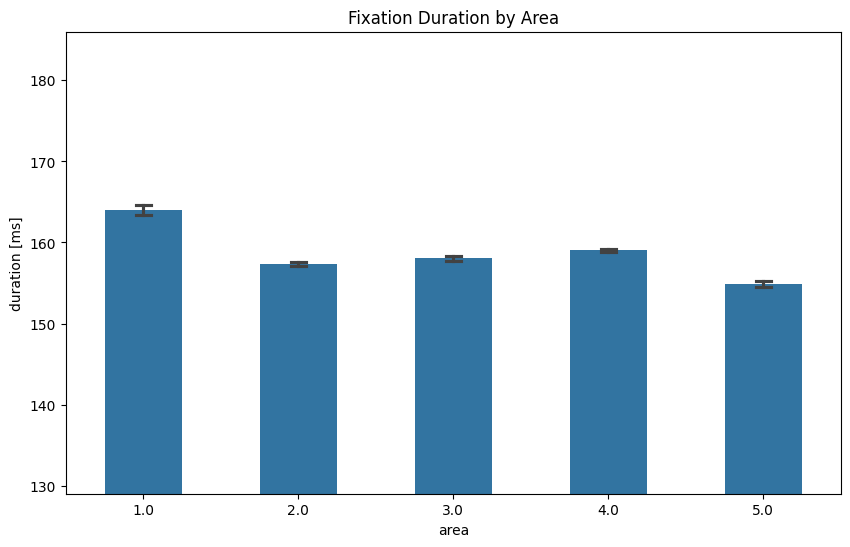

In [11]:
# Barplot
plt.figure(figsize=(10, 6))
sns.barplot(
    data=df,
    x='area',
    y='duration',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=0.5,
)
plt.title('Fixation Duration by Area')
plt.xlabel('area')
plt.ylabel('duration [ms]')
plt.ylim(129, 186)
plt.show()

##### Area-based (per participant)
- individual differences are consistent through the areas

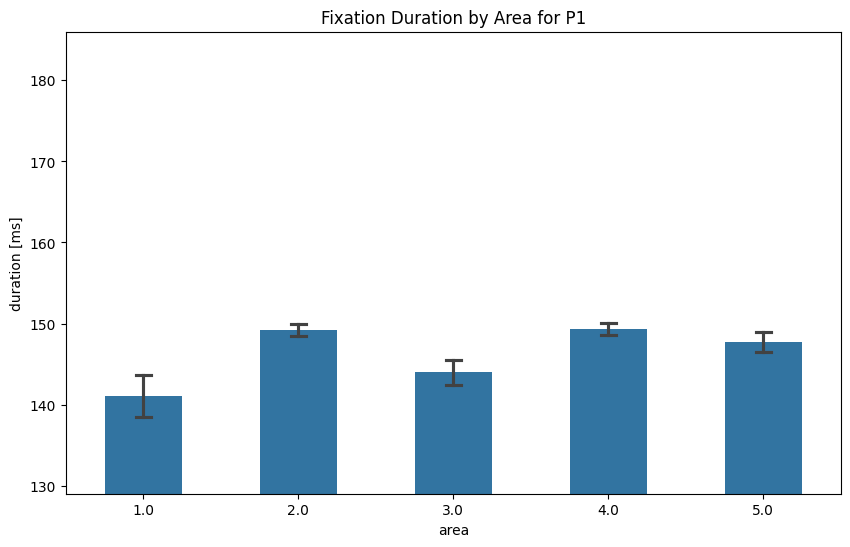

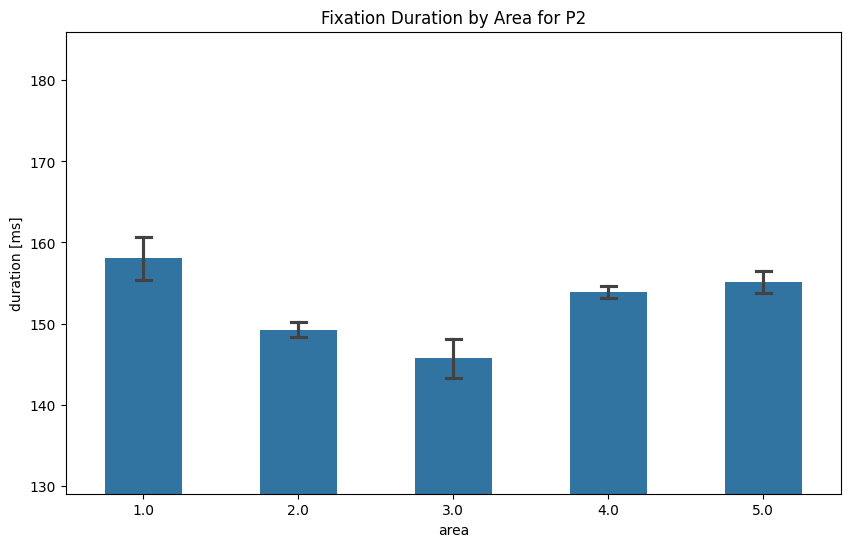

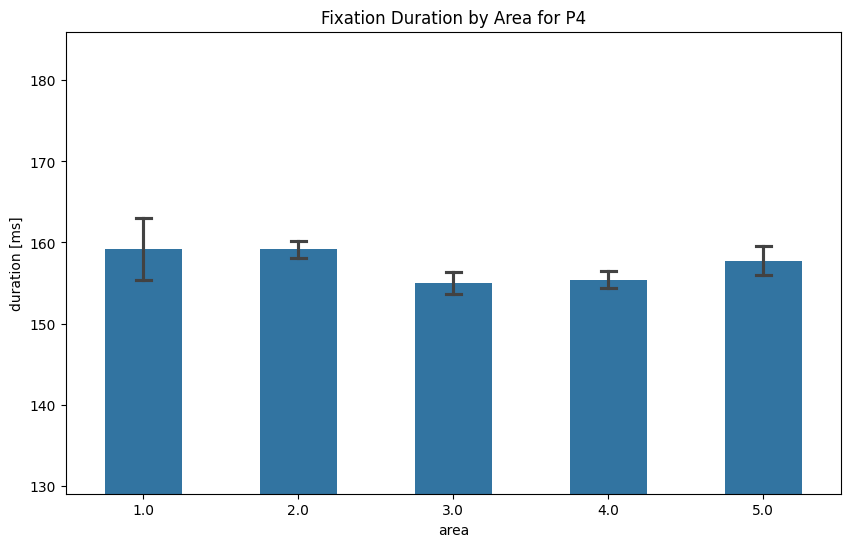

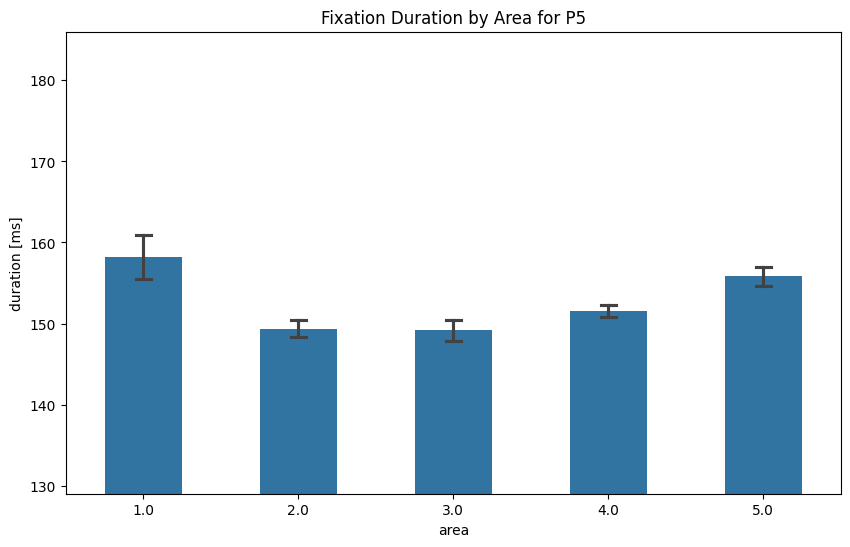

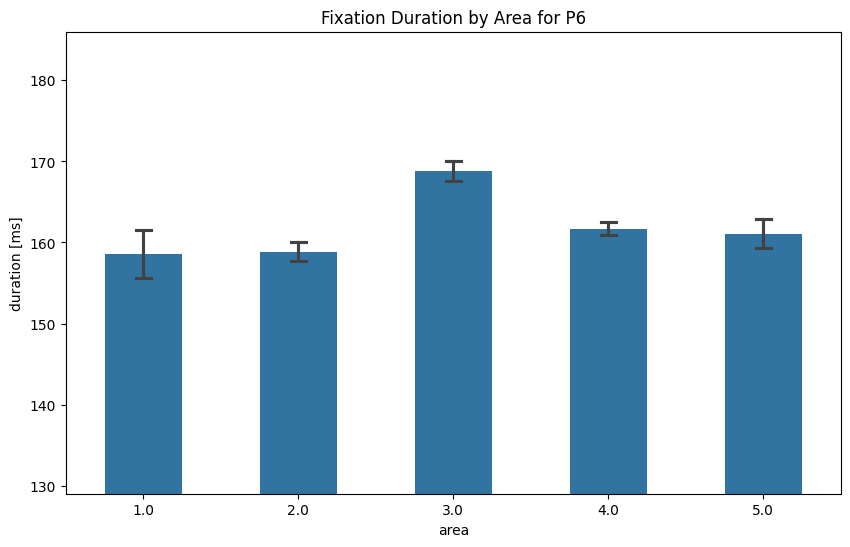

...

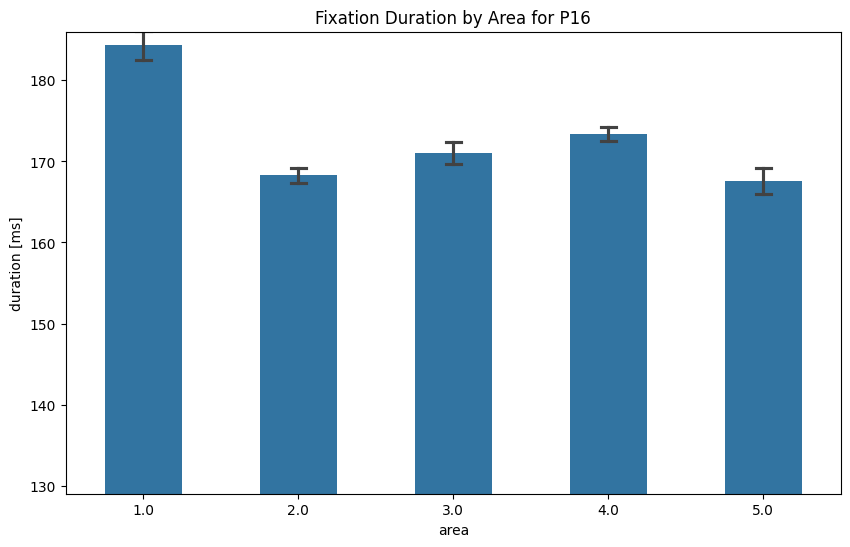

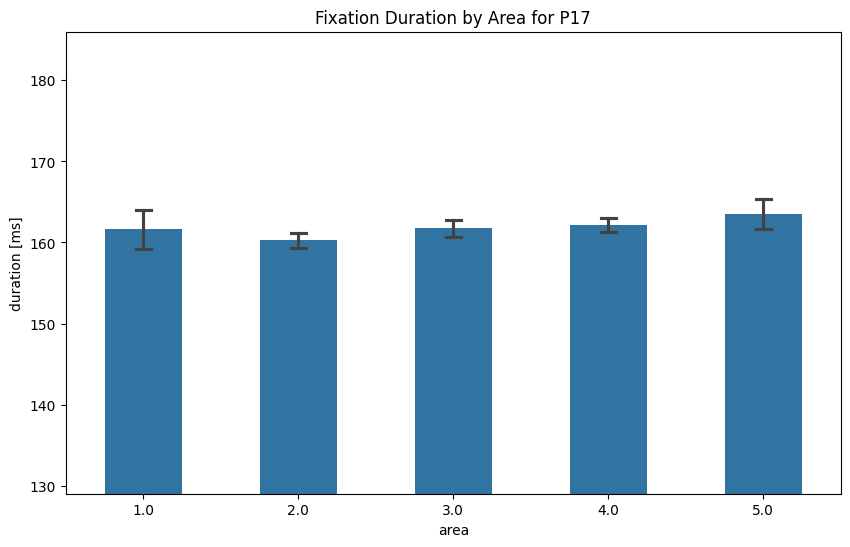

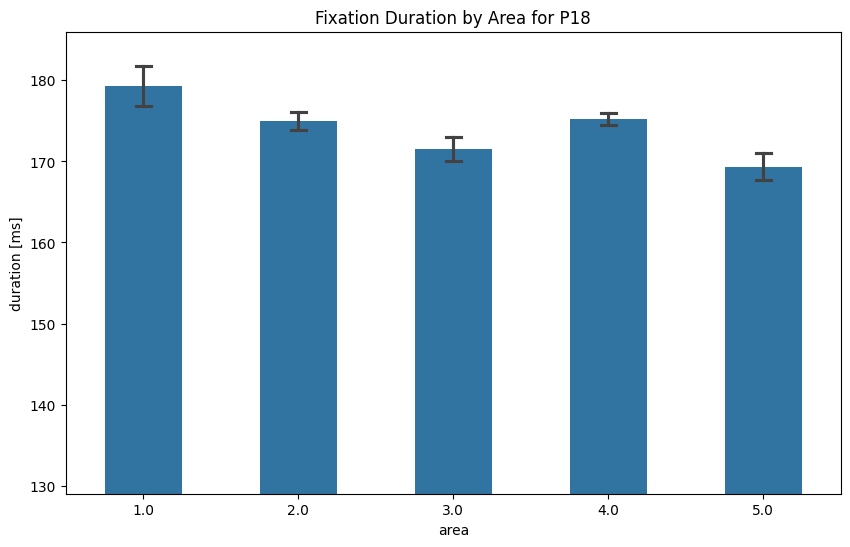

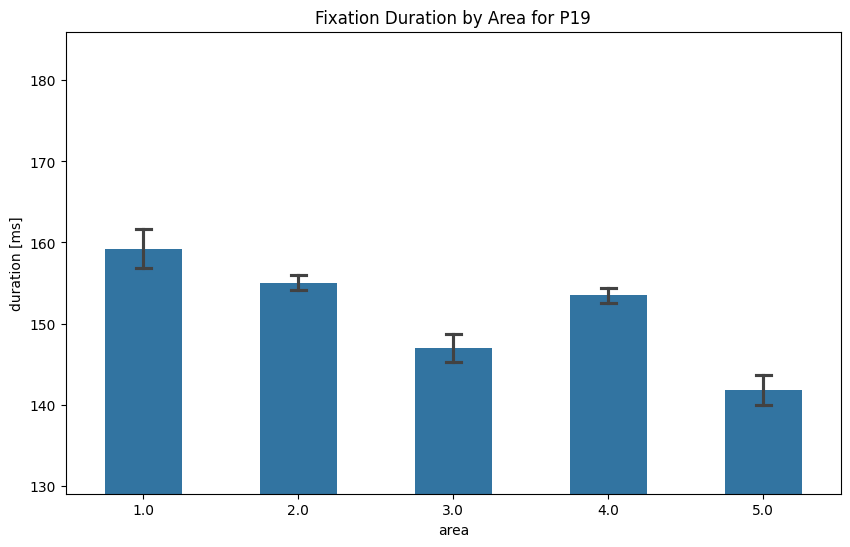

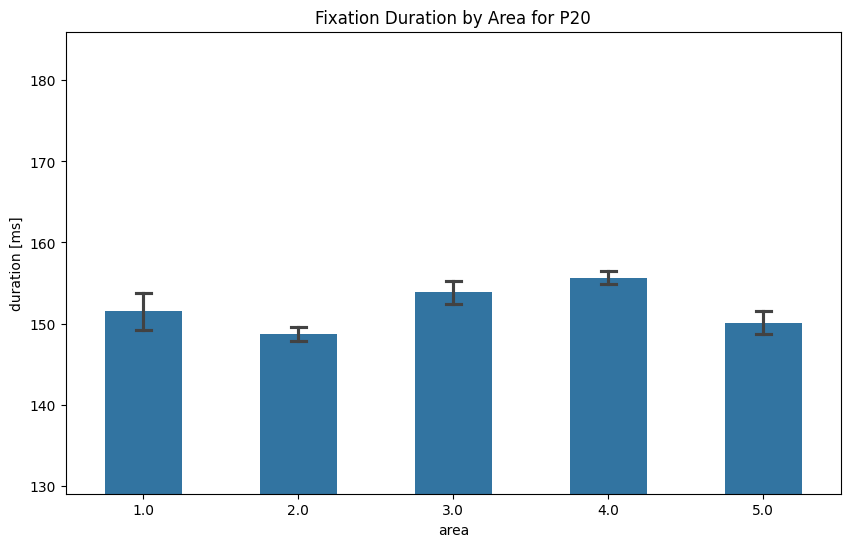

In [11]:
# Barplot per participant
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")

    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=p_df,
        x='area',
        y='duration',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=0.5,
    )
    plt.title(f'Fixation Duration by Area for P{pid}')
    plt.xlabel('area')
    plt.ylabel('duration [ms]')
    plt.ylim(129, 186)
    plt.show()

##### Area- & condition- based
- A1: Longer fix in easy
- A2: Shorter fix in hard-fast
- A3: Longer fix in slow
- A4: No differences
- A5: Longer fix in hard

C:\Users\vale_ad\AppData\Local\Temp\ipykernel_6376\775788038.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])


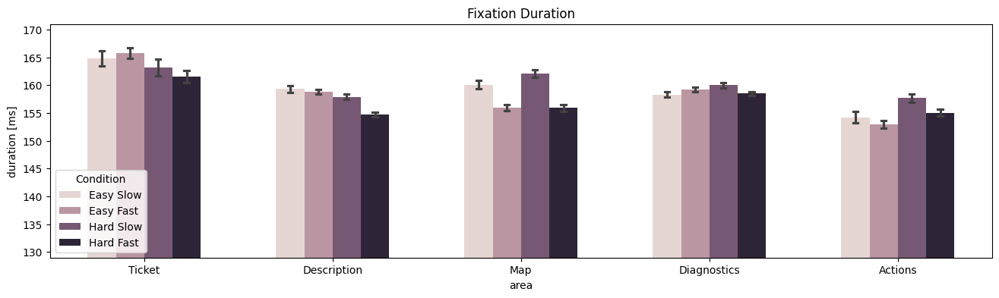

In [17]:
# Barplot
plt.figure(figsize=(16, 4))
ax = sns.barplot(
    data=df,
    x='area',
    y='duration',
    hue='condition',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=.6,
    palette=custom_palette
)

plt.title('Fixation Duration')
plt.xlabel('area')
plt.ylabel('duration [ms]')
plt.ylim(129, 171)

ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles, custom_labels, title='Condition', loc='lower left')
plt.tick_params(axis='both', which='major')
plt.show()

In [29]:
# Summary stats
mean = df.query("area == 1")['duration'].mean()
se = df.query("area == 1")['duration'].sem()
print(f"Ticket duration: {mean:.2f} (~{se:.2f})")

mean = df.query("area == 3 and (condition == 1 or condition == 3)")['duration'].mean()
se = df.query("area == 3 and (condition == 1 or condition == 3)")['duration'].sem()
print(f"Map slow duration: {mean:.2f} (~{se:.2f})")

mean = df.query("area == 3 and (condition == 2 or condition == 4)")['duration'].mean()
se = df.query("area == 3 and (condition == 2 or condition == 4)")['duration'].sem()
print(f"Map fast duration: {mean:.2f} (~{se:.2f})")

Ticket duration: 164.03 (~0.58)
Map slow duration: 161.11 (~0.51)
Map fast duration: 155.94 (~0.42)


##### Area- & condition- based (per participant)
- (...)

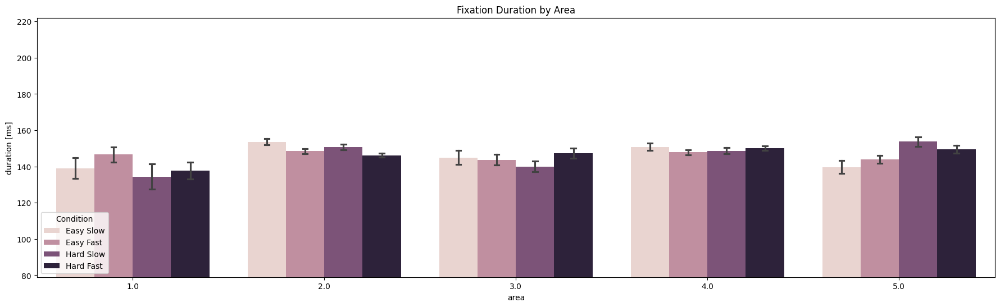

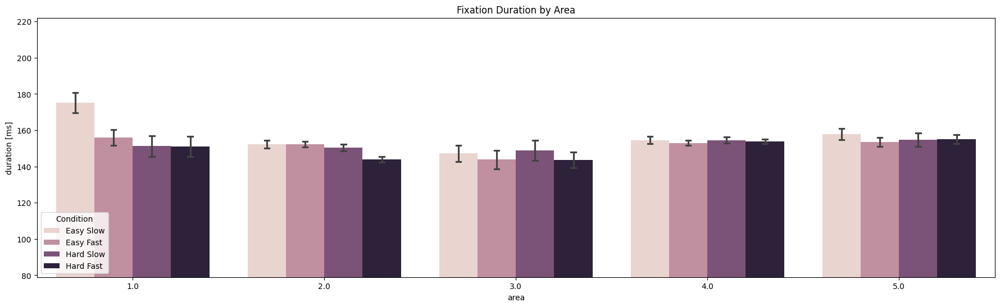

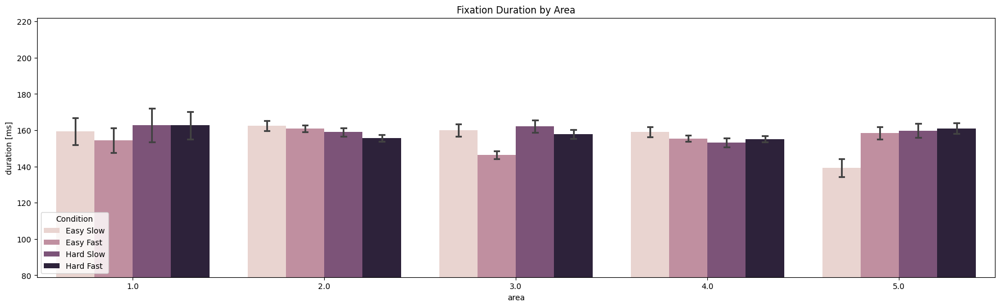

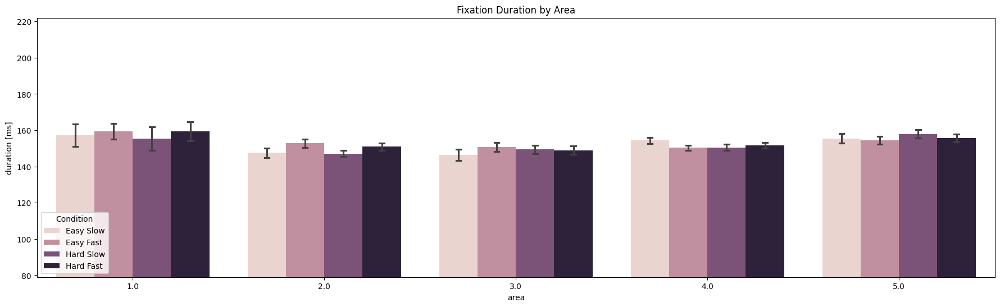

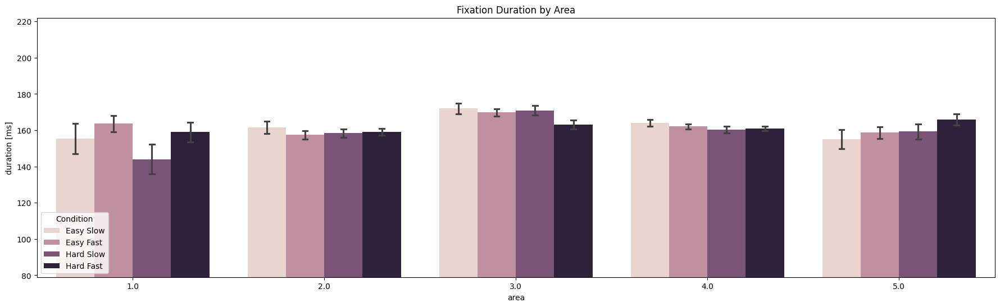

...

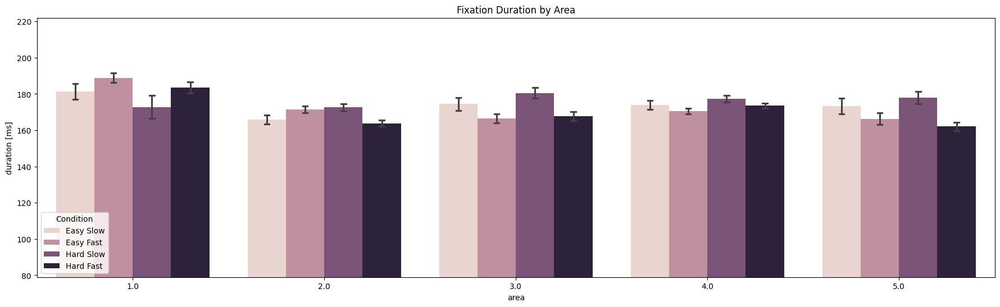

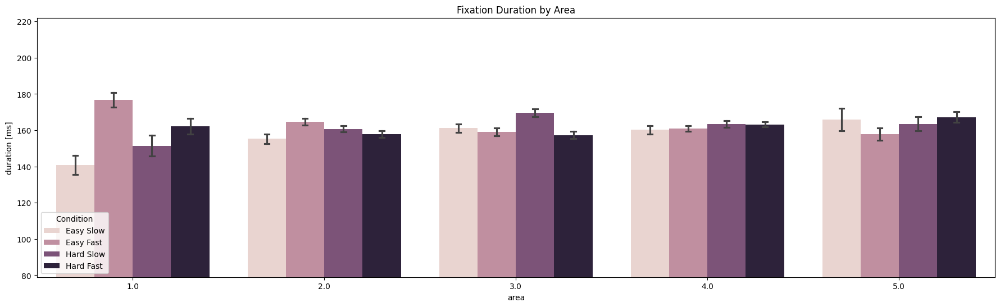

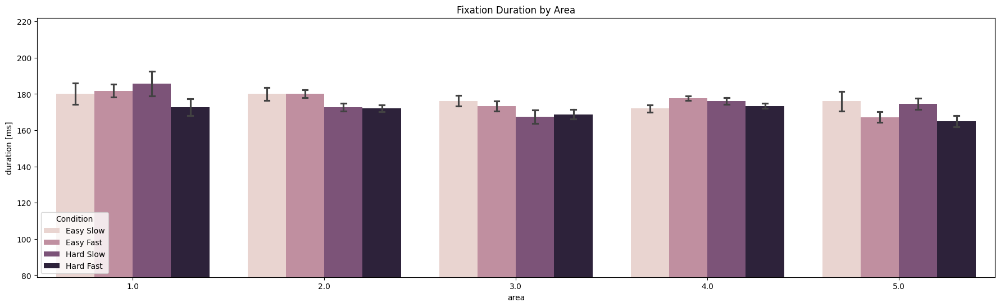

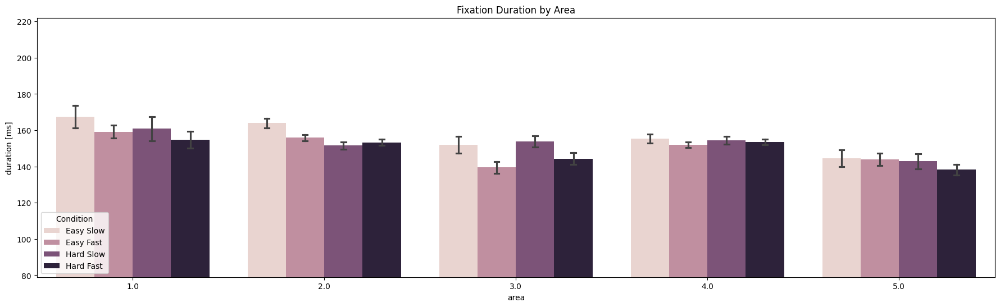

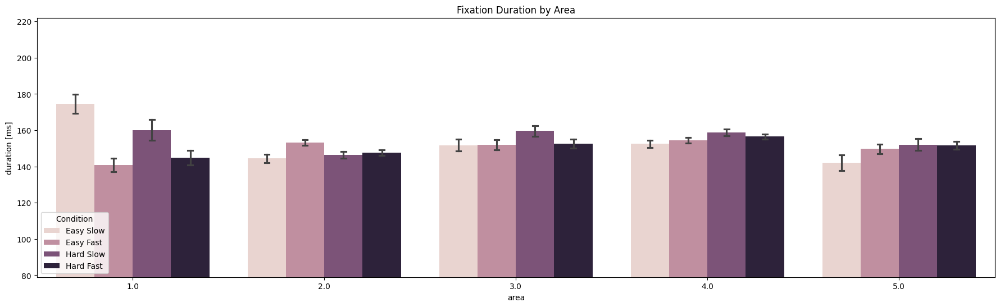

In [13]:
# Barplot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")
    plt.figure(figsize=(22, 6))
    ax = sns.barplot(
        data=p_df,
        x='area',
        y='duration',
        hue='condition',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=.8,
    )

    plt.title('Fixation Duration by Area')
    plt.xlabel('area')
    plt.ylabel('duration [ms]')
    plt.ylim(79, 222)

    handles, labels = ax.get_legend_handles_labels()
    plt.legend(handles, custom_labels, title='Condition', loc='lower left')
    plt.show()

### 3. Fixation Dispersion
Area- & condition based, per participant

##### Area-based
- A1: less dispersed

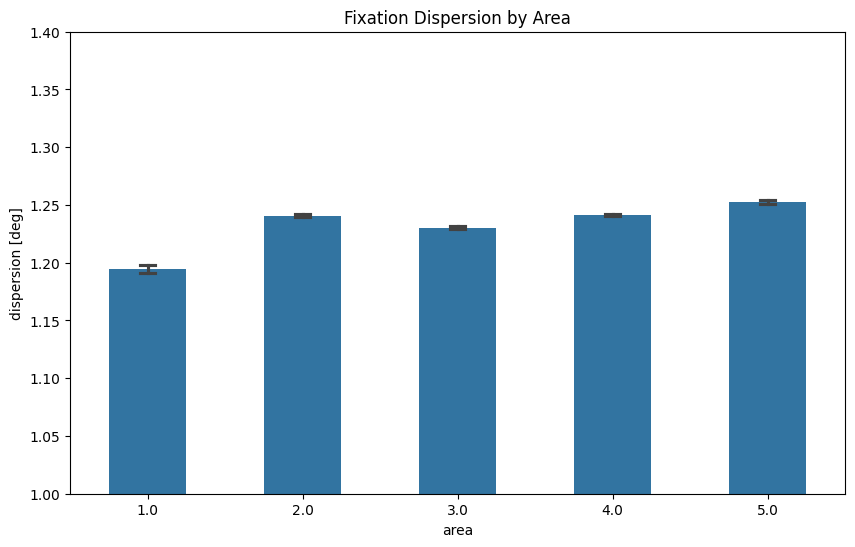

In [14]:
# Barplot
plt.figure(figsize=(10, 6))
sns.barplot(
    data=df,
    x='area',
    y='dispersion',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=0.5,
)
plt.title('Fixation Dispersion by Area')
plt.xlabel('area')
plt.ylabel('dispersion [deg]')
plt.ylim(1, 1.4)
plt.show()

##### Area-based (per participant)
- (...)

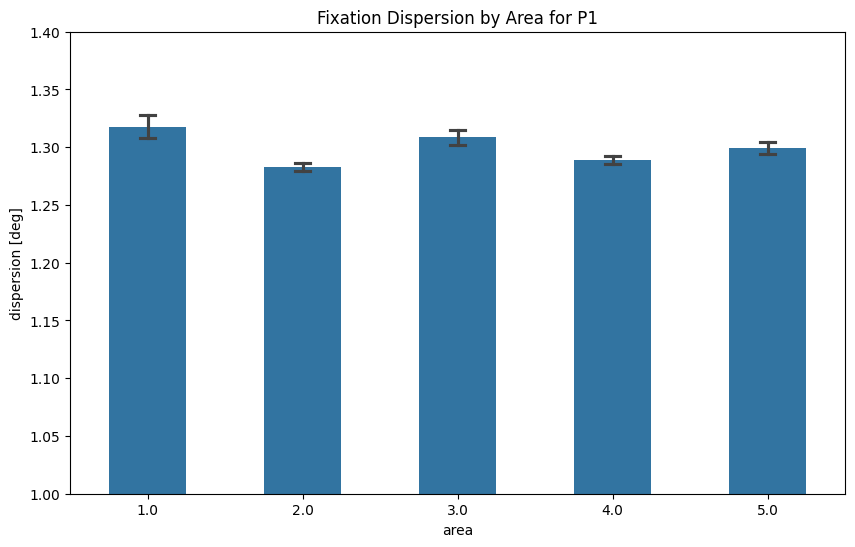

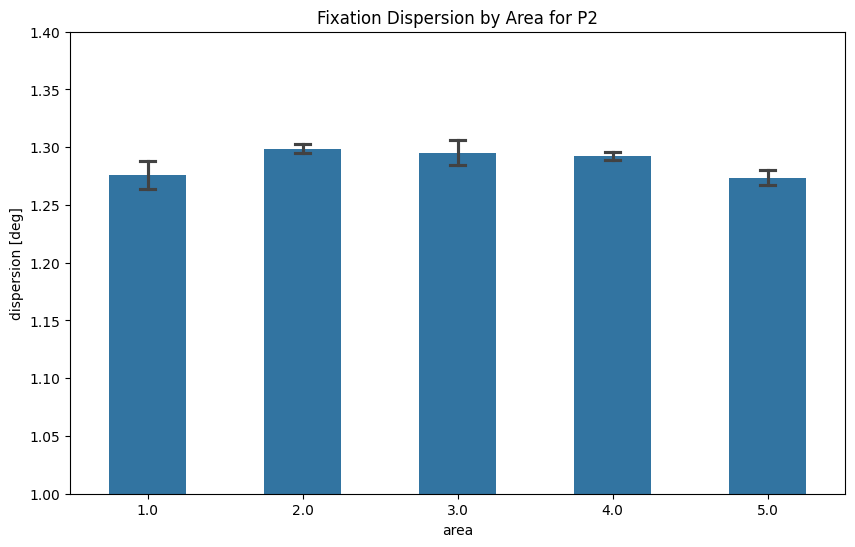

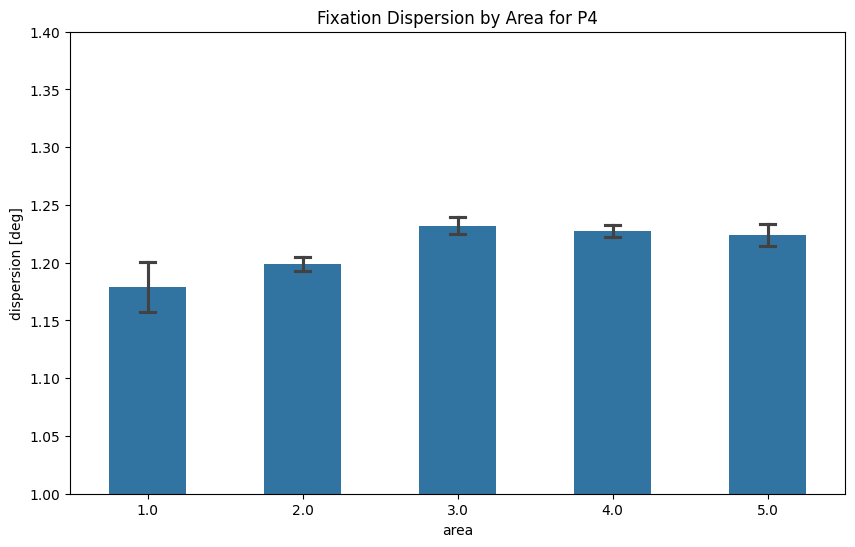

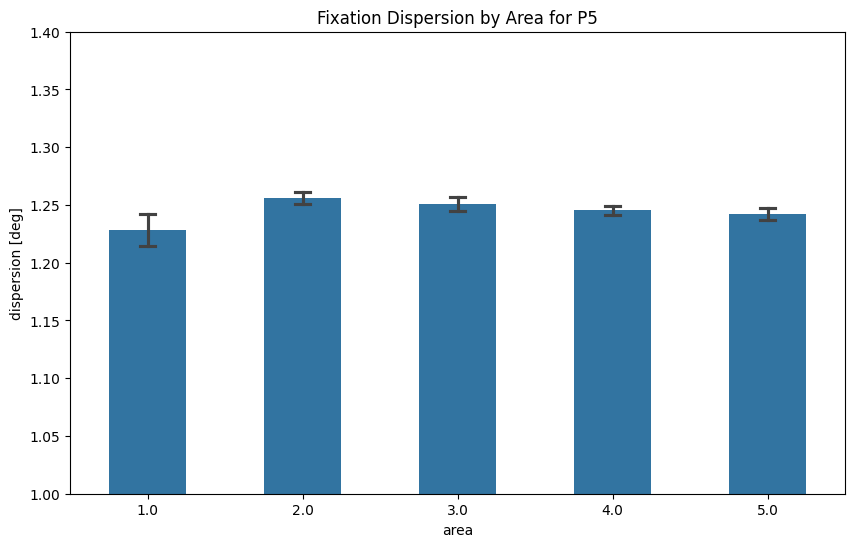

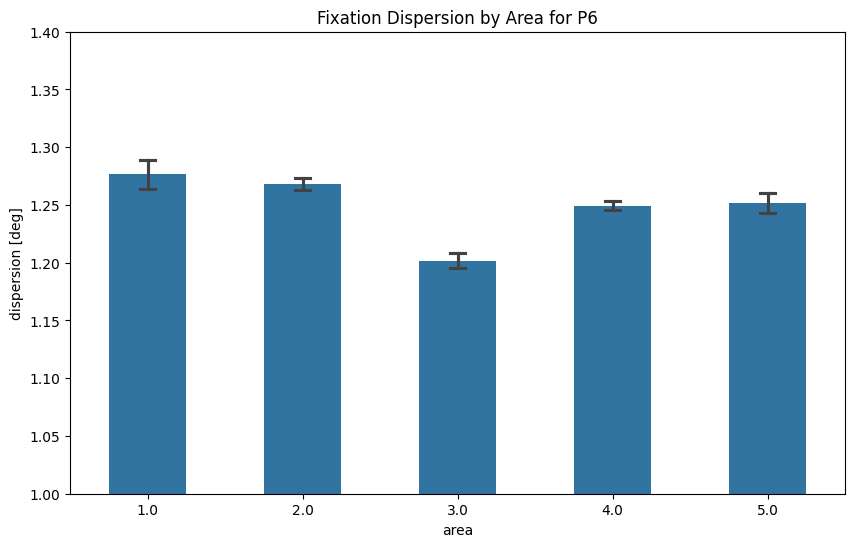

...

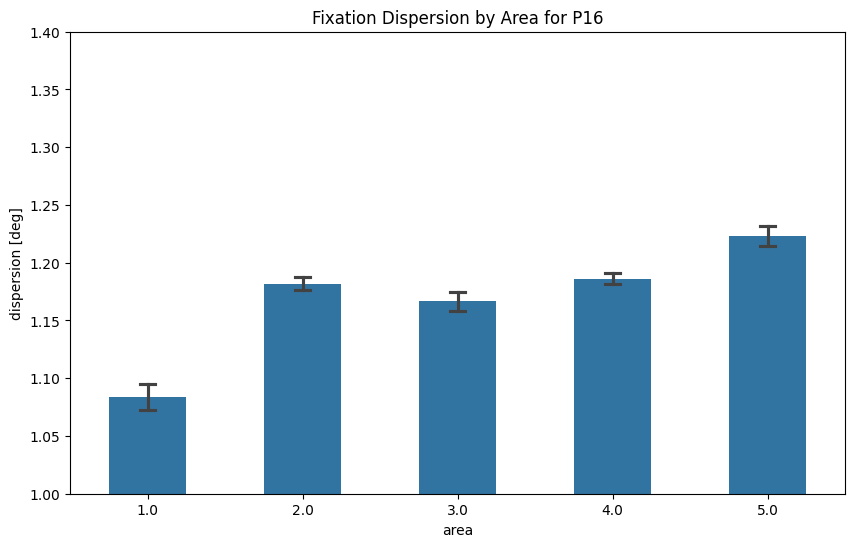

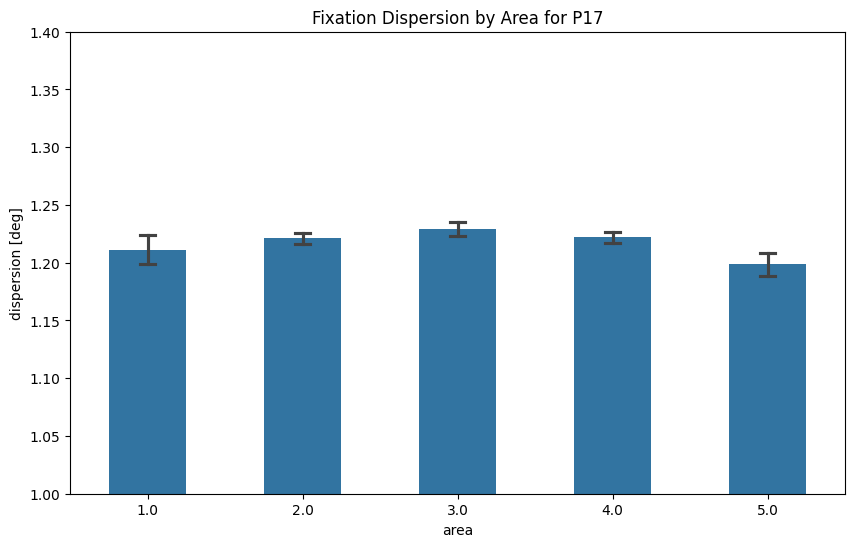

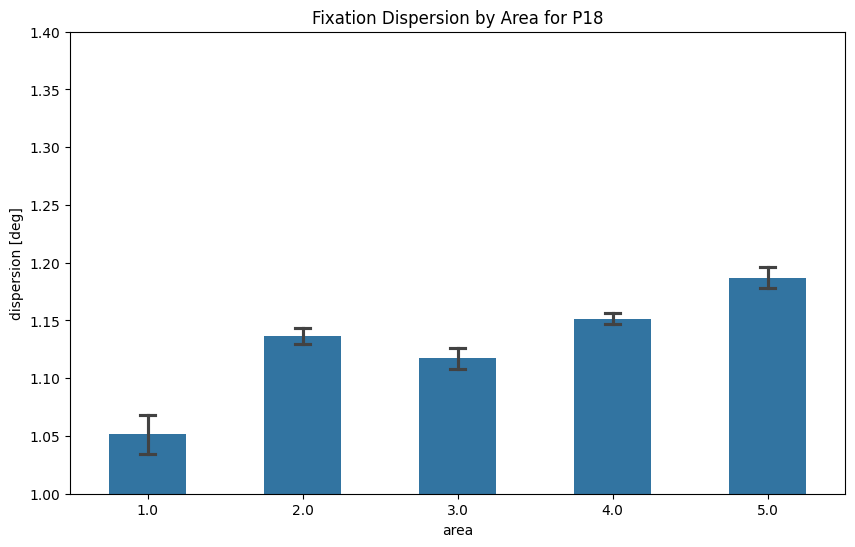

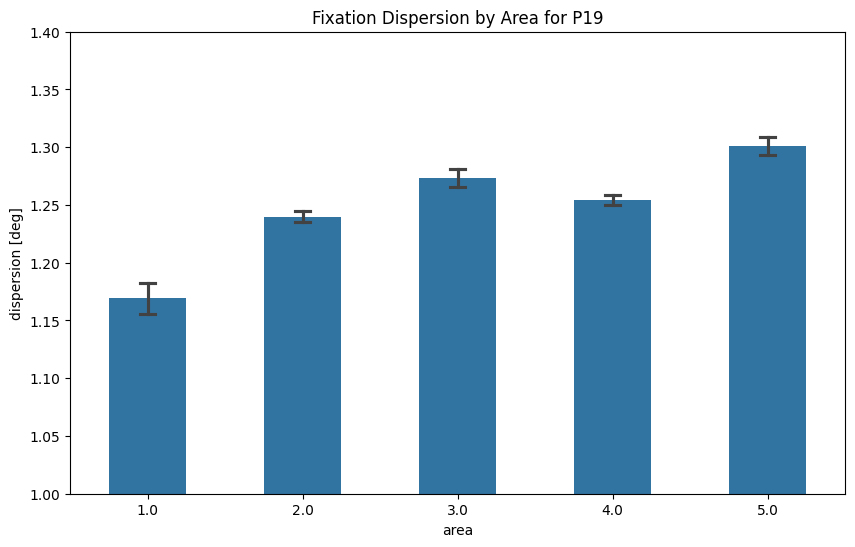

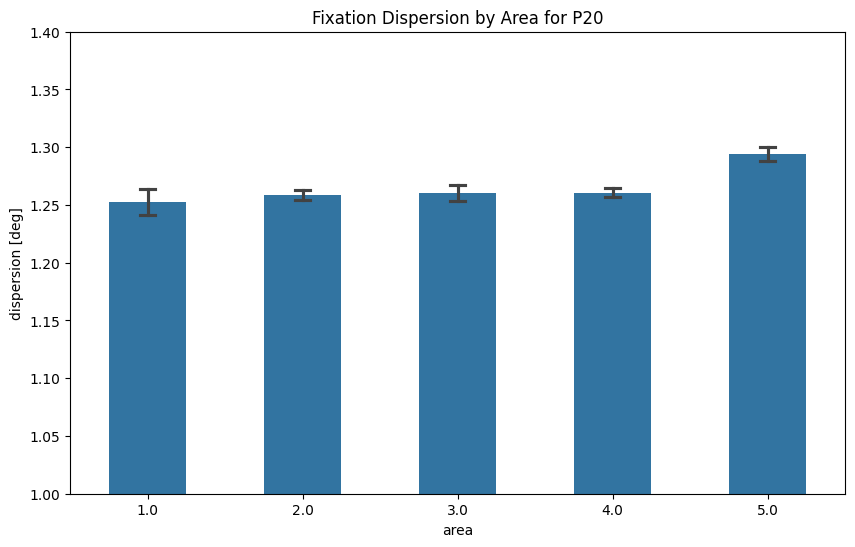

In [15]:
# Barplot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")

    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=p_df,
        x='area',
        y='dispersion',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=0.5,
    )
    plt.title(f'Fixation Dispersion by Area for P{pid}')
    plt.xlabel('area')
    plt.ylabel('dispersion [deg]')
    plt.ylim(1, 1.4)
    plt.show()

##### Area- & condition- based
- A1: more dispersed in hard-fast
- A2: no differences
- A3: more dispersed in fast
- A4: no differences
- A5: no differences

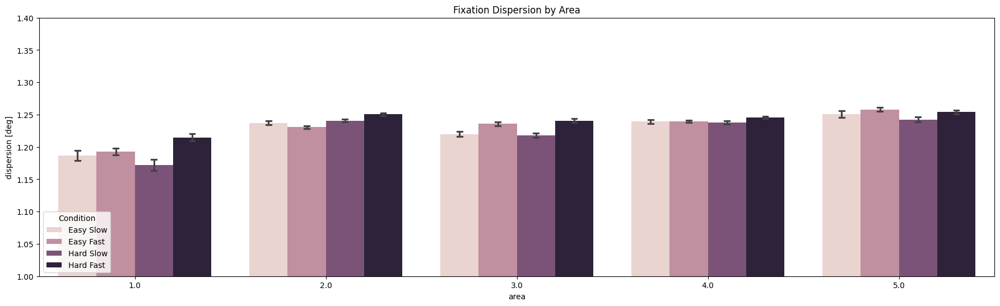

In [16]:
# Barplot
plt.figure(figsize=(22, 6))
ax = sns.barplot(
    data=df,
    x='area',
    y='dispersion',
    hue='condition',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=.8,
)

plt.title('Fixation Dispersion by Area')
plt.xlabel('area')
plt.ylabel('dispersion [deg]')
plt.ylim(1, 1.4)

handles, labels = ax.get_legend_handles_labels()
plt.legend(handles, custom_labels, title='Condition', loc='lower left')
plt.show()

##### Area- & condition- based (per participant)
- (...)

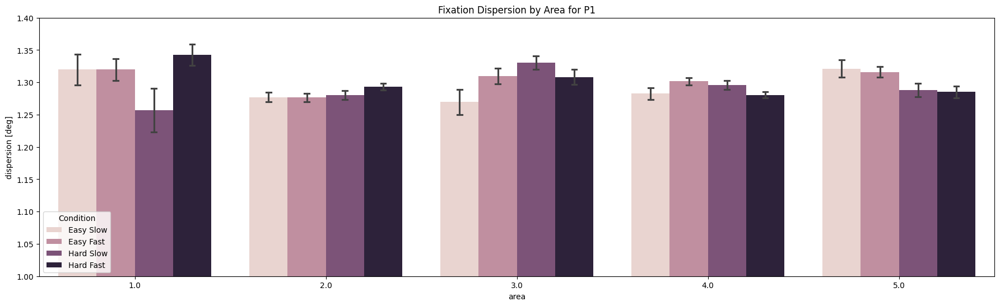

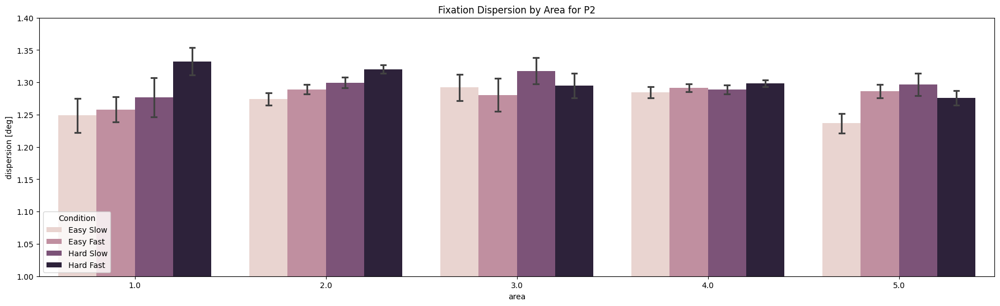

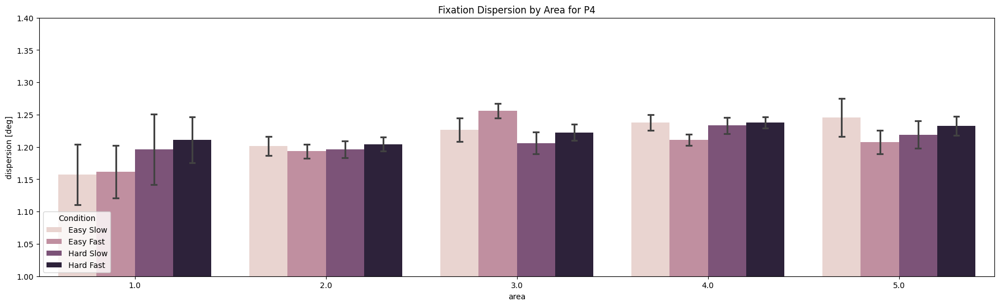

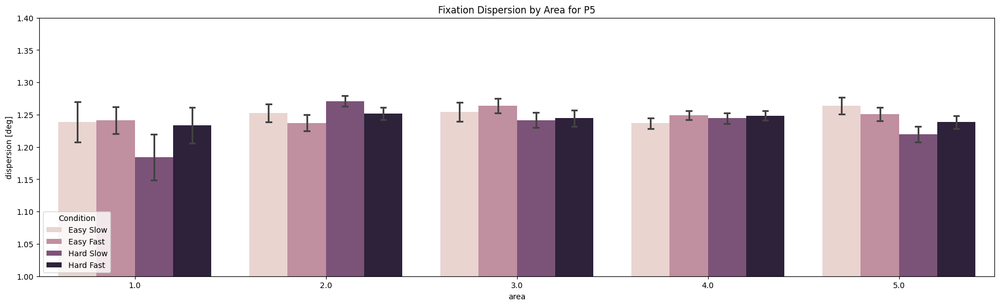

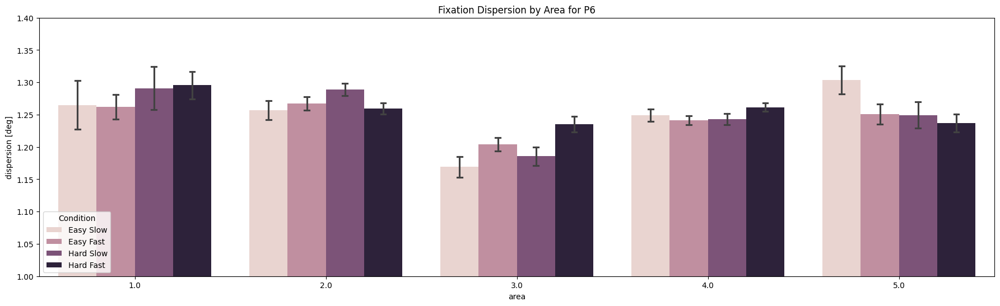

...

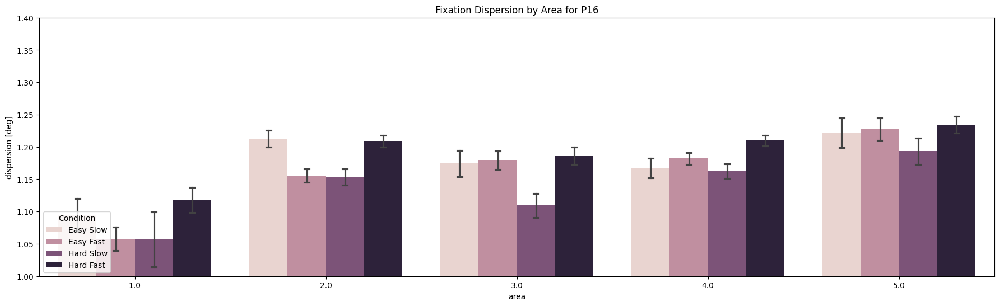

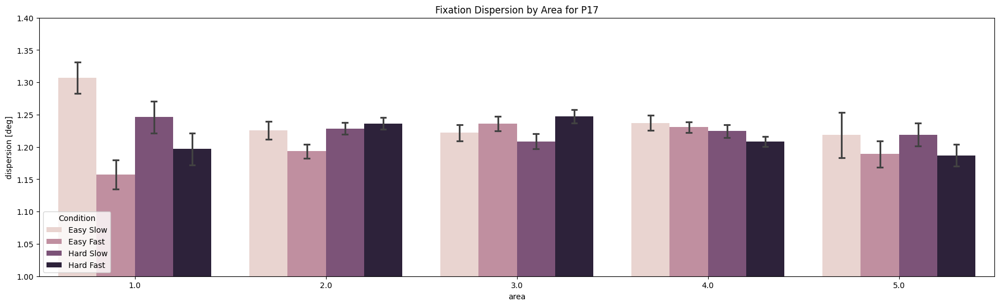

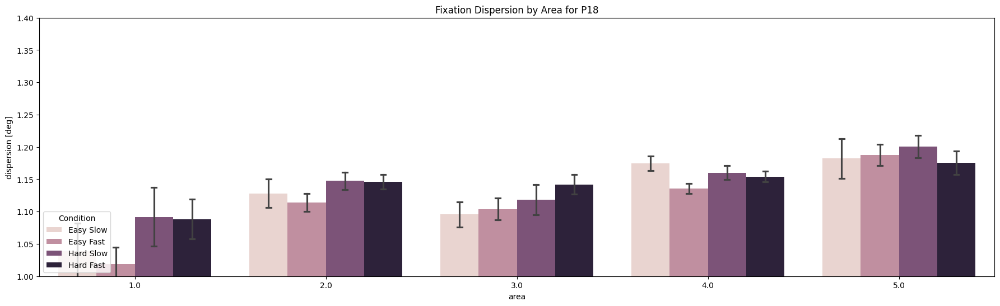

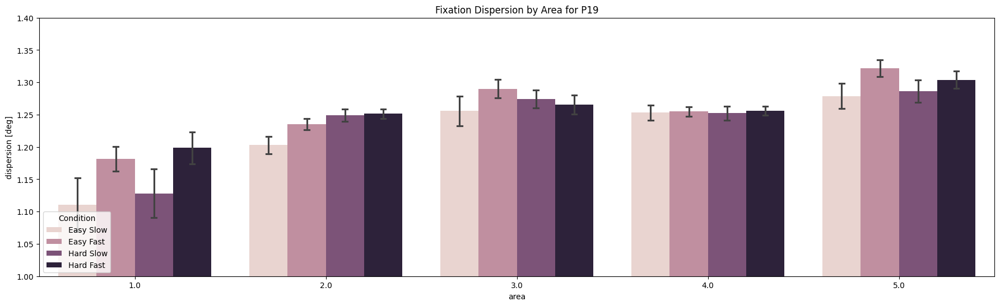

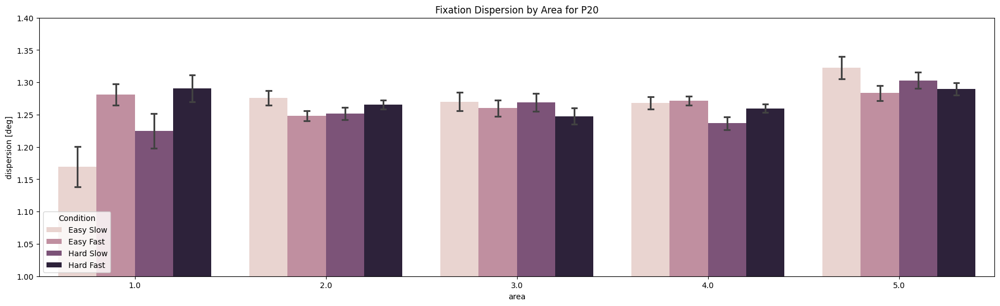

In [17]:
# Barplot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")
    plt.figure(figsize=(22, 6))
    ax = sns.barplot(
        data=p_df,
        x='area',
        y='dispersion',
        hue='condition',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=.8,
    )
    
    plt.title(f'Fixation Dispersion by Area for P{pid}')
    plt.xlabel('area')
    plt.ylabel('dispersion [deg]')
    plt.ylim(1, 1.4)

    handles, labels = ax.get_legend_handles_labels()
    plt.legend(handles, custom_labels, title='Condition', loc='lower left')
    plt.show()

    

### 4. Fixation Count
Area- & condition based, per participant

##### Area-based
- A2 and A4 with more fixations
- A1 less fixation

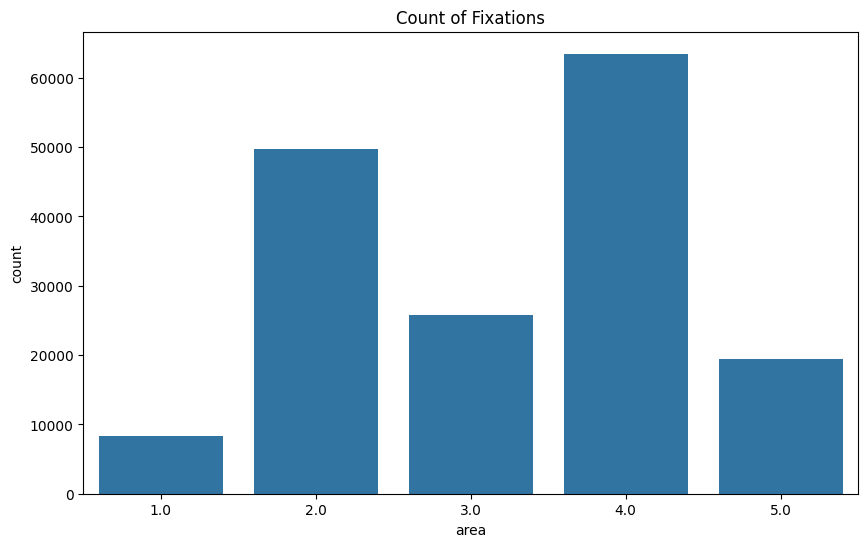

In [18]:
# count plot
plt.figure(figsize=(10, 6))
sns.countplot(
    x=df['area'],
    order=sorted(df['area'].dropna().unique())  # Sort areas and drop NaN for cleaner plot
)
plt.xlabel('area')
plt.ylabel('count')
plt.title('Count of Fixations')
plt.show()

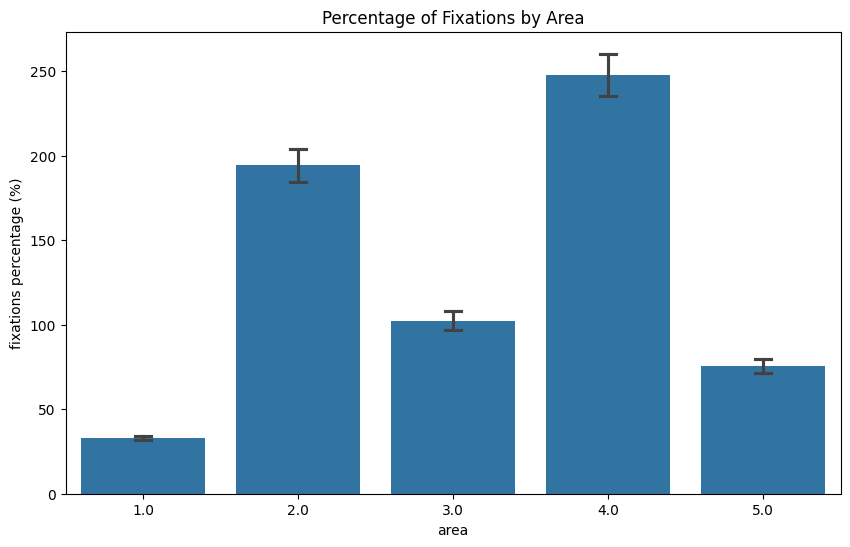

In [13]:
# Count percentage plot
area_counts = (
    df.groupby(['participant_id', 'area', 'task_id'])
    .size()
    .reset_index(name='fix_count')
)

plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=area_counts,
    x='area',
    y='fix_count',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=.8,
)

plt.title('Percentage of Fixations by Area')
plt.xlabel('area')
plt.ylabel('fixations percentage (%)')

plt.show()

##### Area-based (per participant)
- (...)

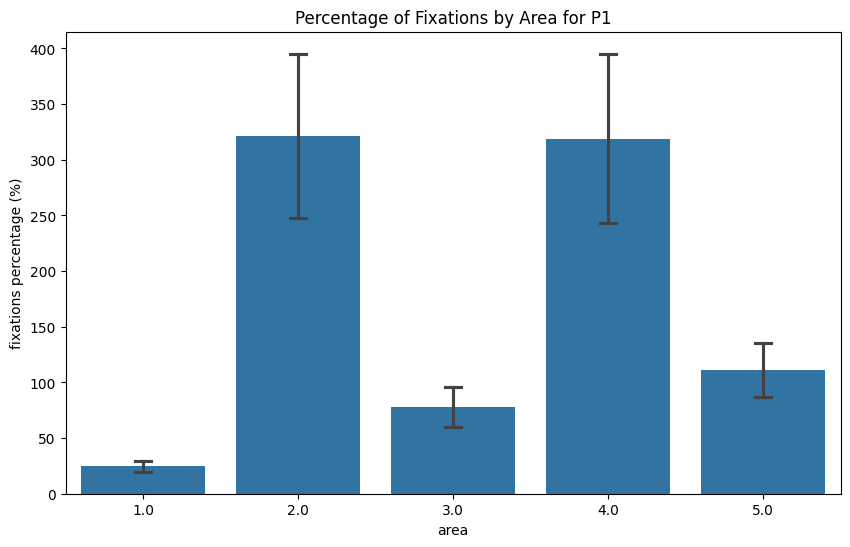

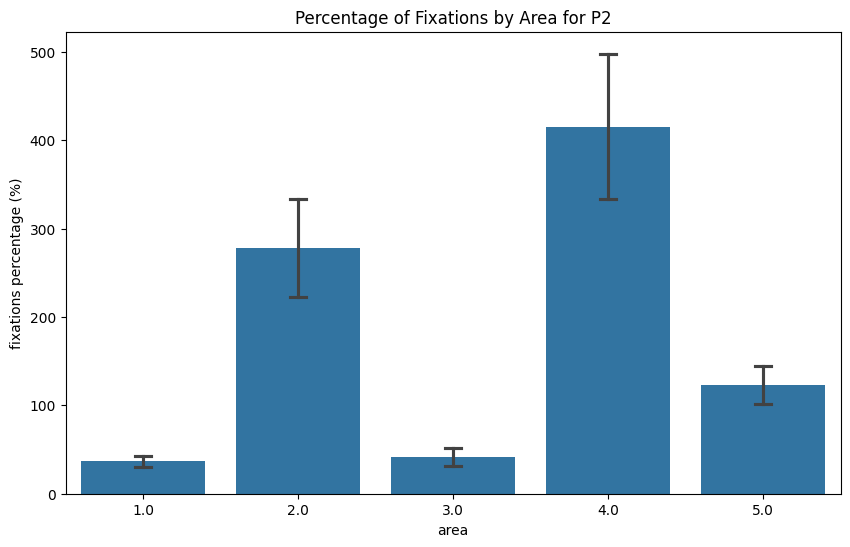

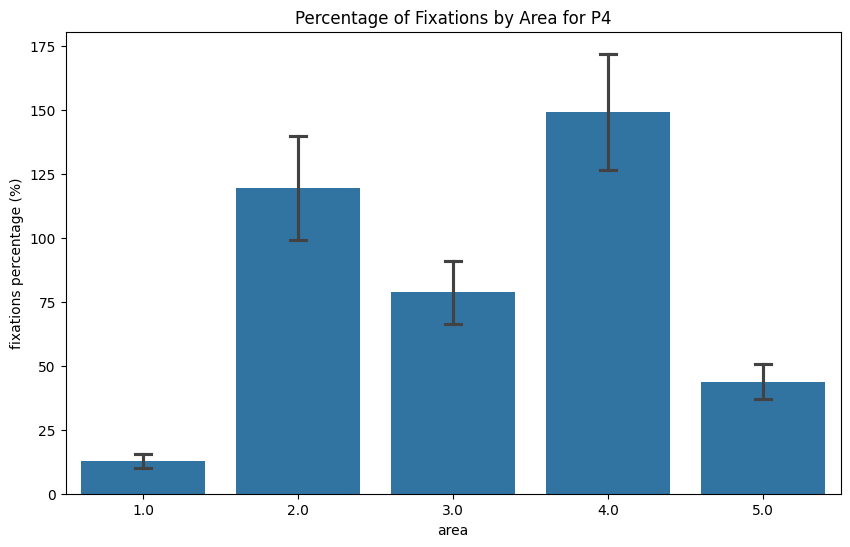

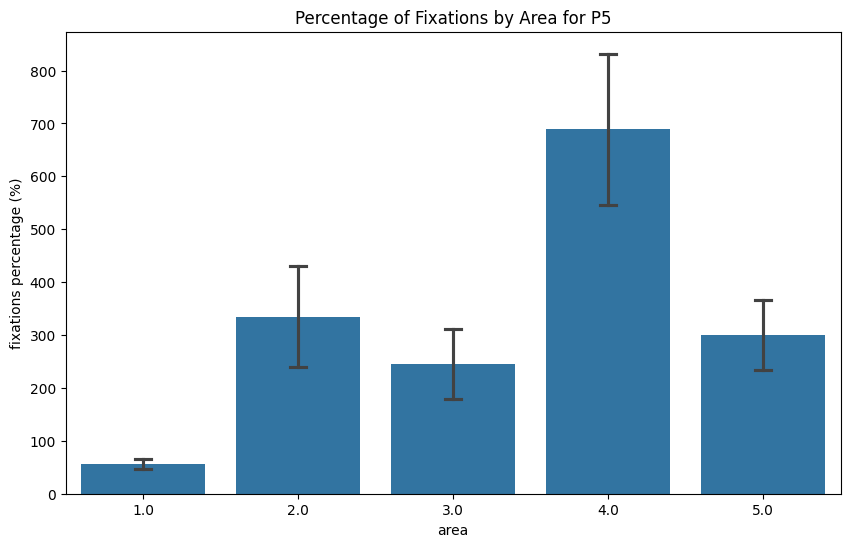

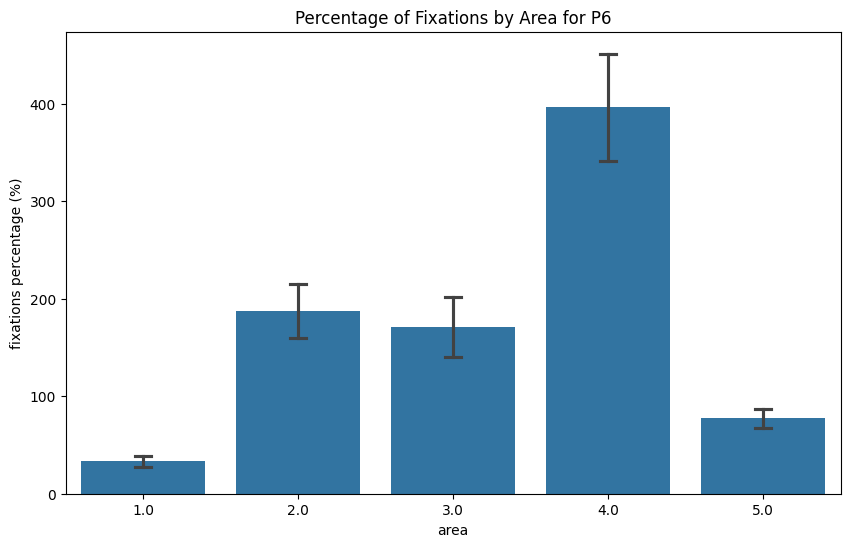

...

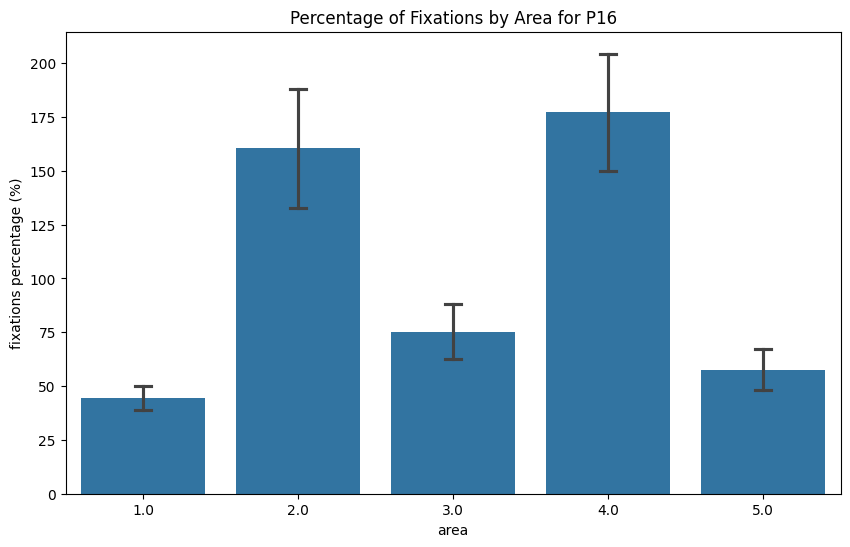

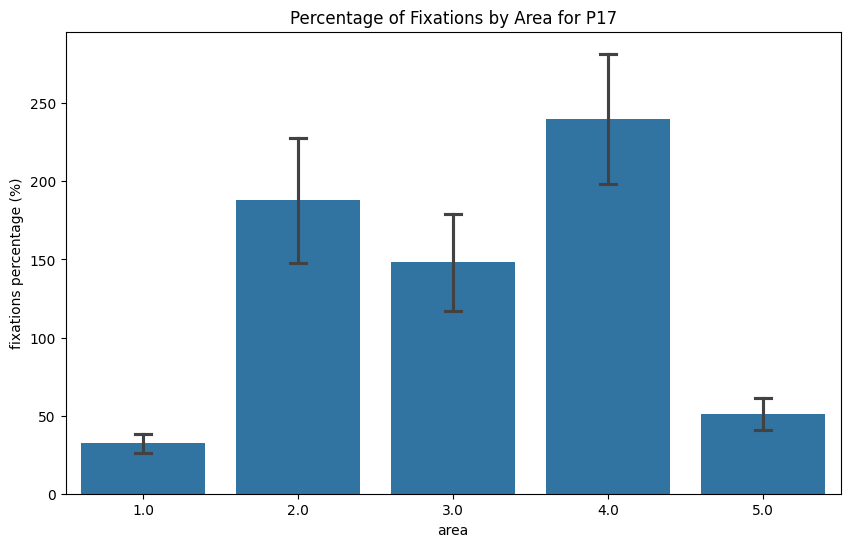

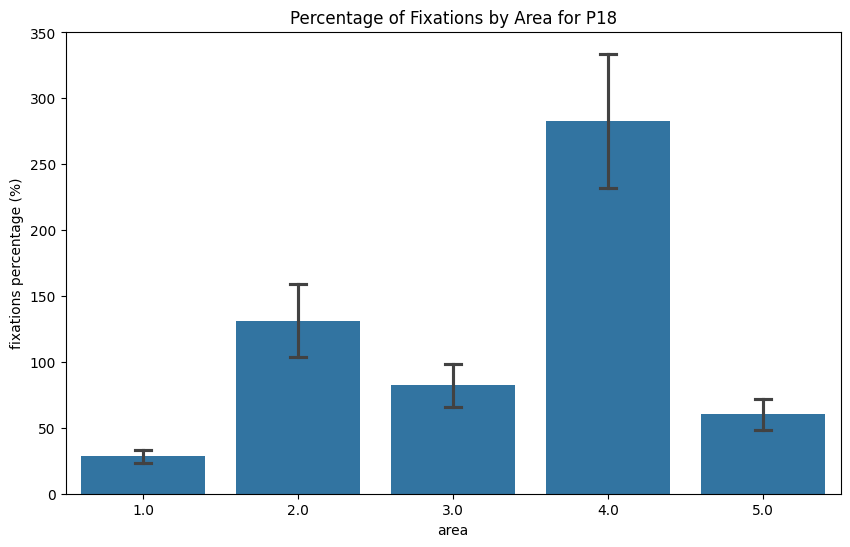

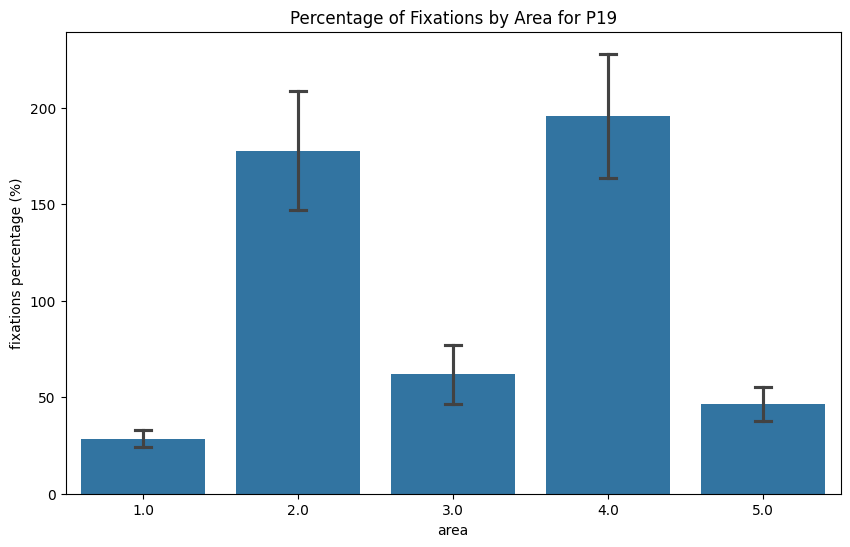

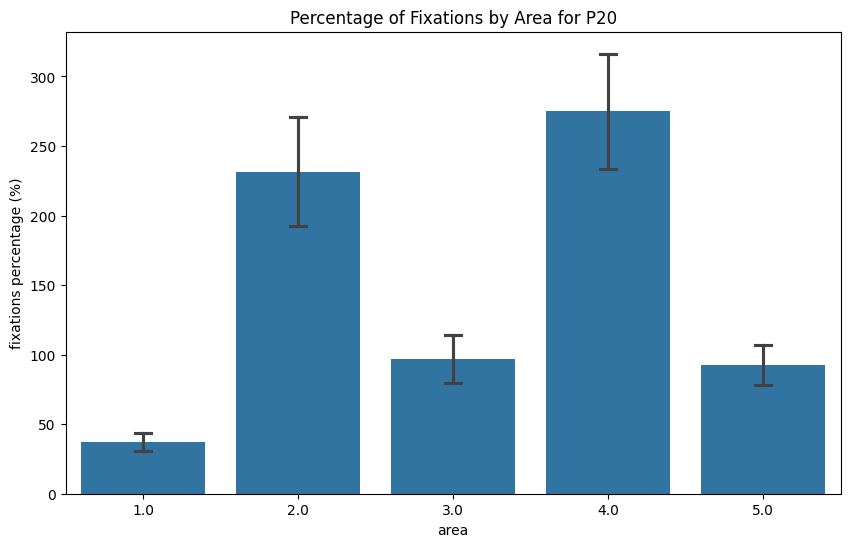

In [14]:
# Count percentage plot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")
    p_area_counts = (
        p_df.groupby(['participant_id', 'area', 'task_id'])
        .size()
        .reset_index(name='fix_count')
    )

    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=p_area_counts,
        x='area',
        y='fix_count',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=.8,
    )

    plt.title(f'Percentage of Fixations by Area for P{pid}')
    plt.xlabel('area')
    plt.ylabel('fixations percentage (%)')

    plt.show()

##### Area- & condition- based
- A1: More fix in easy
- A2: More fix in hard
- A3: More fix in easy-slow
- A4: More fix in fast
- A5: Interaction effect

C:\Users\vale_ad\AppData\Local\Temp\ipykernel_6376\1949265810.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])


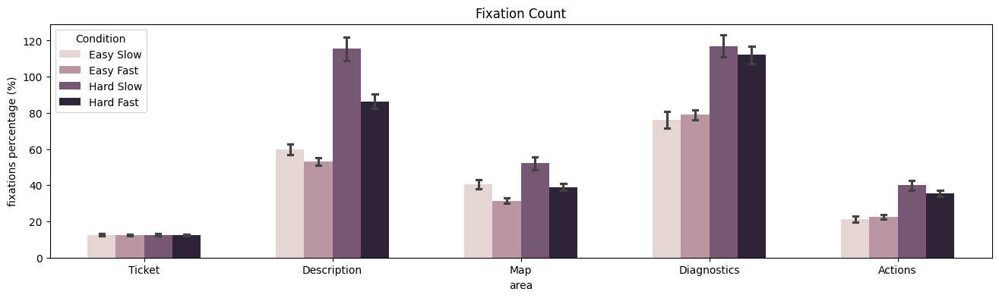

In [16]:
# Barplot
area_condition_counts = (
    df.groupby(['participant_id', 'area', 'condition', 'task_id'])
    .size()
    .reset_index(name='fix_count')
)

plt.figure(figsize=(16, 4))
ax = sns.barplot(
    data=area_condition_counts,
    x='area',
    y='fix_count',
    hue='condition',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=.6,
    palette=custom_palette
)

plt.title('Fixation Count')
plt.xlabel('area')
plt.ylabel('fixations percentage (%)')

ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles, custom_labels, title='Condition', loc='upper left')

plt.show()

In [38]:
# Summary stats
mean = area_condition_counts.query("area == 1")['fix_count'].mean()
se = area_condition_counts.query("area == 1")['fix_count'].sem()
print(f"Ticket fix count: {mean:.2f} (~{se:.2f})")

mean = area_condition_counts.query("area == 2")['fix_count'].mean()
se = area_condition_counts.query("area == 2")['fix_count'].sem()
print(f"Description fix count: {mean:.2f} (~{se:.2f})")

mean = area_condition_counts.query("area == 4")['fix_count'].mean()
se = area_condition_counts.query("area == 4")['fix_count'].sem()
print(f"Diagnostics fix count: {mean:.2f} (~{se:.2f})")

mean = area_condition_counts.query("condition == 1 or condition == 2")['fix_count'].mean()
se = area_condition_counts.query("condition == 1 or condition == 2")['fix_count'].sem()
print(f"Easy fix count: {mean:.2f} (~{se:.2f})")

mean = area_condition_counts.query("condition == 3 or condition == 4")['fix_count'].mean()
se = area_condition_counts.query("condition == 3 or condition == 4")['fix_count'].sem()
print(f"Hard fix count: {mean:.2f} (~{se:.2f})")

Ticket fix count: 12.45 (~0.25)
Description fix count: 73.51 (~2.01)
Diagnostics fix count: 93.89 (~2.24)
Easy fix count: 40.57 (~0.87)
Hard fix count: 60.83 (~1.52)


##### Area- & condition- based (per participant)
- (...)

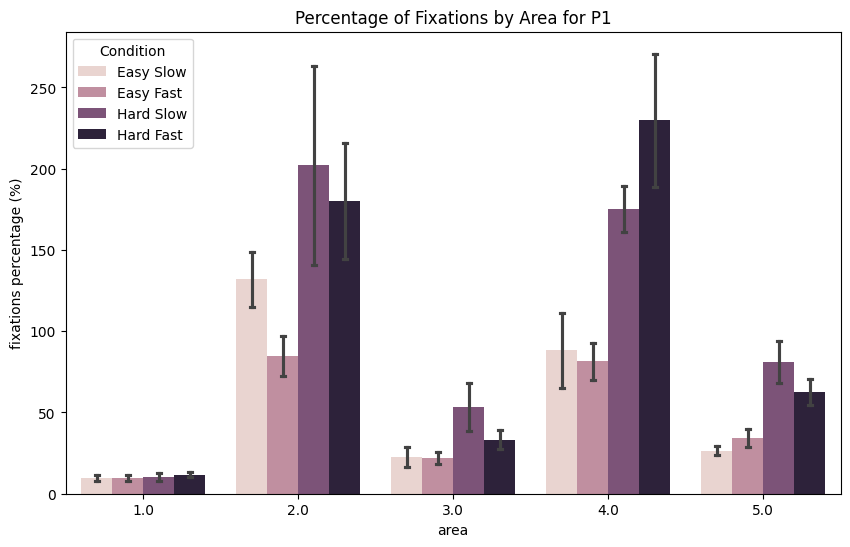

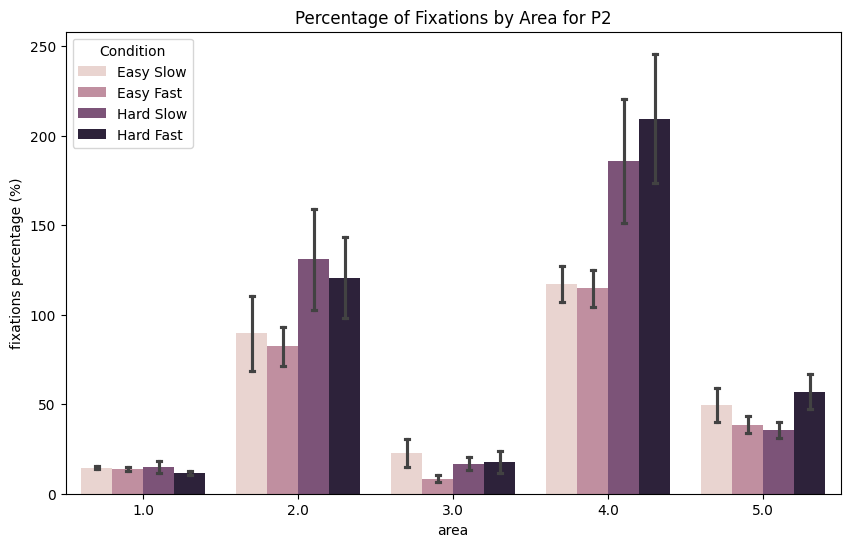

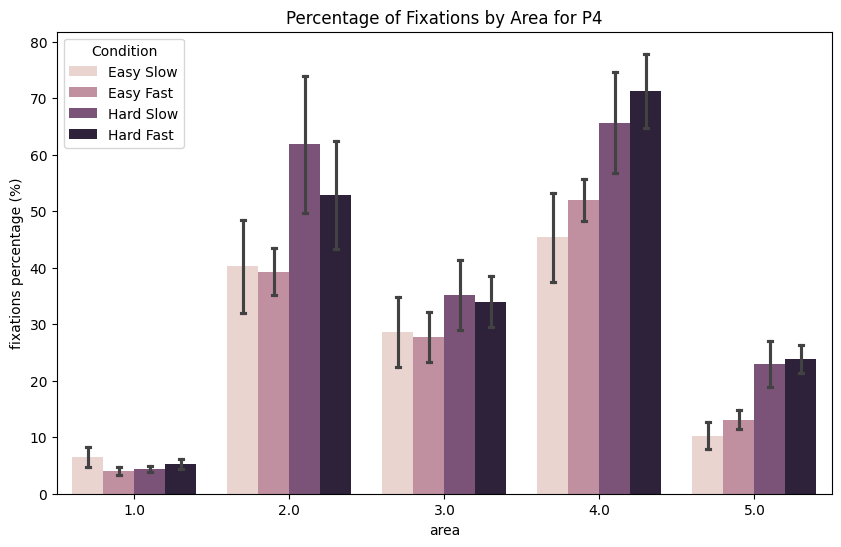

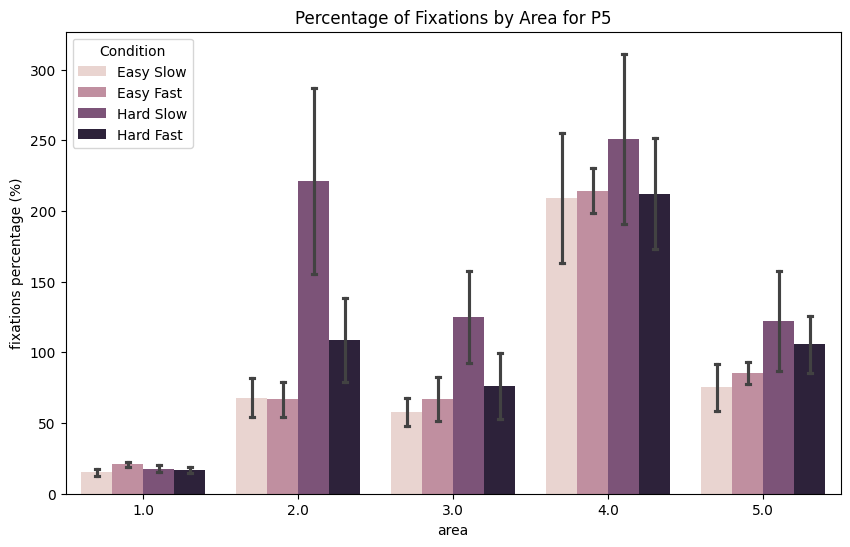

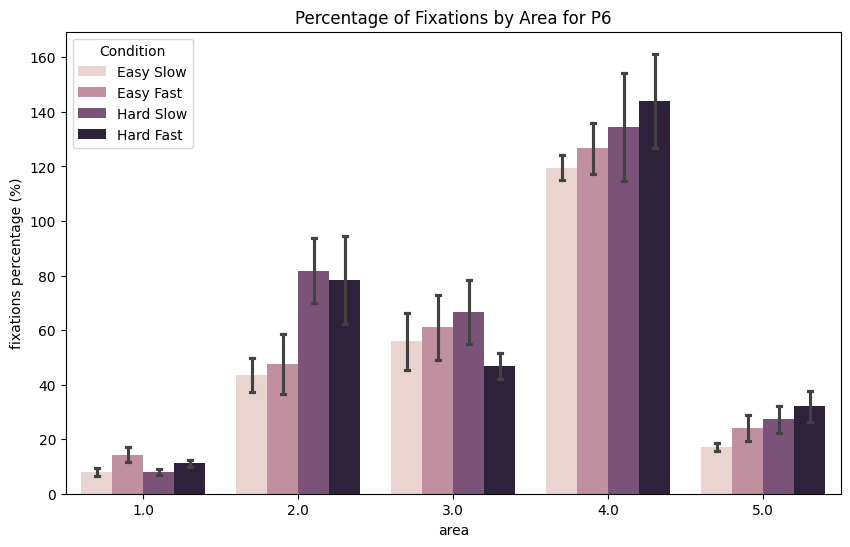

...

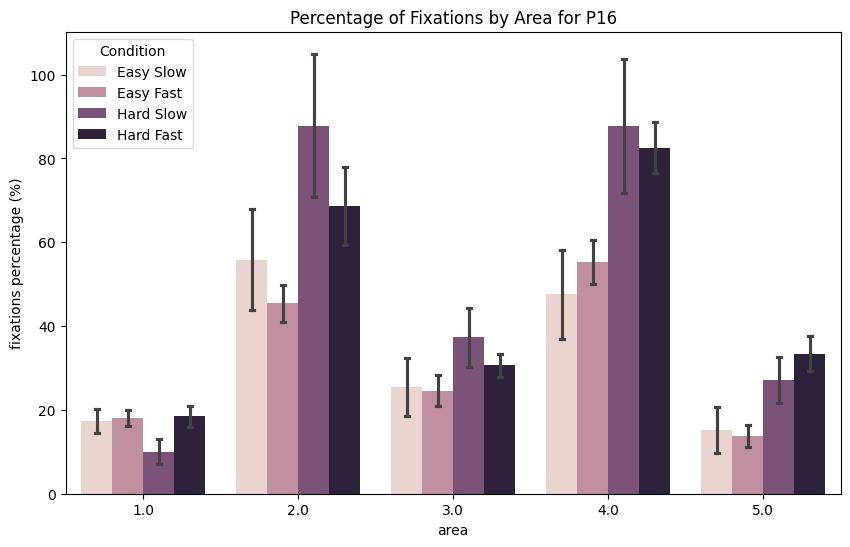

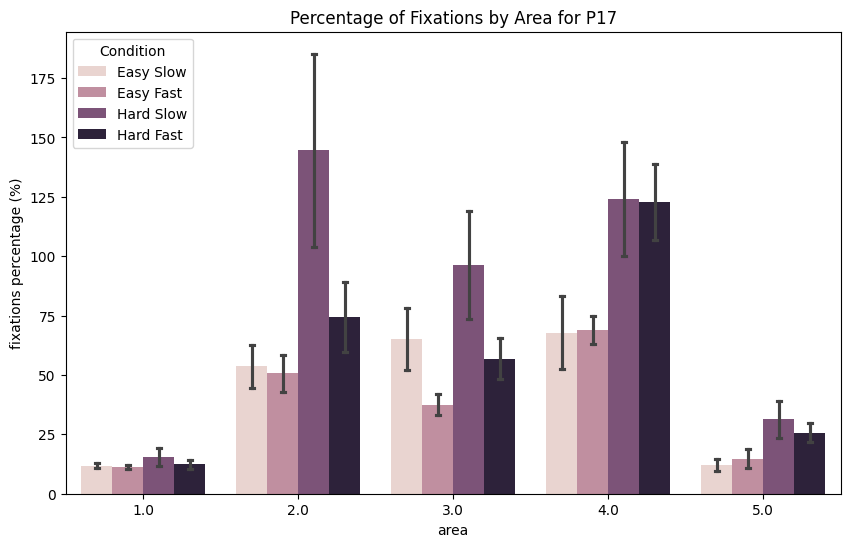

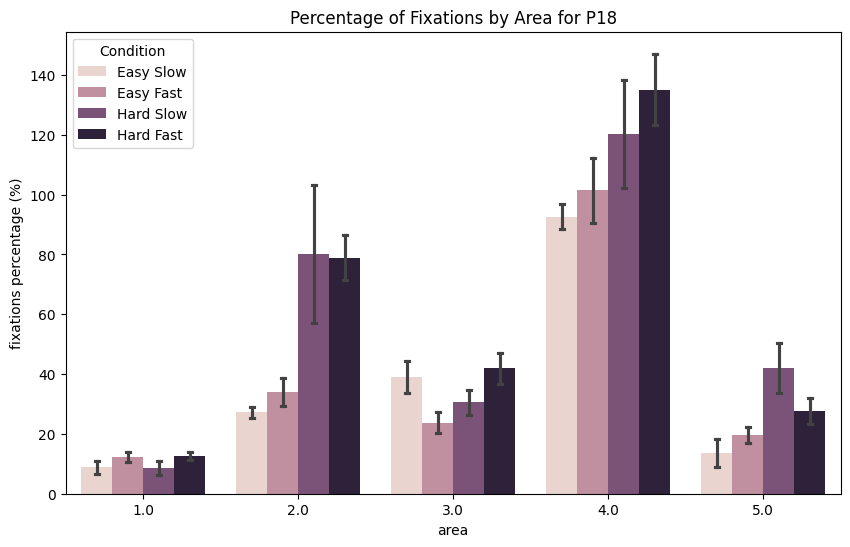

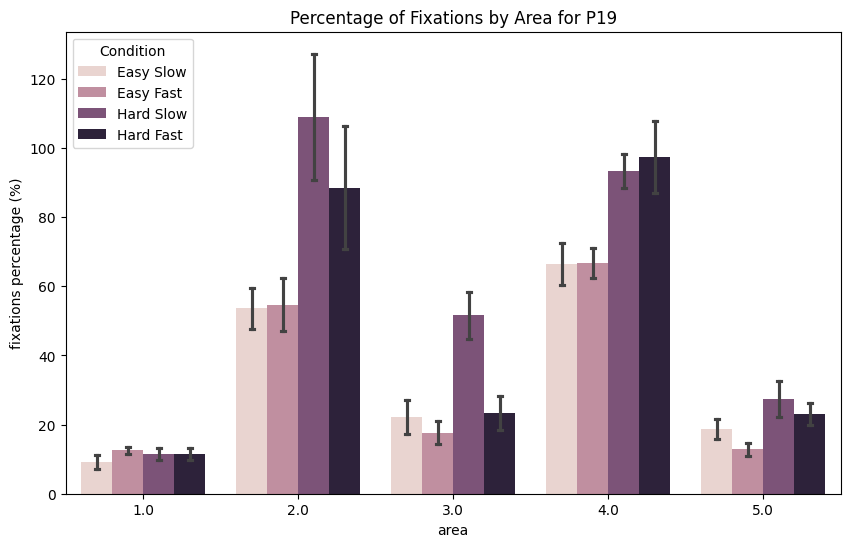

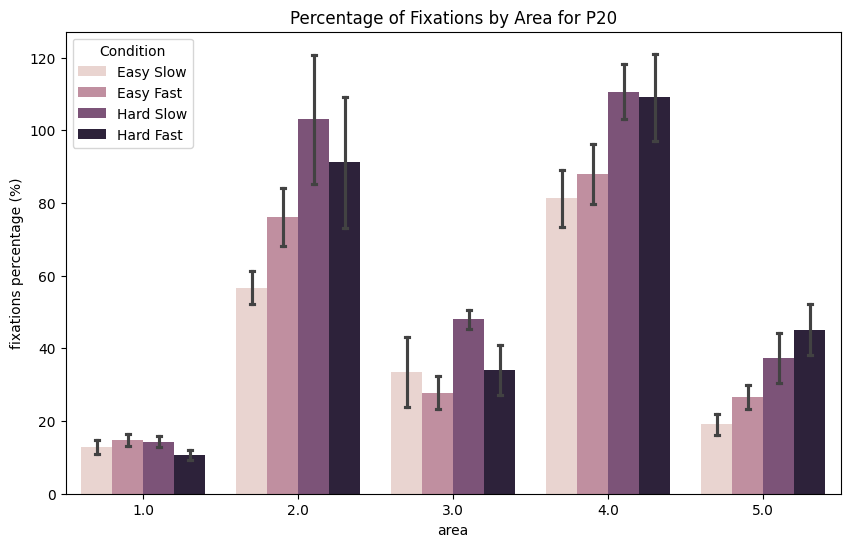

In [16]:
# Count percentage plot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")
    p_area_condition_counts = (
        p_df.groupby(['participant_id', 'area', 'condition', 'task_id'])
        .size()
        .reset_index(name='fix_count')
    )

    plt.figure(figsize=(10, 6))
    ax = sns.barplot(
        data=p_area_condition_counts,
        x='area',
        y='fix_count',
        hue='condition',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=.8,
    )

    plt.title(f'Percentage of Fixations by Area for P{pid}')
    plt.xlabel('area')
    plt.ylabel('fixations percentage (%)')

    handles, labels = ax.get_legend_handles_labels()
    plt.legend(handles, custom_labels, title='Condition', loc='upper left')
    plt.show()

### 5. Fixation Frequency
Area- & condition based, per participant

##### Area-based
- A1: less frequency

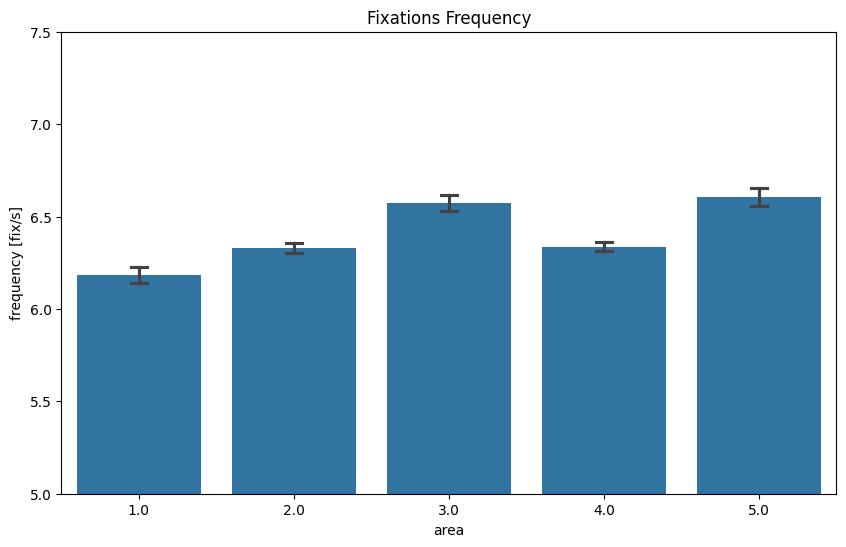

In [25]:
# bar plot
area_freq = df.groupby(['participant_id', 'task_id', 'area']).agg(
    fixations=('fixation_id', 'count'),
    total_duration=('duration', 'sum')
).reset_index()
area_freq['total_duration'] = area_freq['total_duration'] / 1000  # from ms to s
area_freq['fixation_frequency'] = area_freq['fixations'] / area_freq['total_duration']

plt.figure(figsize=(10, 6))
sns.barplot(
    data=area_freq,
    x='area',
    y='fixation_frequency',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=.8,
)
plt.xlabel('area')
plt.ylabel('frequency [fix/s]')
plt.title('Fixations Frequency')
plt.ylim(5, 7.5)
plt.show()

##### Area-based (per participant)
- (...)

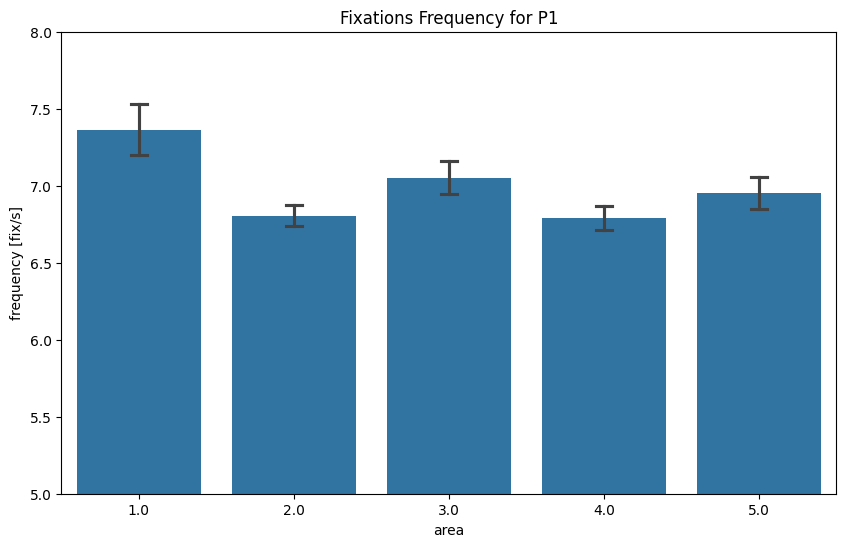

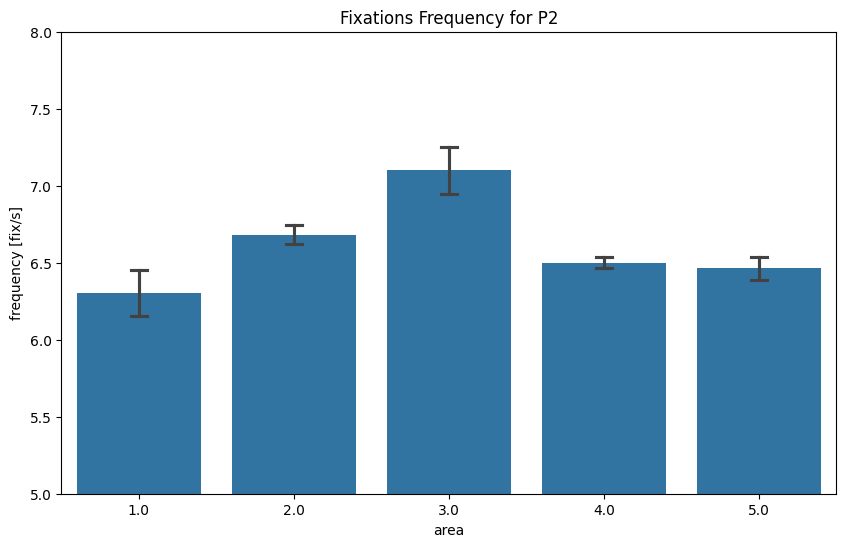

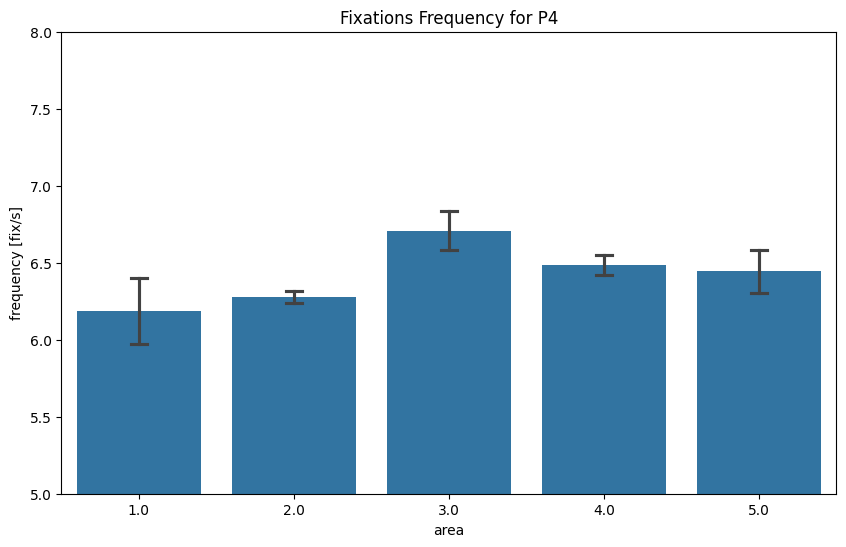

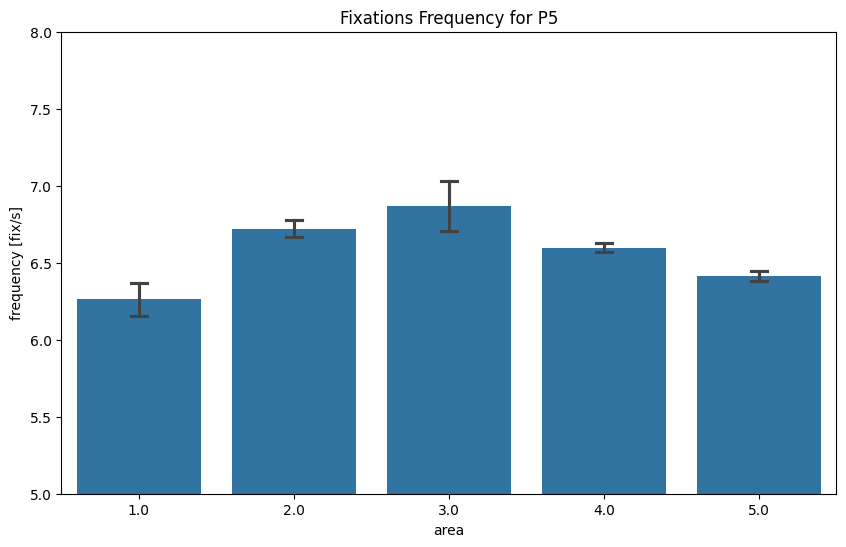

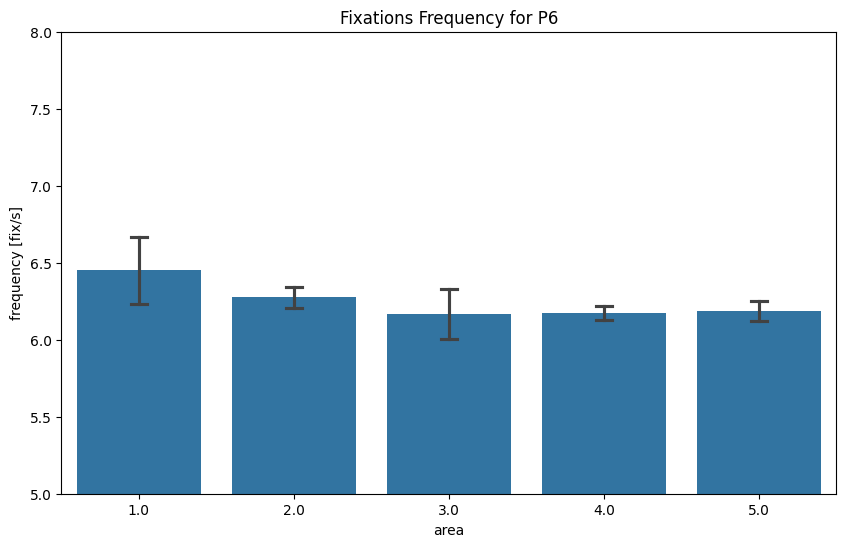

...

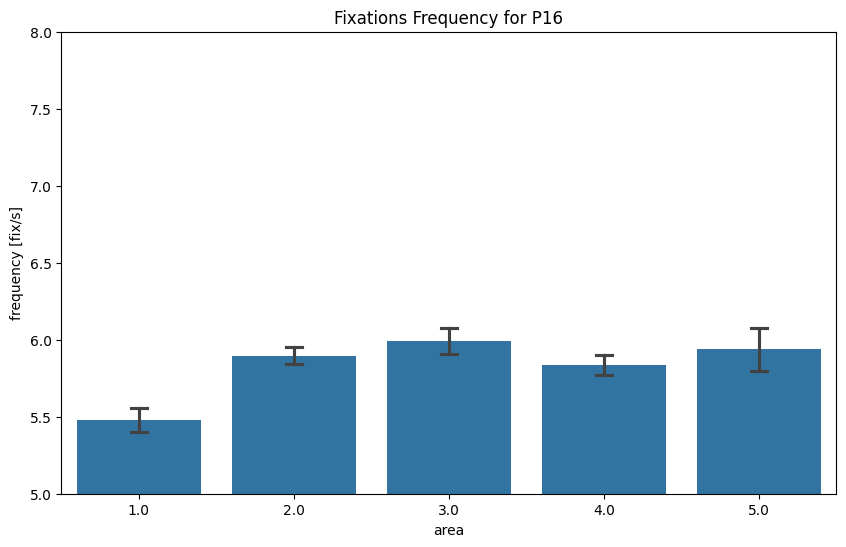

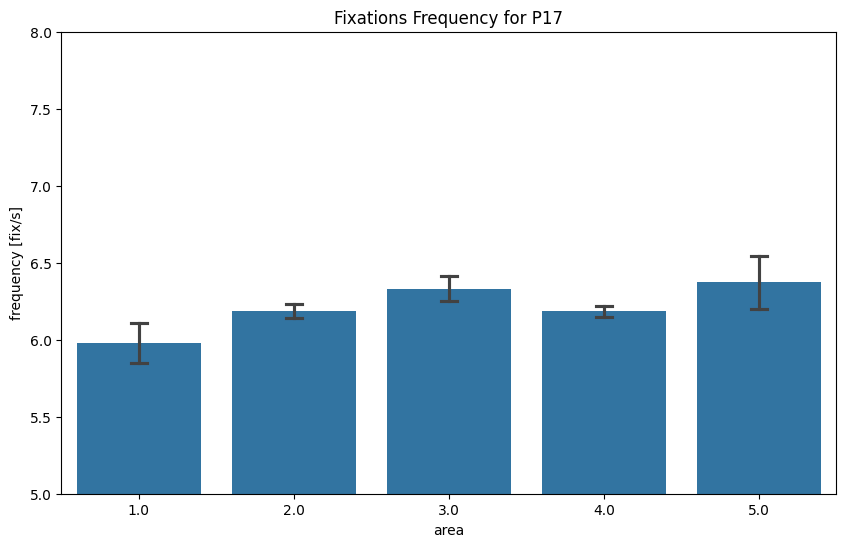

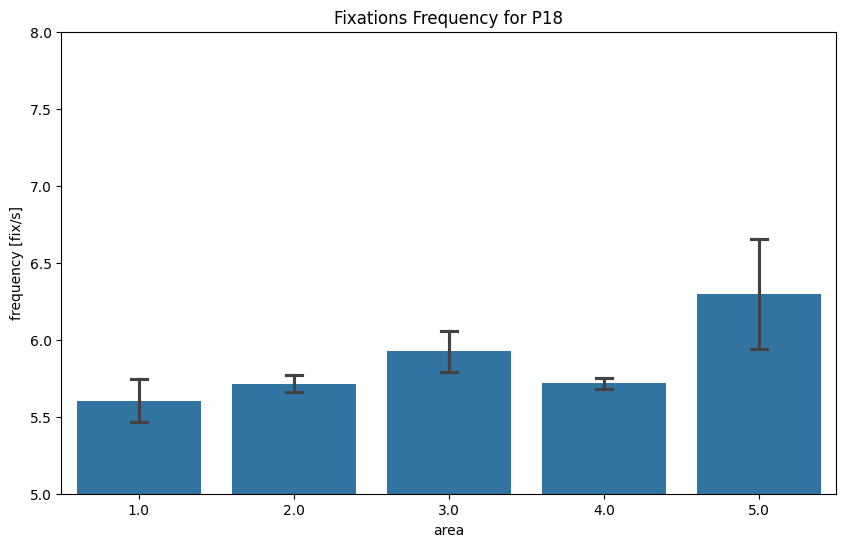

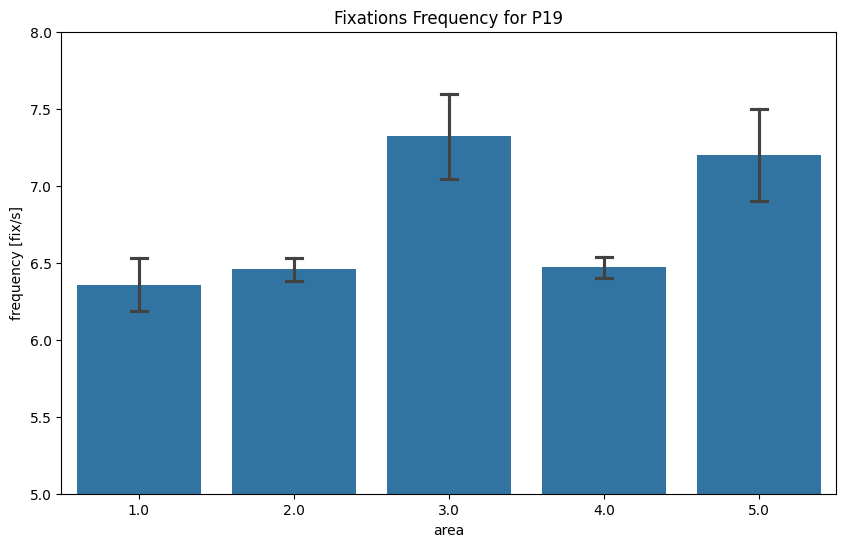

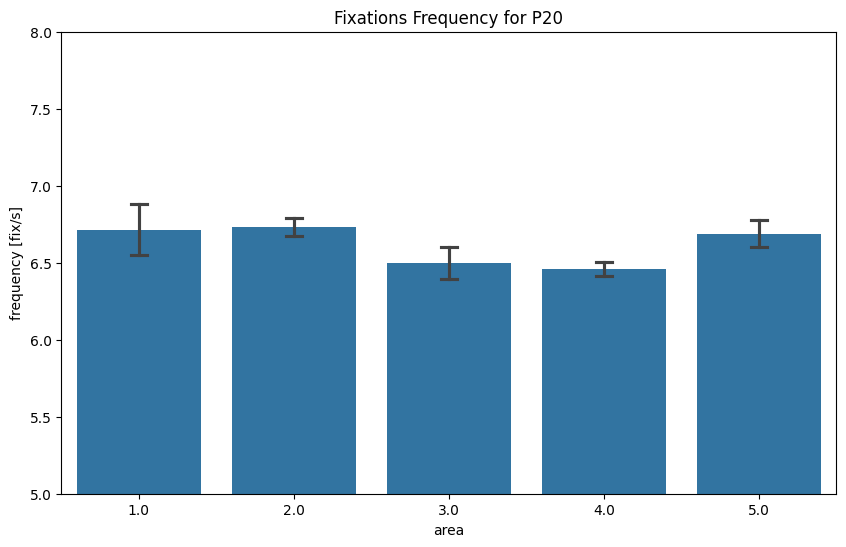

In [26]:
# bar plot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")
    
    p_area_freq = p_df.groupby(['participant_id', 'task_id', 'area']).agg(
        fixations=('fixation_id', 'count'),
        total_duration=('duration', 'sum')
    ).reset_index()
    p_area_freq['total_duration'] = p_area_freq['total_duration'] / 1000  # from ms to s
    p_area_freq['fixation_frequency'] = p_area_freq['fixations'] / p_area_freq['total_duration']

    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=p_area_freq,
        x='area',
        y='fixation_frequency',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=.8,
    )
    plt.title(f'Fixations Frequency for P{pid}')
    plt.xlabel('area')
    plt.ylabel('frequency [fix/s]')
    plt.ylim(5, 8)
    plt.show()

##### Area- & condition- based
- A2: higher frequency in hard-fast
- A5: higher frequency in easy

C:\Users\vale_ad\AppData\Local\Temp\ipykernel_6376\1851169169.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])


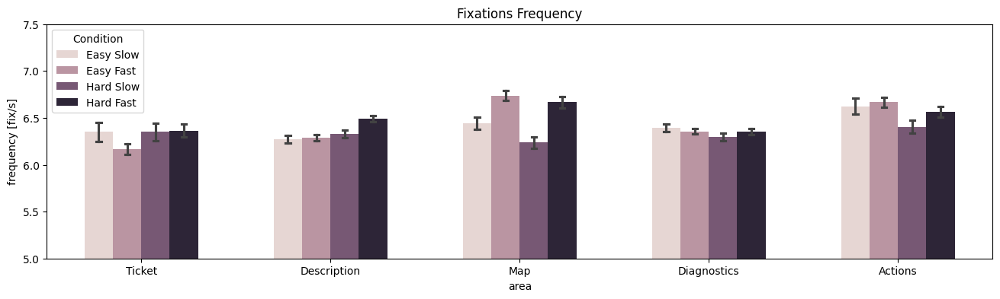

In [22]:
# bar plot
area_freq = df.groupby(['participant_id', 'task_id', 'area', 'condition']).agg(
    fixations=('fixation_id', 'count'),
    total_duration=('duration', 'sum')
).reset_index()
area_freq['total_duration'] = area_freq['total_duration'] / 1000  # from ms to s
area_freq['fixation_frequency'] = area_freq['fixations'] / area_freq['total_duration']

plt.figure(figsize=(16, 4))
ax = sns.barplot(
    data=area_freq,
    x='area',
    y='fixation_frequency',
    hue = 'condition',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=.6,
    palette=custom_palette
)
plt.xlabel('area')
plt.ylabel('frequency [fix/s]')
plt.title('Fixations Frequency')
plt.ylim(5, 7.5)

ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles, custom_labels, title='Condition', loc='upper left')
plt.show()

In [92]:
# Summary stats
mean = area_freq.query("area == 3")['fixation_frequency'].mean()
se = area_freq.query("area == 3")['fixation_frequency'].sem()
print(f"Map fix freq: {mean:.2f} (~{se:.2f})")

mean = area_freq.query("area == 5")['fixation_frequency'].mean()
se = area_freq.query("area == 5")['fixation_frequency'].sem()
print(f"Actions fix freq: {mean:.2f} (~{se:.2f})")

mean = area_freq.query("area == 3 and (condition == 1 or condition == 3)")['fixation_frequency'].mean()
se = area_freq.query("area == 3 and (condition == 1 or condition == 3)")['fixation_frequency'].sem()
print(f"Map slow fix freq: {mean:.2f} (~{se:.2f})")

mean = area_freq.query("area == 3 and (condition == 2 or condition == 4)")['fixation_frequency'].mean()
se = area_freq.query("area == 3 and (condition == 2 or condition == 4)")['fixation_frequency'].sem()
print(f"Map fast fix freq: {mean:.2f} (~{se:.2f})")

Map fix freq: 6.59 (~0.03)
Actions fix freq: 6.59 (~0.03)
Map slow fix freq: 6.35 (~0.05)
Map fast fix freq: 6.71 (~0.04)


##### Area- & condition- based (per participant)
- (...)

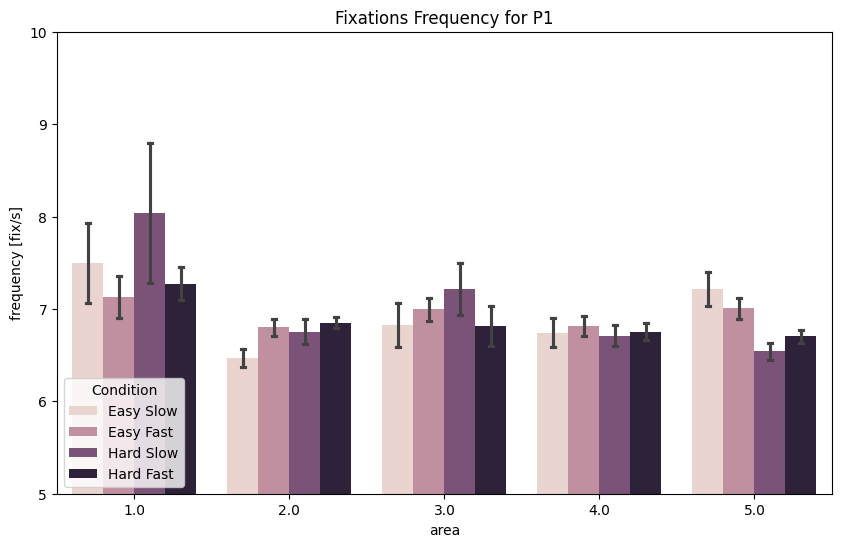

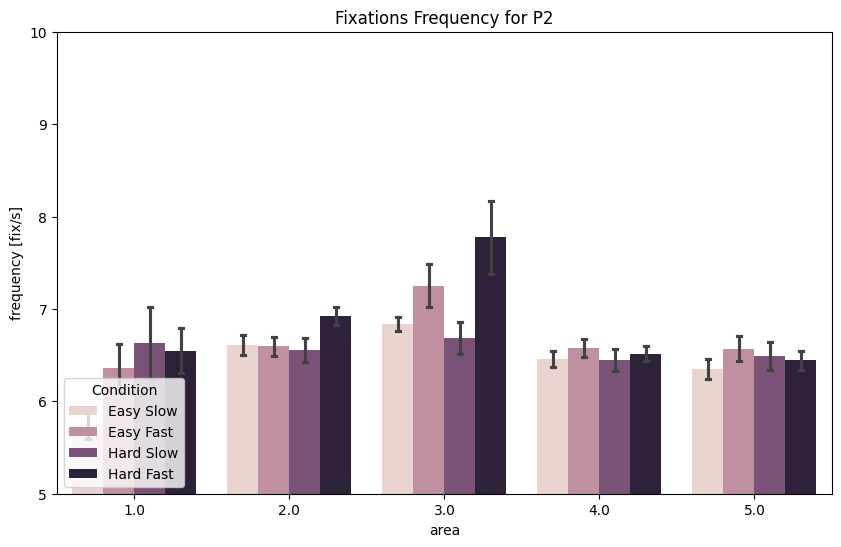

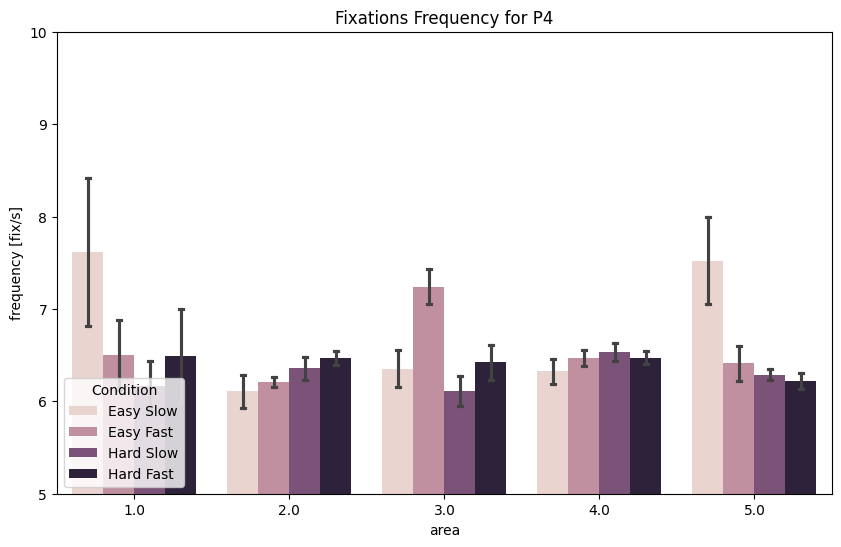

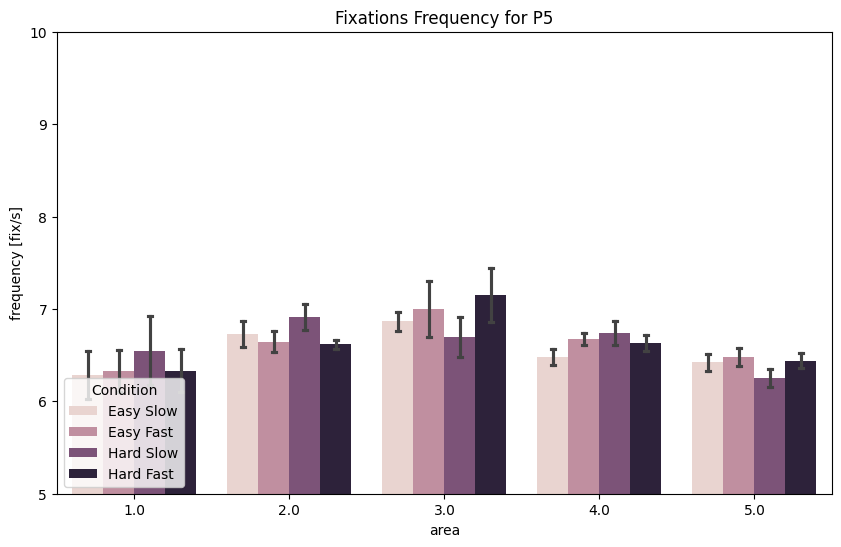

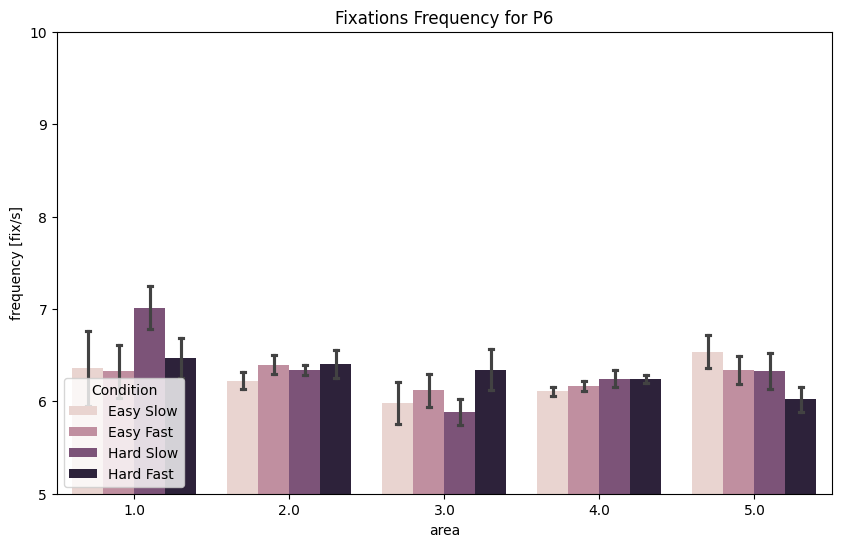

...

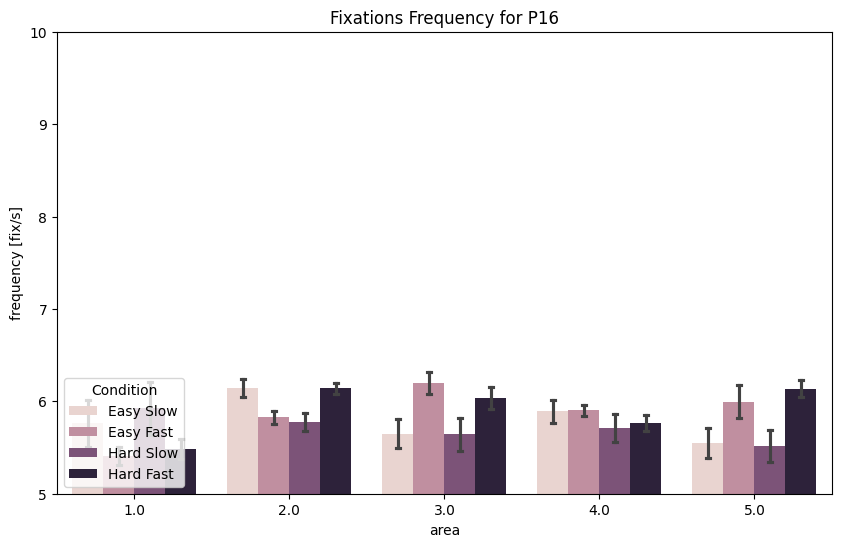

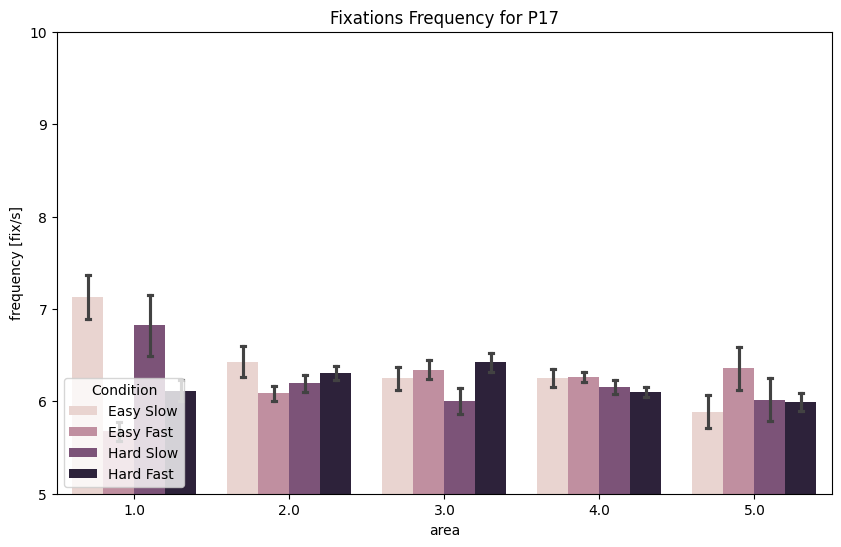

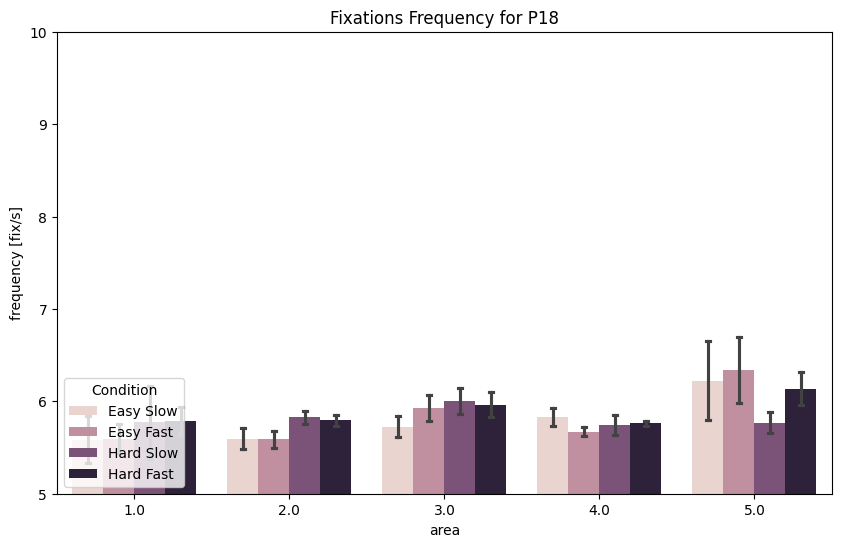

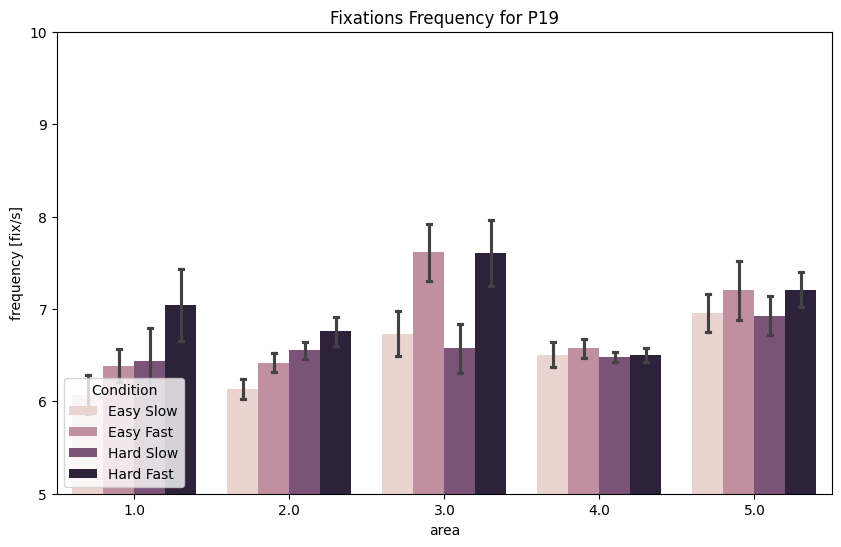

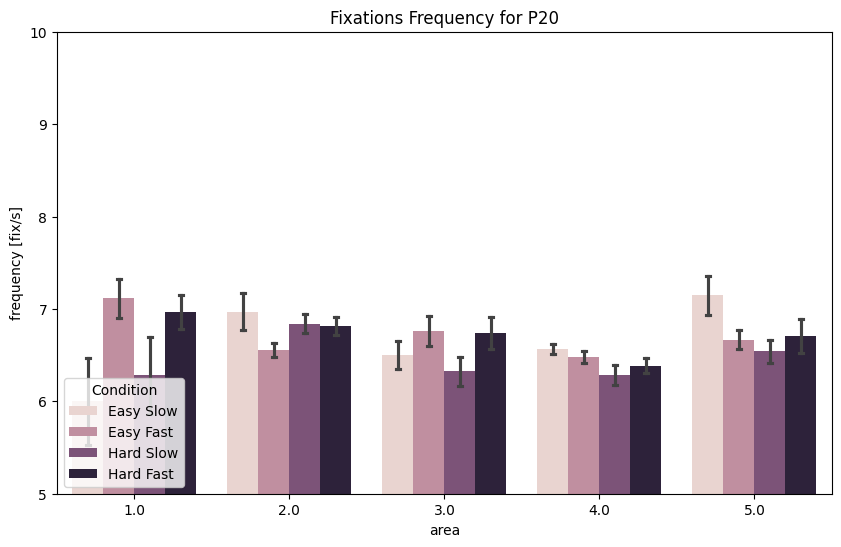

In [28]:
# bar plot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")
    
    p_area_freq = p_df.groupby(['participant_id', 'task_id', 'area', 'condition']).agg(
        fixations=('fixation_id', 'count'),
        total_duration=('duration', 'sum')
    ).reset_index()
    p_area_freq['total_duration'] = p_area_freq['total_duration'] / 1000  # from ms to s
    p_area_freq['fixation_frequency'] = p_area_freq['fixations'] / p_area_freq['total_duration']

    plt.figure(figsize=(10, 6))
    ax = sns.barplot(
        data=p_area_freq,
        x='area',
        y='fixation_frequency',
        hue = 'condition',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=.8,
    )
    plt.title(f'Fixations Frequency for P{pid}')
    plt.xlabel('area')
    plt.ylabel('frequency [fix/s]')
    plt.ylim(5, 10)

    handles, labels = ax.get_legend_handles_labels()
    plt.legend(handles, custom_labels, title='Condition', loc='lower left')
    plt.show()

### 6. Time to First Fixation
Area- & condition based, per participant

##### Area-based
- Faster in A1 and A2
- Slower in A4 and A5

Check must be done based on block type/id, not on the condition, otherwise it takes half of the data.

group by chunks with same condition?

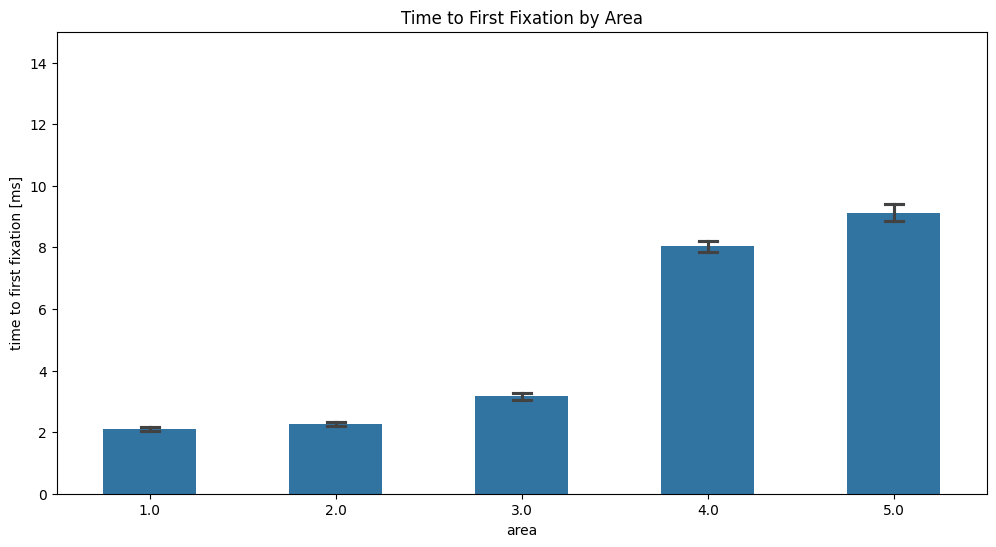

In [29]:
# barplot
merged_df = pd.merge(df, gui_df[['participant_id', 'condition', 'block_id', 'task_id', 'start_timestamp']], 
                     on=['participant_id', 'condition', 'block_id', 'task_id'], 
                     suffixes=('_fixation', '_task'))
merged_df = merged_df.sort_values(by=['participant_id', 'condition', 'block_id', 'task_id', 'area', 'start_timestamp_fixation'])

first_fixations = merged_df.drop_duplicates(subset=['participant_id', 'condition', 'block_id', 'task_id', 'area'], keep='first')
first_fixations = first_fixations.copy()
first_fixations['time_to_first_fixation'] = (first_fixations['start_timestamp_fixation'] - first_fixations['start_timestamp_task'])

plt.figure(figsize=(12, 6))
sns.barplot(
    data=first_fixations,
    x='area',
    y='time_to_first_fixation',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=0.5,
)
plt.title('Time to First Fixation by Area')
plt.xlabel('area')
plt.ylabel('time to first fixation [ms]')
plt.ylim(0, 15)
plt.show()

##### Area-based (per participant)
- consistent through participants

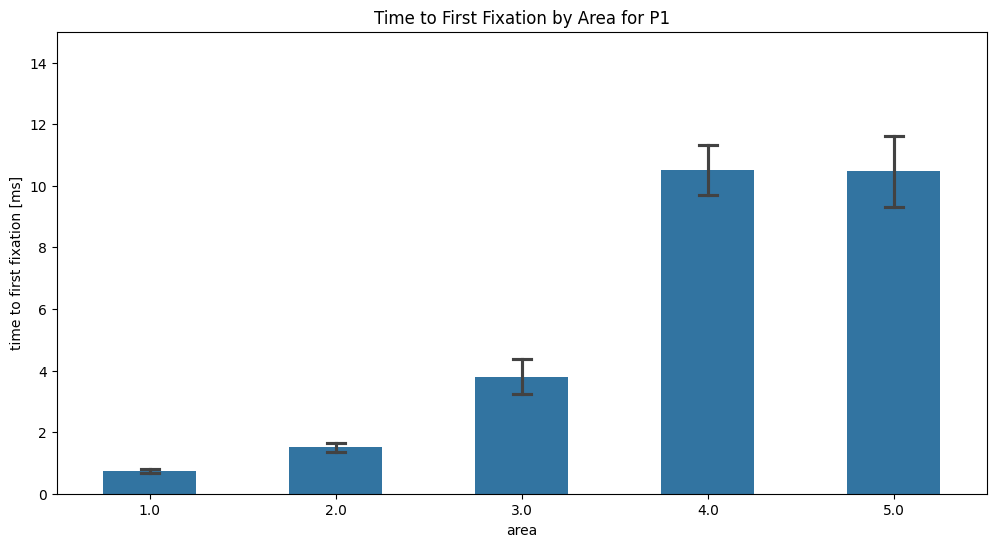

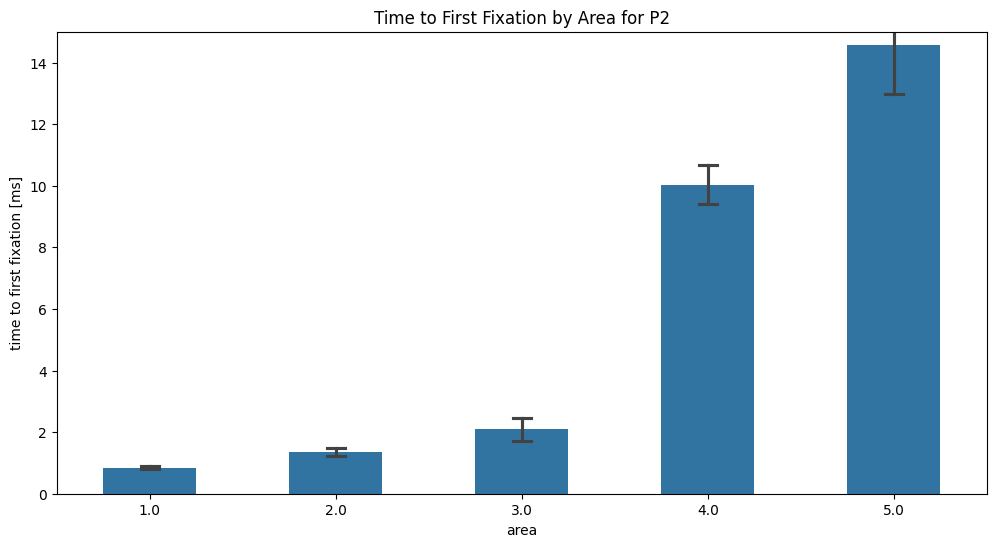

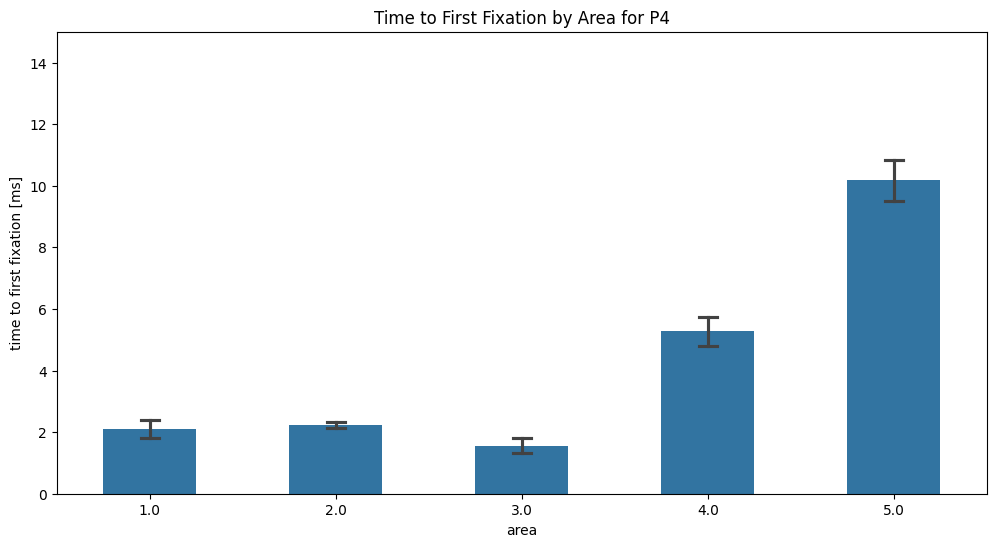

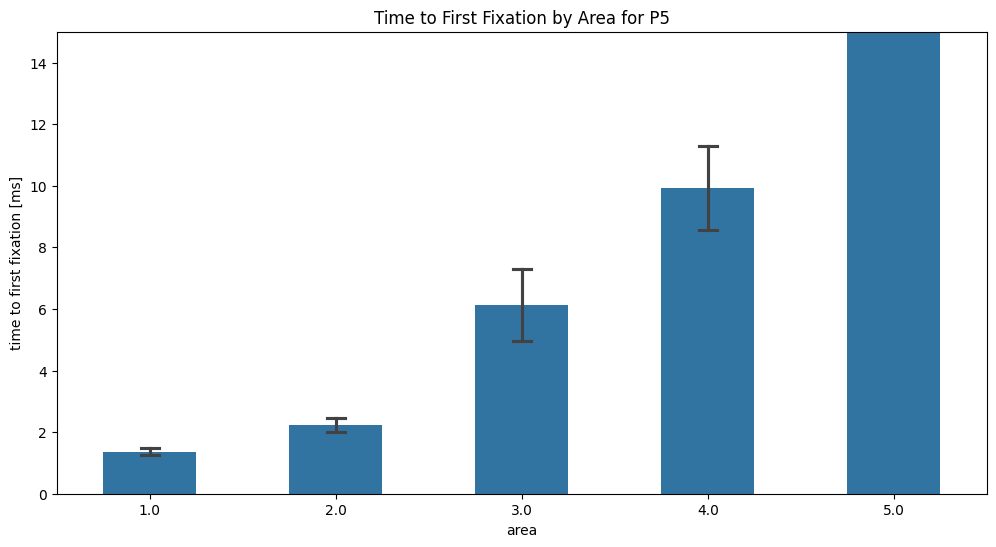

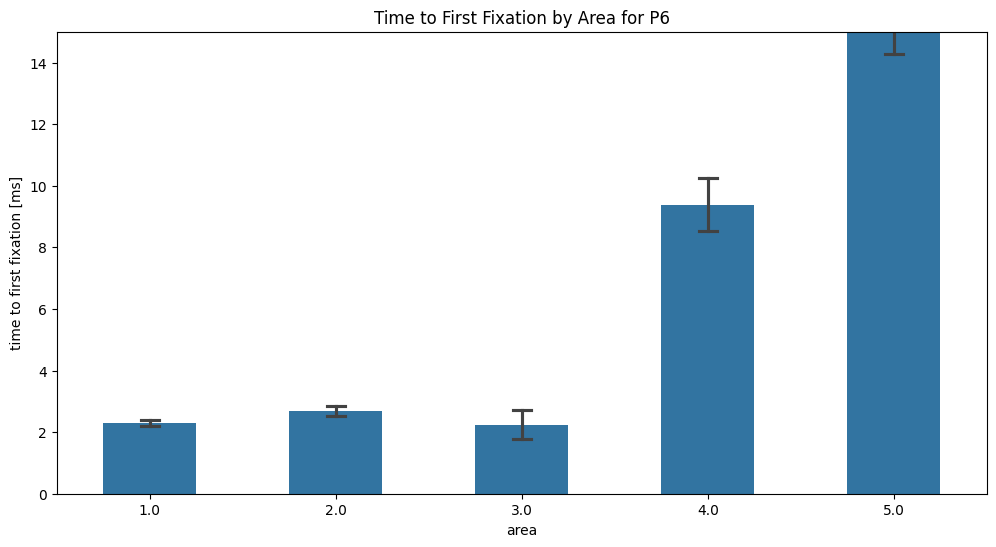

...

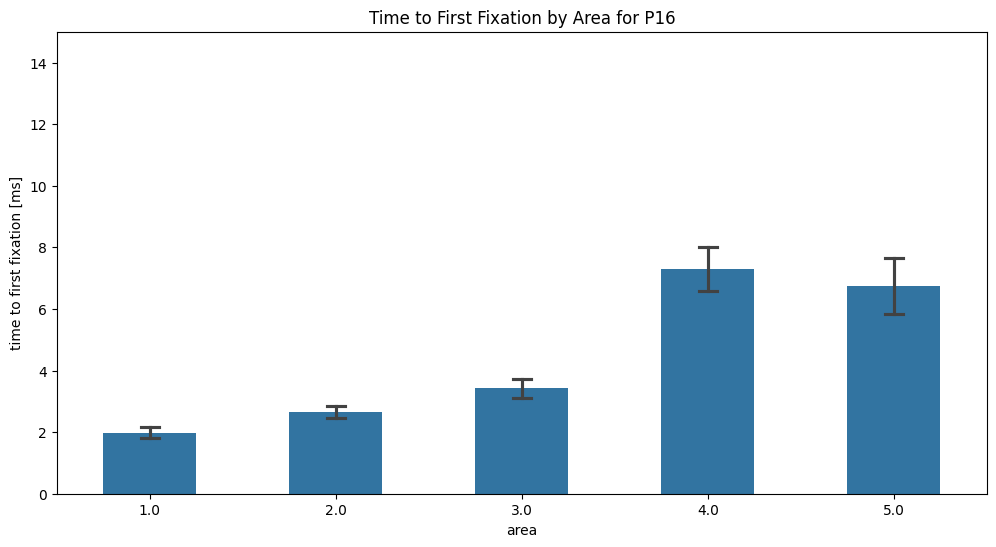

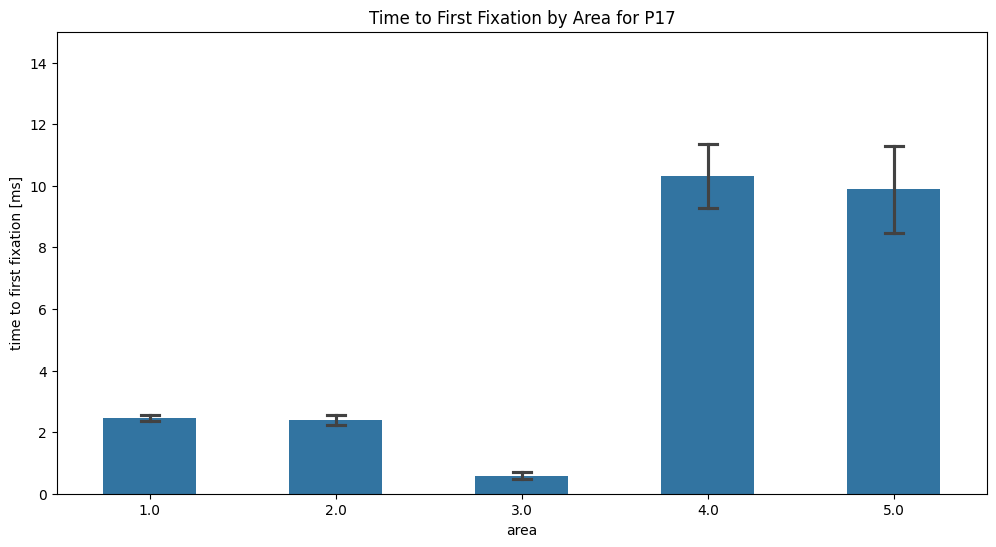

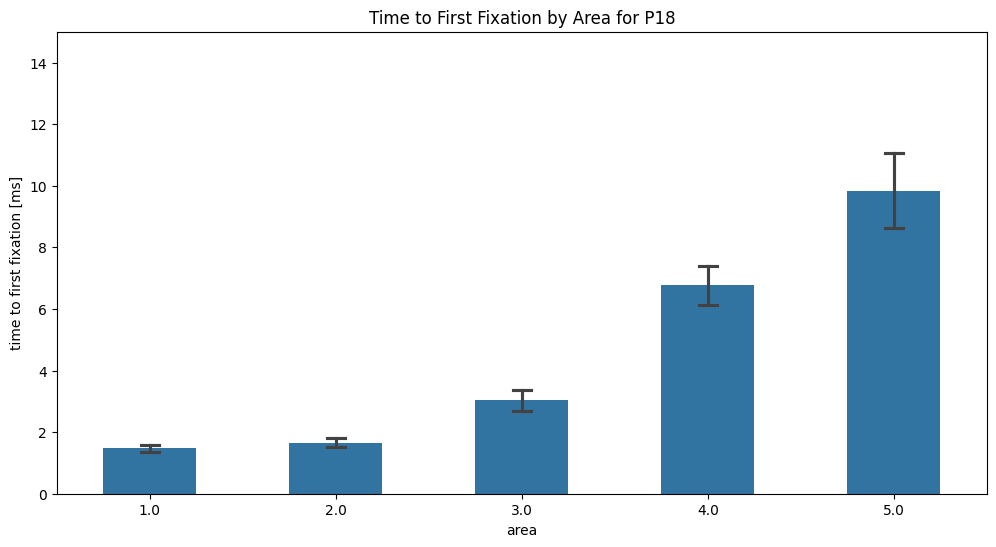

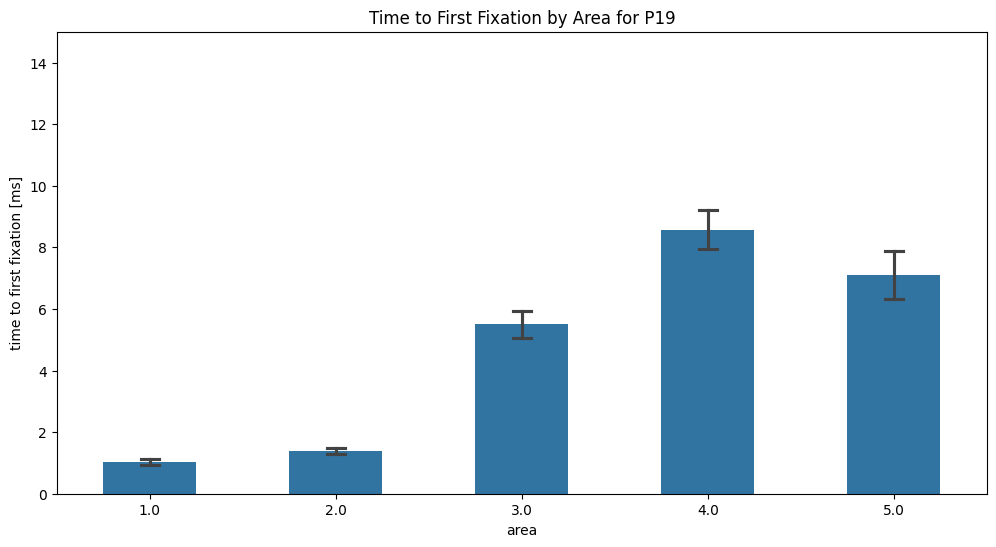

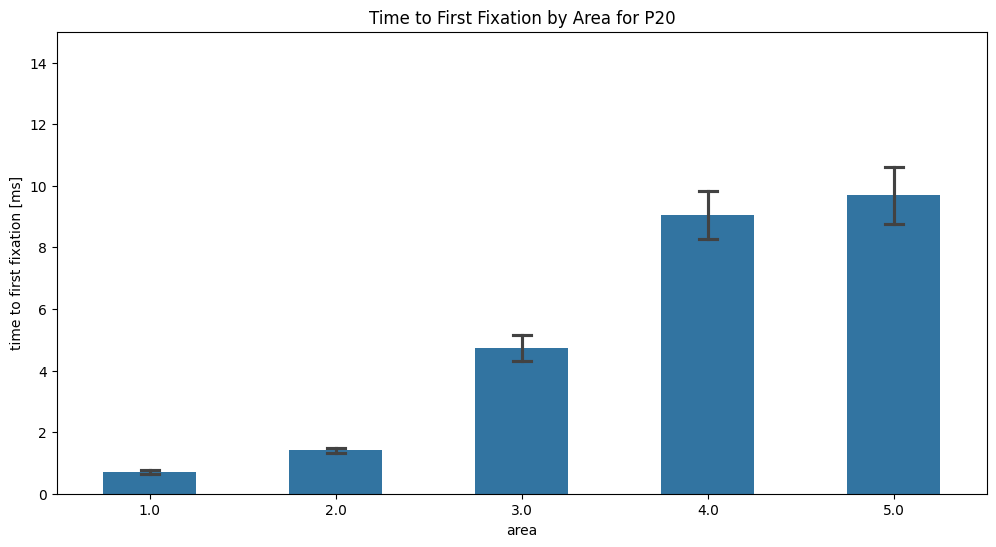

In [30]:
# barplot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")
    p_gui_df = gui_df.query(f"participant_id == {pid}")

    p_merged_df = pd.merge(p_df, p_gui_df[['participant_id', 'condition', 'block_id', 'task_id', 'start_timestamp']], 
                        on=['participant_id', 'condition', 'block_id', 'task_id'], 
                        suffixes=('_fixation', '_task'))
    p_merged_df = p_merged_df.sort_values(by=['participant_id', 'condition', 'block_id', 'task_id', 'area', 'start_timestamp_fixation'])

    p_first_fixations = p_merged_df.drop_duplicates(subset=['participant_id', 'condition', 'block_id', 'task_id', 'area'], keep='first')
    p_first_fixations = p_first_fixations.copy()
    p_first_fixations['time_to_first_fixation'] = (p_first_fixations['start_timestamp_fixation'] - p_first_fixations['start_timestamp_task'])

    plt.figure(figsize=(12, 6))
    sns.barplot(
        data=p_first_fixations,
        x='area',
        y='time_to_first_fixation',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=0.5,
    )
    plt.title(f'Time to First Fixation by Area for P{pid}')
    plt.xlabel('area')
    plt.ylabel('time to first fixation [ms]')
    plt.ylim(0, 15)
    plt.show()

##### Area- & condition- based
- A1: no diff
- A2: slightly longer in slow
- A3: slightly longer in hard
- A4: longer in slow
- A5: longer in slow

C:\Users\vale_ad\AppData\Local\Temp\ipykernel_6376\1817878321.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])


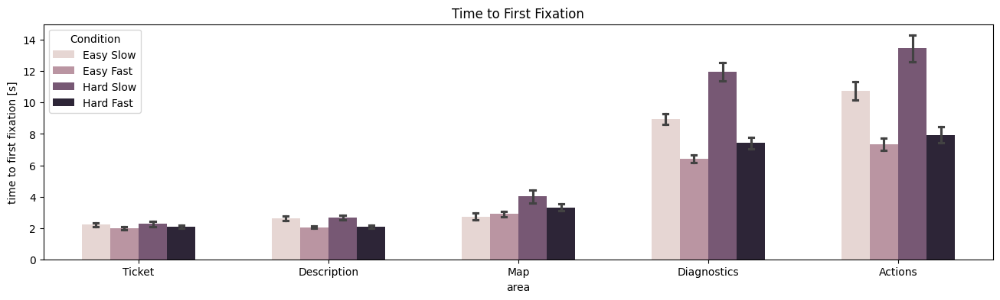

In [19]:
# barplot
merged_df = pd.merge(df, gui_df[['participant_id', 'condition', 'block_id', 'task_id', 'start_timestamp']], 
                     on=['participant_id', 'condition', 'block_id', 'task_id'], 
                     suffixes=('_fixation', '_task'))
merged_df = merged_df.sort_values(by=['participant_id', 'condition', 'block_id', 'task_id', 'area', 'start_timestamp_fixation'])

first_fixations = merged_df.drop_duplicates(subset=['participant_id', 'condition', 'block_id', 'task_id', 'area'], keep='first')
first_fixations = first_fixations.copy()
first_fixations['time_to_first_fixation'] = (first_fixations['start_timestamp_fixation'] - first_fixations['start_timestamp_task'])

plt.figure(figsize=(16, 4))
ax = sns.barplot(
    data=first_fixations,
    x='area',
    y='time_to_first_fixation',
    hue='condition',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=0.6,
    palette=custom_palette
)
plt.title('Time to First Fixation')
plt.xlabel('area')
plt.ylabel('time to first fixation [s]')
plt.ylim(0, 15)

ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles, custom_labels, title='Condition', loc='upper left')
plt.show()

In [46]:
# Summary stats
mean = first_fixations.query("area == 4 and (condition == 1 or condition == 3)")['time_to_first_fixation'].mean()
se = first_fixations.query("area == 4 and (condition == 1 or condition == 3)")['time_to_first_fixation'].sem()
print(f"Diagnostics slow ttff: {mean:.2f} (~{se:.2f})")

mean = first_fixations.query("area == 4 and (condition == 2 or condition == 4)")['time_to_first_fixation'].mean()
se = first_fixations.query("area == 4 and (condition == 2 or condition == 4)")['time_to_first_fixation'].sem()
print(f"Diagnostics fast ttff: {mean:.2f} (~{se:.2f})")

mean = first_fixations.query("area == 5 and (condition == 1 or condition == 3)")['time_to_first_fixation'].mean()
se = first_fixations.query("area == 5 and (condition == 1 or condition == 3)")['time_to_first_fixation'].sem()
print(f"Actions slow ttff: {mean:.2f} (~{se:.2f})")

mean = first_fixations.query("area == 5 and (condition == 2 or condition == 4)")['time_to_first_fixation'].mean()
se = first_fixations.query("area == 5 and (condition == 2 or condition == 4)")['time_to_first_fixation'].sem()
print(f"Actions fast ttff: {mean:.2f} (~{se:.2f})")

Diagnostics slow ttff: 10.33 (~0.34)
Diagnostics fast ttff: 6.83 (~0.21)
Actions slow ttff: 12.02 (~0.51)
Actions fast ttff: 7.59 (~0.31)


##### Area- & condition- based (per participant)
- (...)

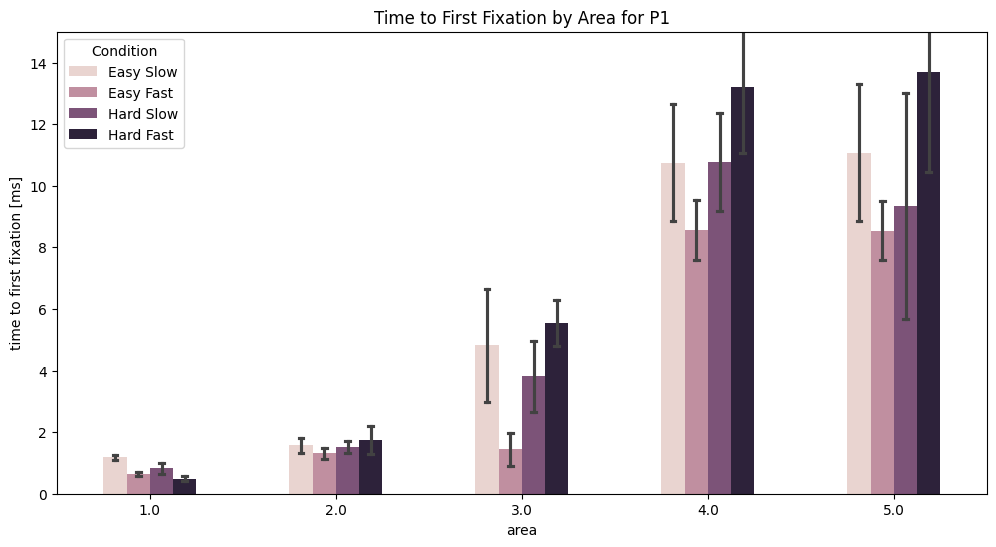

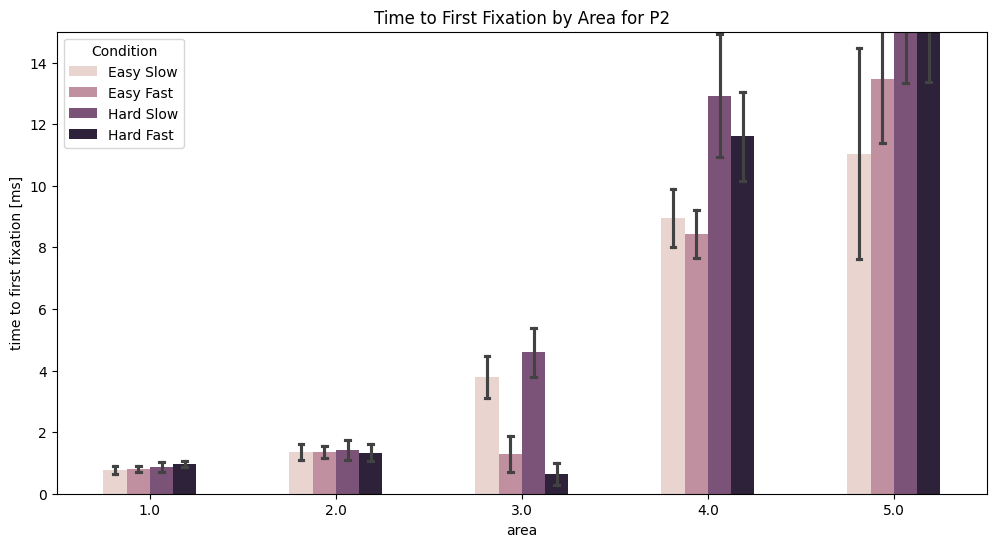

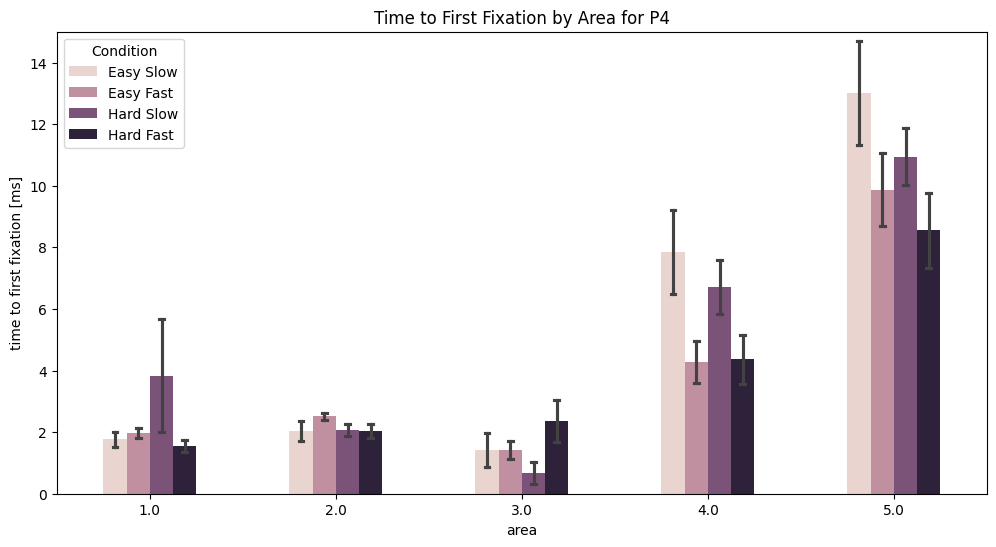

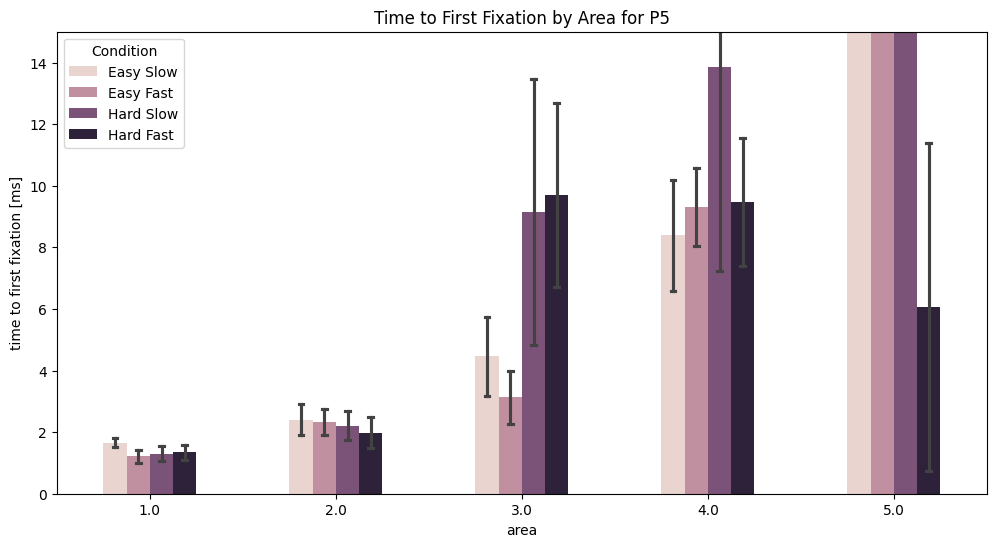

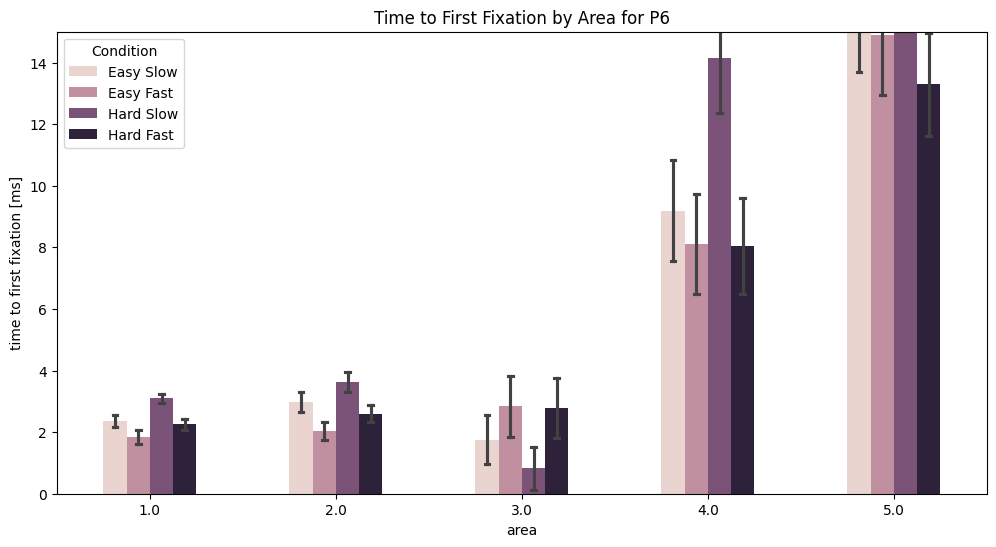

...

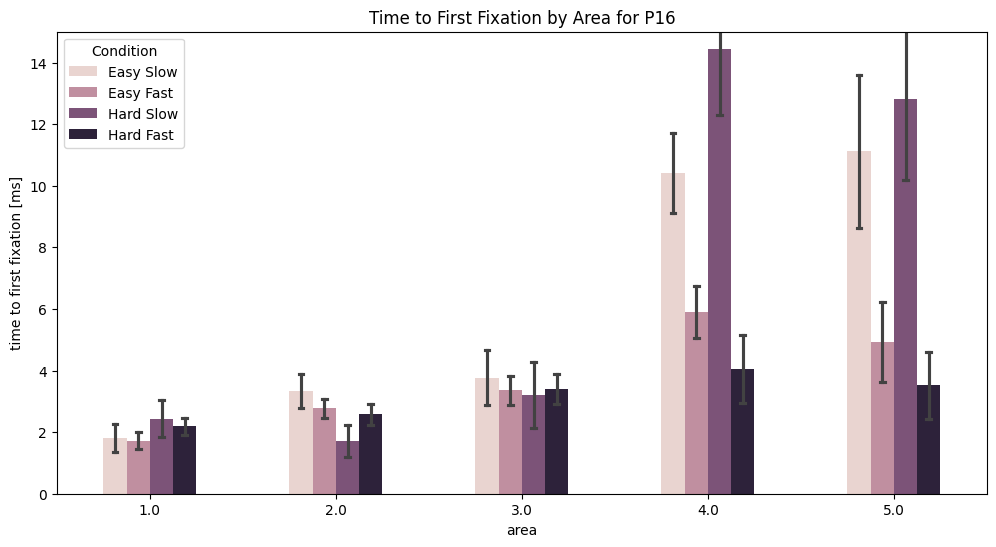

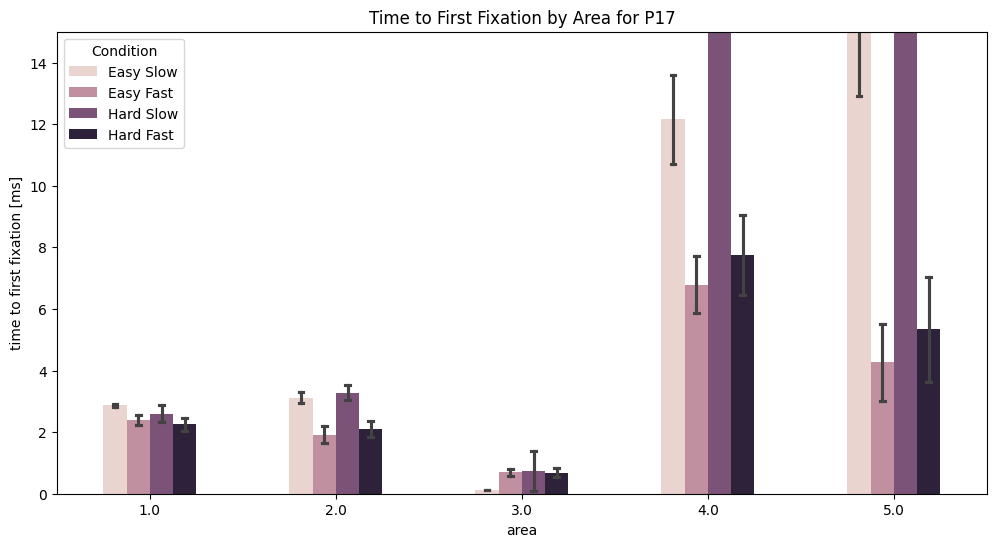

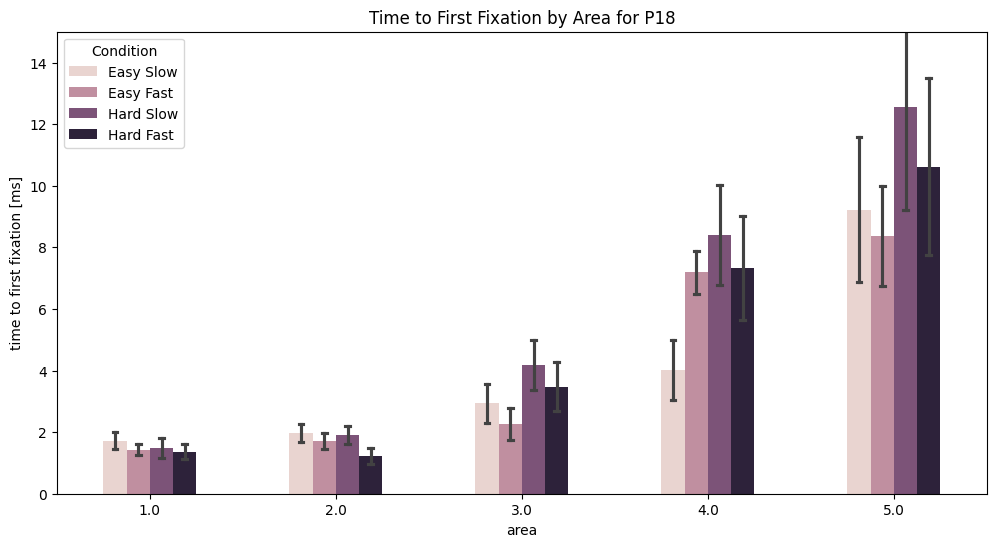

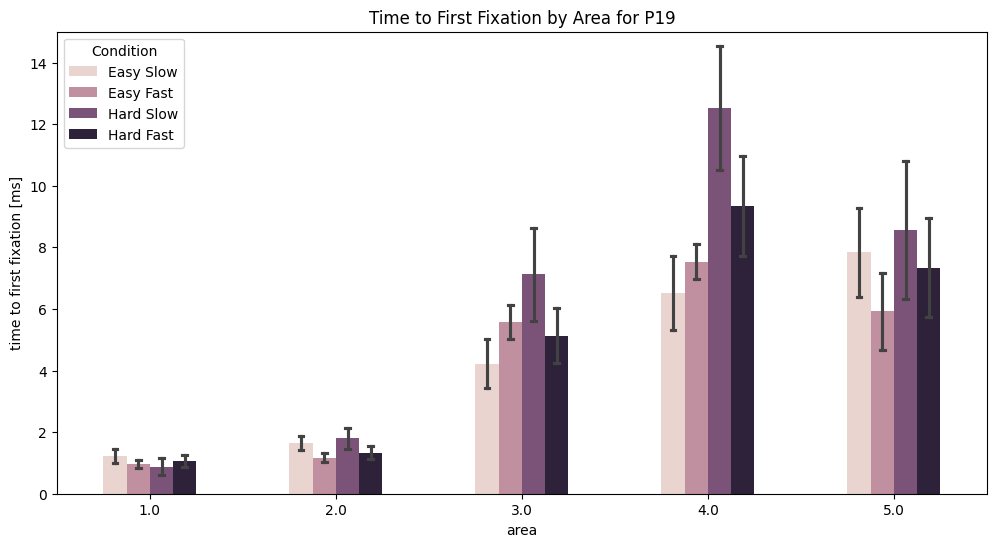

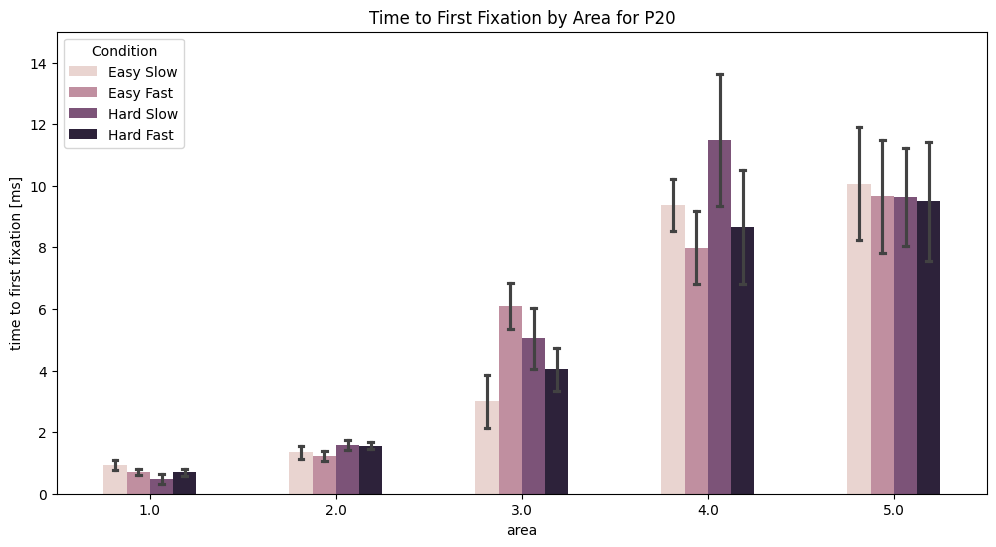

In [32]:
# barplot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")
    p_gui_df = gui_df.query(f"participant_id == {pid}")

    p_merged_df = pd.merge(p_df, p_gui_df[['participant_id', 'condition', 'block_id', 'task_id', 'start_timestamp']], 
                        on=['participant_id', 'condition', 'block_id', 'task_id'], 
                        suffixes=('_fixation', '_task'))
    p_merged_df = p_merged_df.sort_values(by=['participant_id', 'condition', 'block_id', 'task_id', 'area', 'start_timestamp_fixation'])

    p_first_fixations = p_merged_df.drop_duplicates(subset=['participant_id', 'condition', 'block_id', 'task_id', 'area'], keep='first')
    p_first_fixations = p_first_fixations.copy()
    p_first_fixations['time_to_first_fixation'] = (p_first_fixations['start_timestamp_fixation'] - p_first_fixations['start_timestamp_task'])

    plt.figure(figsize=(12, 6))
    ax = sns.barplot(
        data=p_first_fixations,
        x='area',
        y='time_to_first_fixation',
        hue='condition',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=0.5,
    )
    plt.title(f'Time to First Fixation by Area for P{pid}')
    plt.xlabel('area')
    plt.ylabel('time to first fixation [ms]')
    plt.ylim(0, 15)

    handles, labels = ax.get_legend_handles_labels()
    plt.legend(handles, custom_labels, title='Condition', loc='upper left')
    plt.show()

### 7. Visit Count
Area- & condition based, per participant

##### Area-based
- A1: Less visits
- A2: More visits

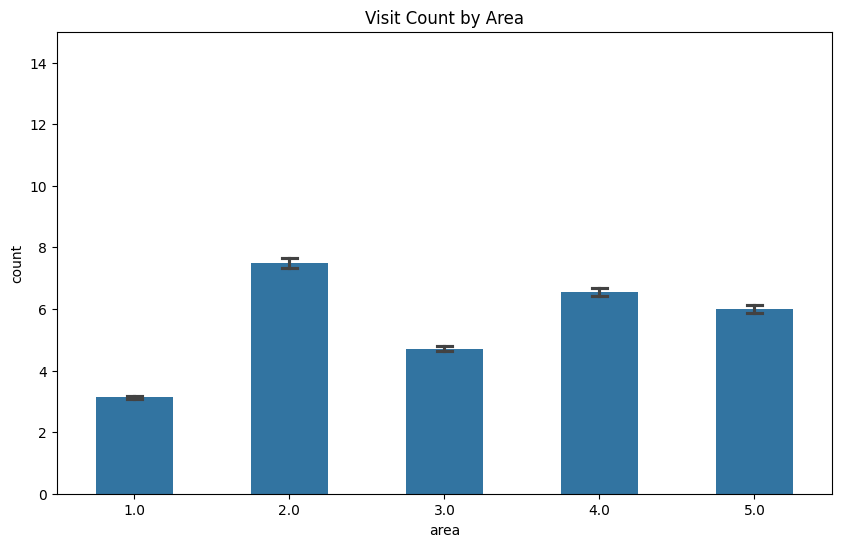

In [ ]:
# barplot
df['visit_id'] = (df['area'] != df['area'].shift(1)).cumsum()
visit_counts = df.groupby(['participant_id', 'condition', 'task_id', 'area', 'visit_id']).size().reset_index(name='fixation_count')
visit_summary = visit_counts.groupby(['participant_id', 'condition', 'task_id', 'area']).size().reset_index(name='visit_count')

plt.figure(figsize=(10, 6))
sns.barplot(
    data=visit_summary,
    x='area',
    y='visit_count',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=0.5,
)
plt.title('Visit Count by Area')
plt.xlabel('area')
plt.ylabel('count')
plt.ylim(0, 15)
plt.show()

##### Area-based (per participant)
- Consistent through participants

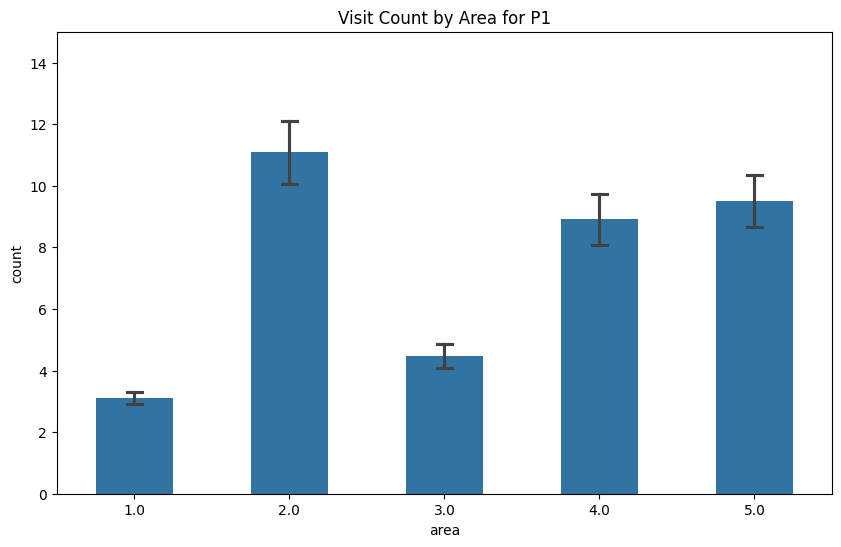

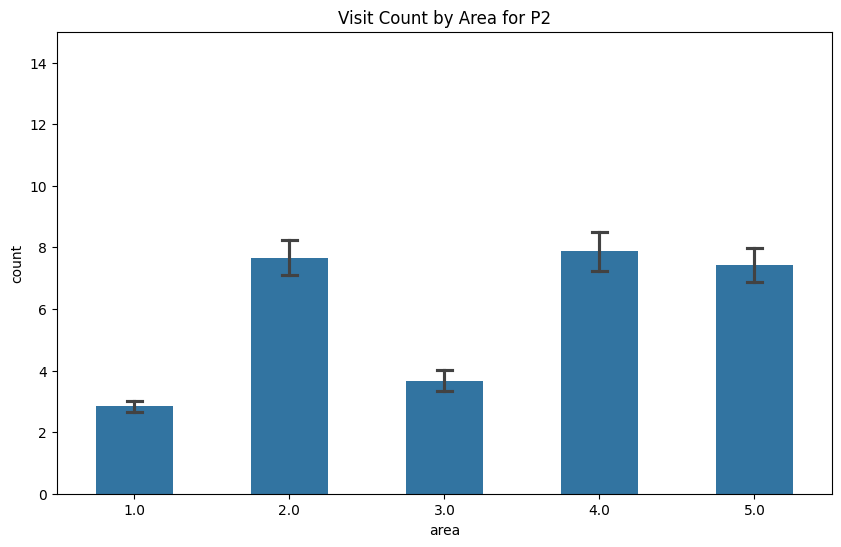

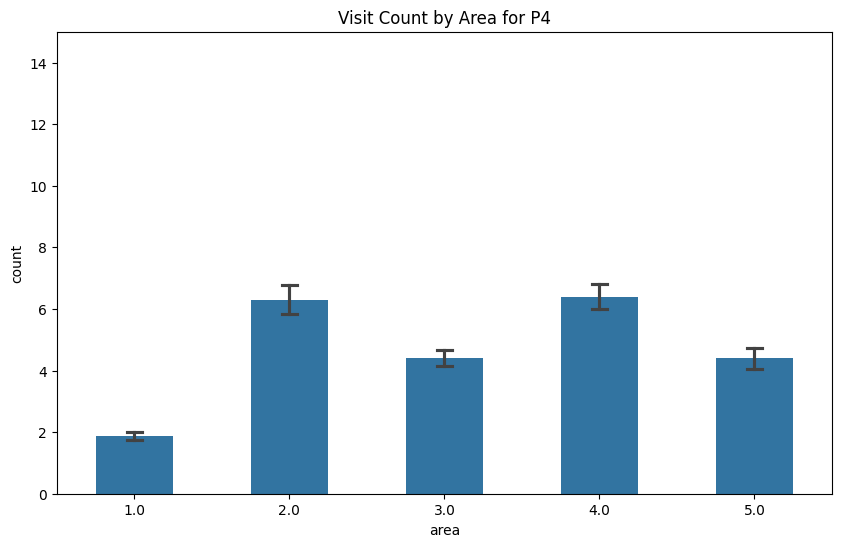

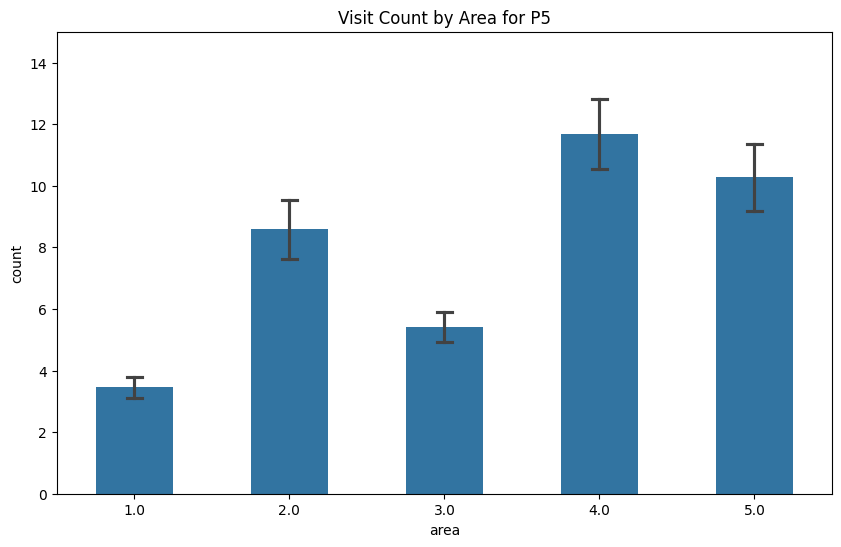

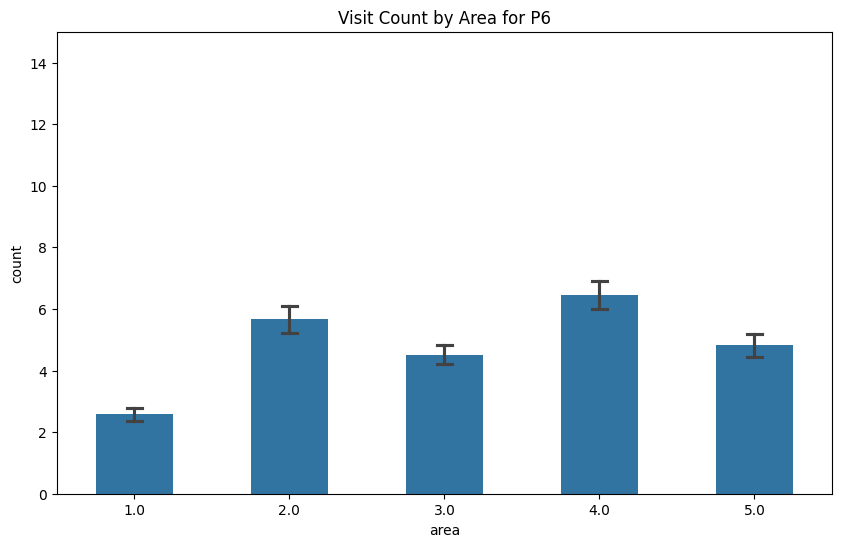

...

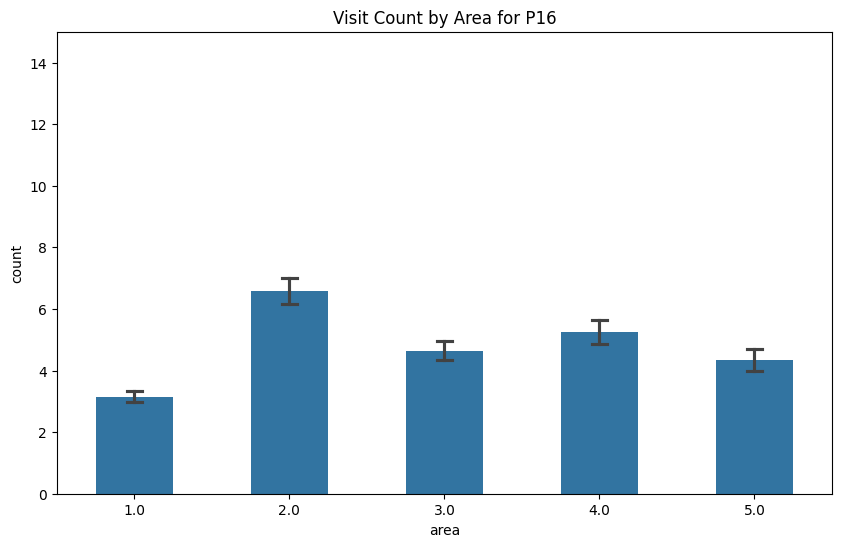

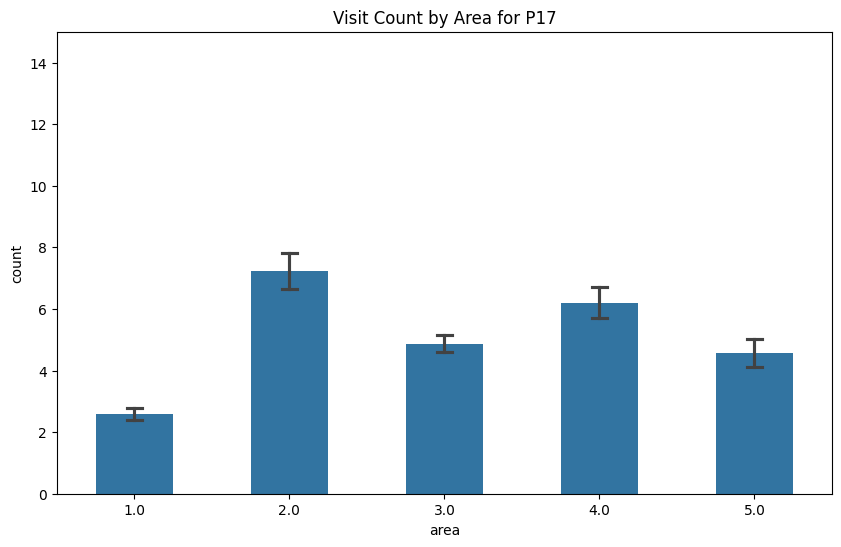

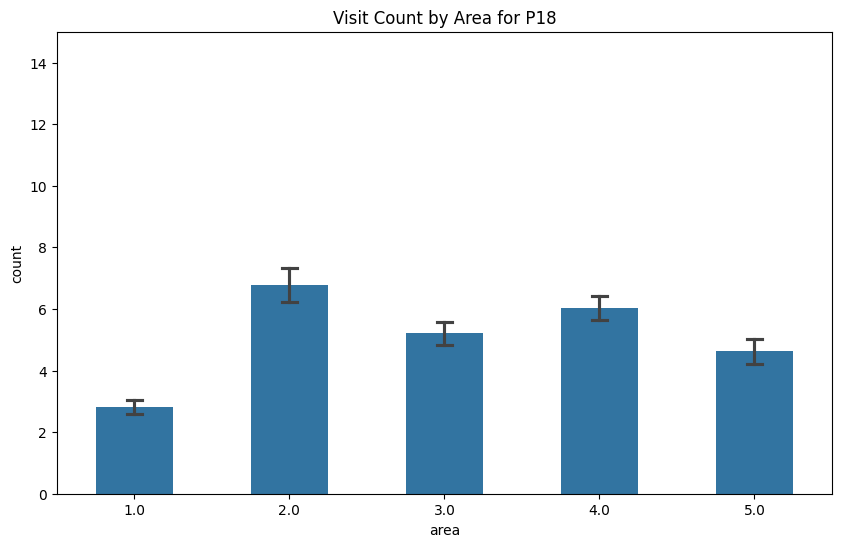

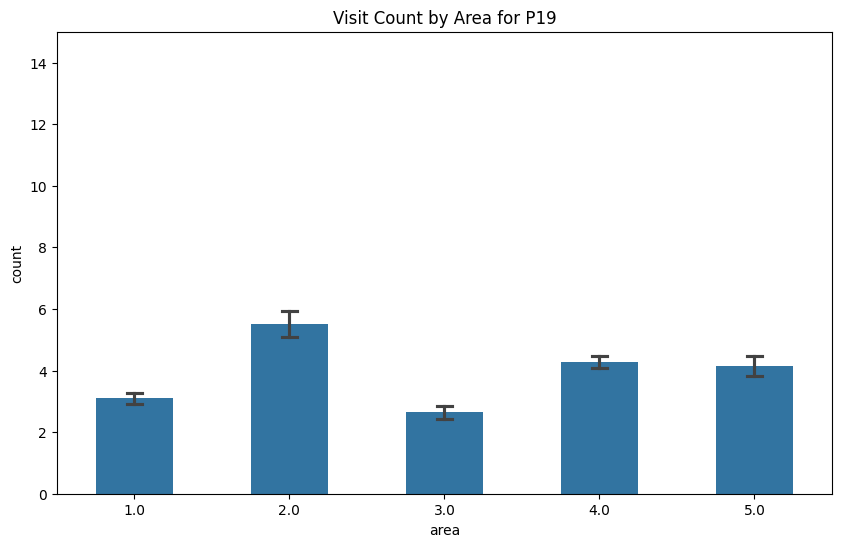

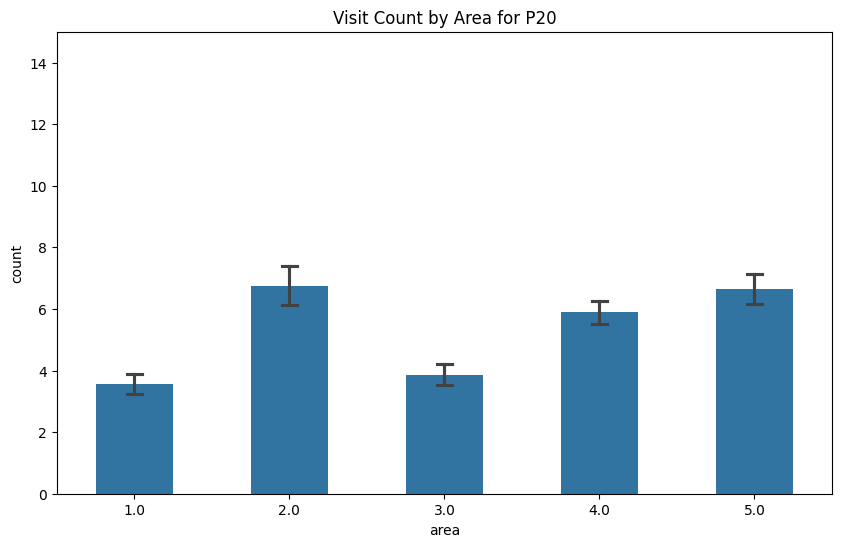

In [34]:
# barplot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")
    p_df = p_df.copy()
    p_df['visit_id'] = (p_df['area'] != p_df['area'].shift(1)).cumsum()
    p_visit_counts = p_df.groupby(['participant_id', 'condition', 'task_id', 'area', 'visit_id']).size().reset_index(name='fixation_count')
    p_visit_summary = p_visit_counts.groupby(['participant_id', 'condition', 'task_id', 'area']).size().reset_index(name='visit_count')

    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=p_visit_summary,
        x='area',
        y='visit_count',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=0.5,
    )
    plt.title(f'Visit Count by Area for P{pid}')
    plt.xlabel('area')
    plt.ylabel('count')
    plt.ylim(0, 15)
    plt.show()

##### Area- & condition- based
- A1: no diff
- A2: more visits in hard
- A3: slightly more visits in hard
- A4: more visits in hard
- A5: more visits in hard

C:\Users\vale_ad\AppData\Local\Temp\ipykernel_6376\841915919.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])


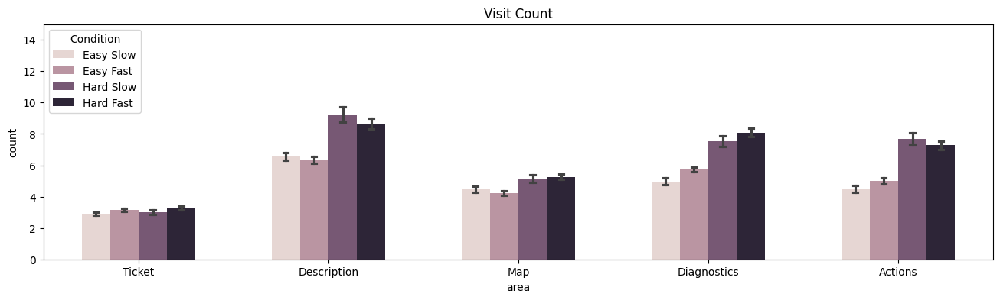

In [21]:
# barplot
df['visit_id'] = (df['area'] != df['area'].shift(1)).cumsum()
visit_counts = df.groupby(['participant_id', 'condition', 'task_id', 'area', 'visit_id']).size().reset_index(name='fixation_count')
visit_summary = visit_counts.groupby(['participant_id', 'condition', 'task_id', 'area']).size().reset_index(name='visit_count')

plt.figure(figsize=(16, 4))
ax = sns.barplot(
    data=visit_summary,
    x='area',
    y='visit_count',
    hue='condition',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=0.6,
    palette=custom_palette
)
plt.title('Visit Count')
plt.xlabel('area')
plt.ylabel('count')
plt.ylim(0, 15)

ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles, custom_labels, title='Condition', loc='upper left')
plt.show()

In [50]:
# Summary stats
mean = visit_summary.query("area == 2")['visit_count'].mean()
se = visit_summary.query("area == 2")['visit_count'].sem()
print(f"Description vis count: {mean:.2f} (~{se:.2f})")

mean = visit_summary.query("area == 4")['visit_count'].mean()
se = visit_summary.query("area == 4")['visit_count'].sem()
print(f"Diagnostics vis count: {mean:.2f} (~{se:.2f})")

mean = visit_summary.query("area == 5")['visit_count'].mean()
se = visit_summary.query("area == 5")['visit_count'].sem()
print(f"Actions vis count: {mean:.2f} (~{se:.2f})")

mean = visit_summary.query("condition == 1 or condition == 2")['visit_count'].mean()
se = visit_summary.query("condition == 1 or condition == 2")['visit_count'].sem()
print(f"Easy vis count: {mean:.2f} (~{se:.2f})")

mean = visit_summary.query("condition == 3 or condition == 4")['visit_count'].mean()
se = visit_summary.query("condition == 3 or condition == 4")['visit_count'].sem()
print(f"Hard vis count: {mean:.2f} (~{se:.2f})")

Description vis count: 7.49 (~0.16)
Diagnostics vis count: 6.55 (~0.13)
Actions vis count: 5.99 (~0.13)
Easy vis count: 4.83 (~0.06)
Hard vis count: 6.53 (~0.10)


##### Area- & condition- based (per participant)
- More or less consistent through the participants

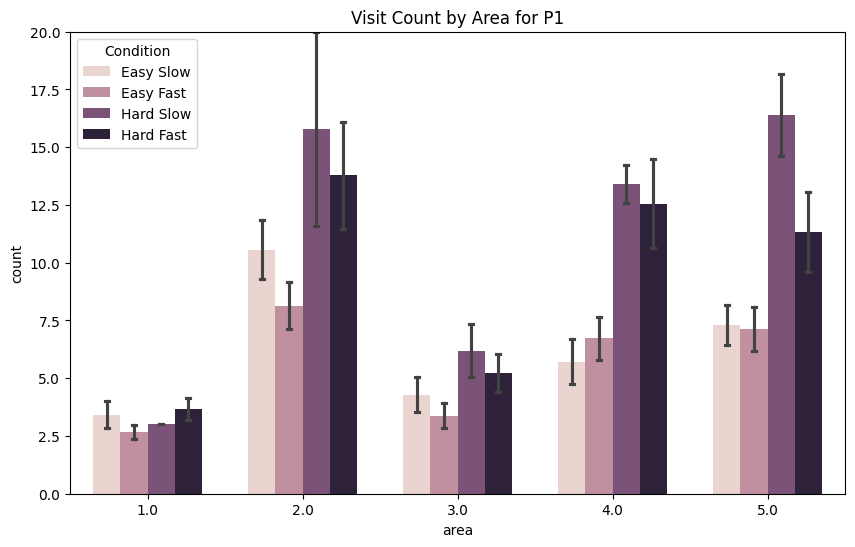

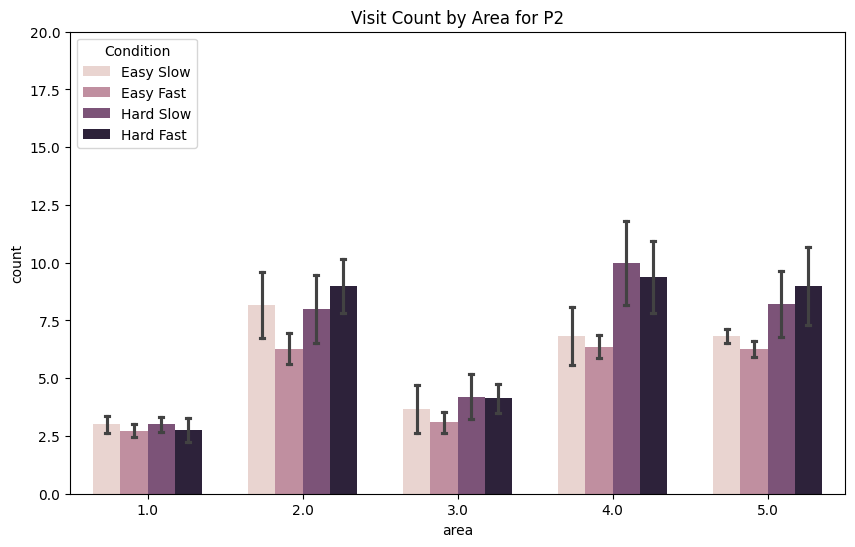

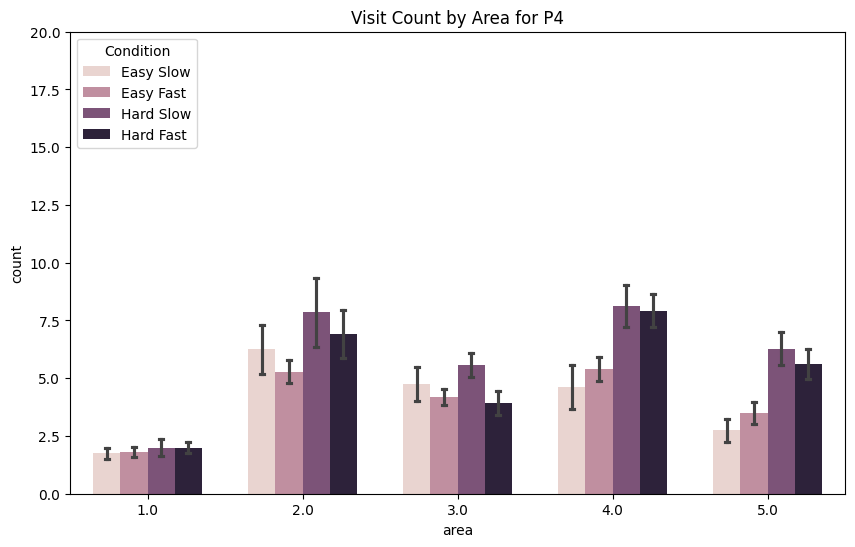

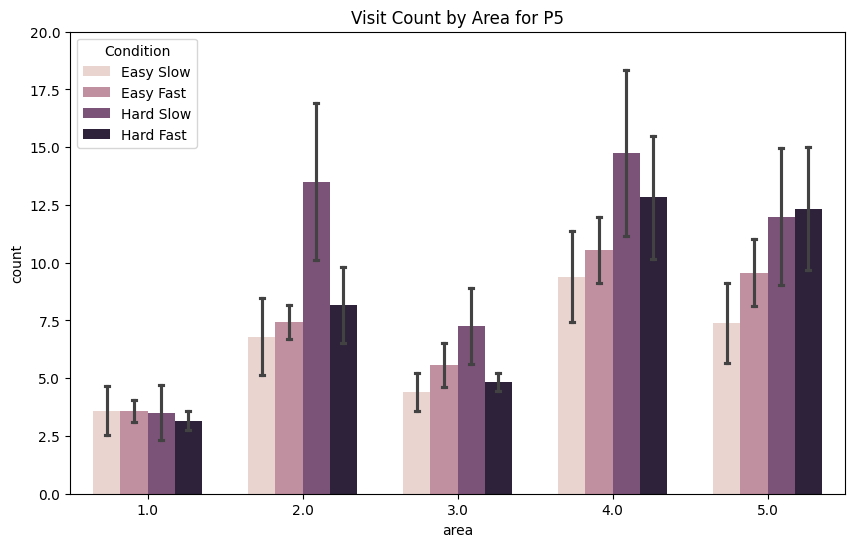

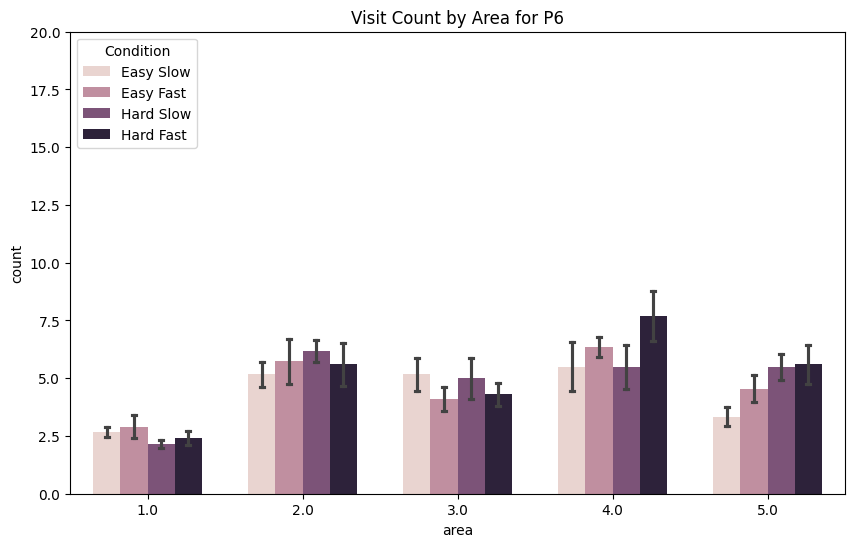

...

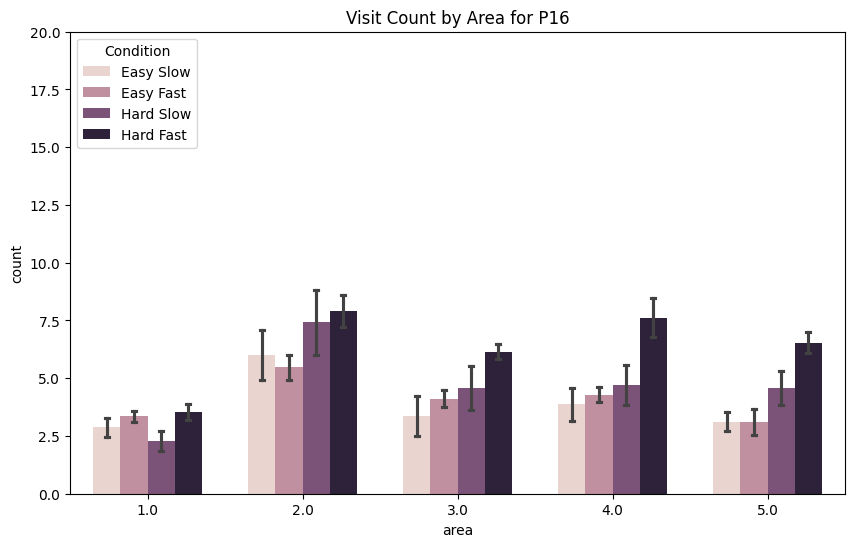

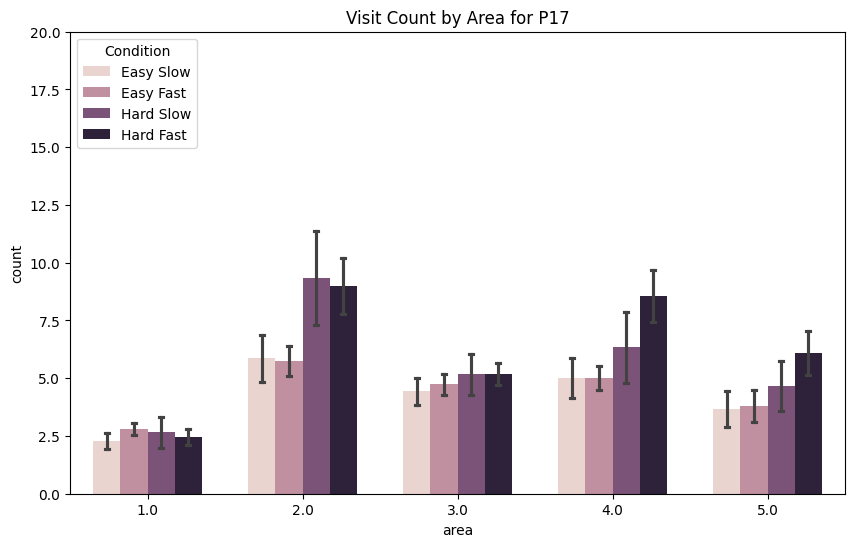

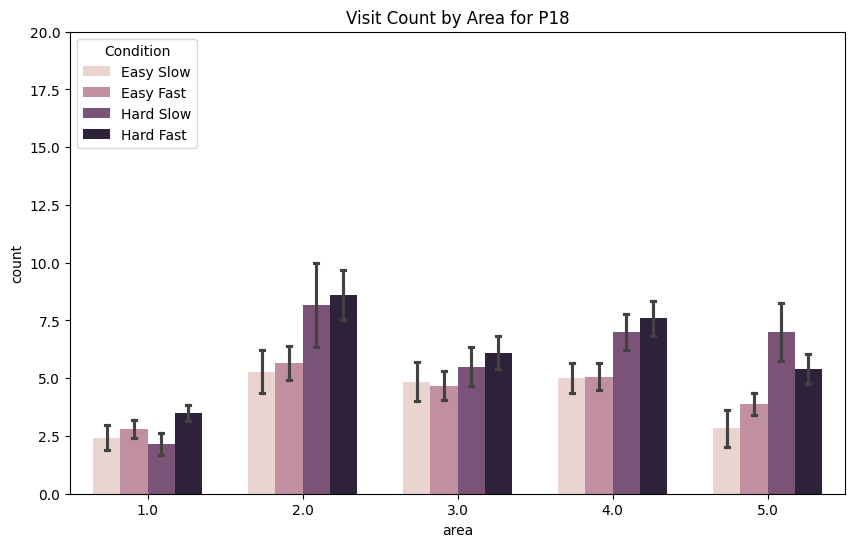

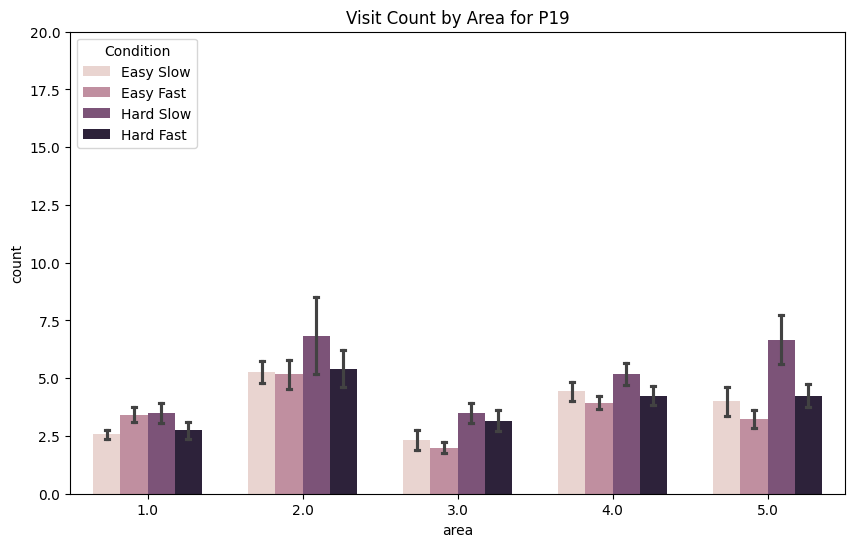

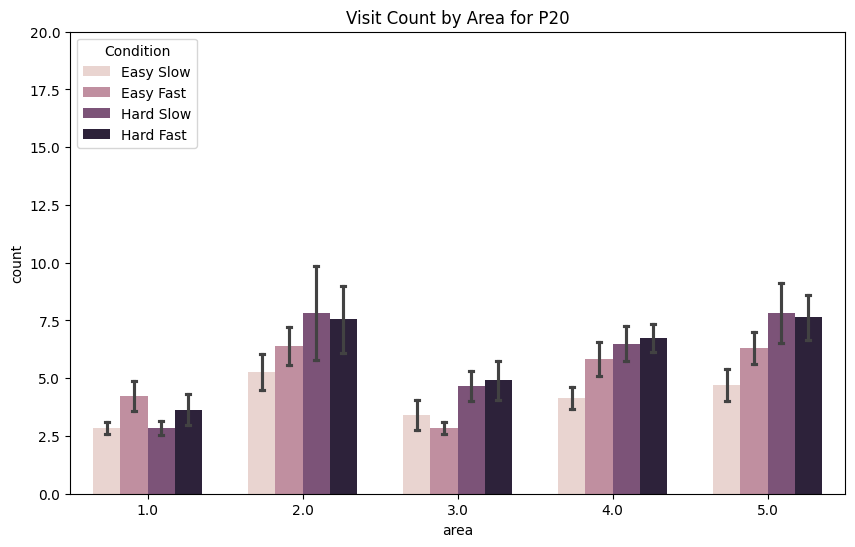

In [36]:
# barplot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")
    p_df = p_df.copy()
    p_df['visit_id'] = (p_df['area'] != p_df['area'].shift(1)).cumsum()
    p_visit_counts = p_df.groupby(['participant_id', 'condition', 'task_id', 'area', 'visit_id']).size().reset_index(name='fixation_count')
    p_visit_summary = p_visit_counts.groupby(['participant_id', 'condition', 'task_id', 'area']).size().reset_index(name='visit_count')

    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=p_visit_summary,
        x='area',
        y='visit_count',
        hue='condition',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=0.7,
    )
    plt.title(f'Visit Count by Area for P{pid}')
    plt.xlabel('area')
    plt.ylabel('count')
    plt.ylim(0, 20)

    handles, labels = ax.get_legend_handles_labels()
    plt.legend(handles, custom_labels, title='Condition', loc='upper left')
    plt.show()

### 8. Visit Frequency
Area- & condition based

##### Area-based
- A1: Less visits
- A2: More visits

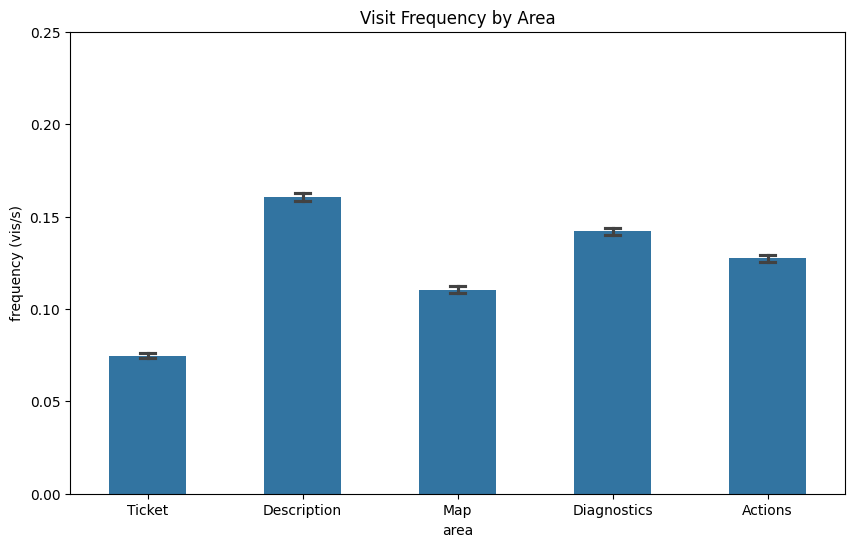

In [13]:
# barplot
plt.figure(figsize=(10, 6))
sns.barplot(
    data=df_long_expanded,
    x='area',
    y='visit_freq',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=0.5,
)
plt.title('Visit Frequency by Area')
plt.xlabel('area')
plt.ylabel('frequency (vis/s)')
plt.ylim(0, .25)
plt.show()

##### Area- & condition- based
- A1: no diff
- A2: more visits in hard
- A3: slightly more visits in hard
- A4: more visits in hard
- A5: more visits in hard

C:\Users\vale_ad\AppData\Local\Temp\ipykernel_6376\3513042191.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])


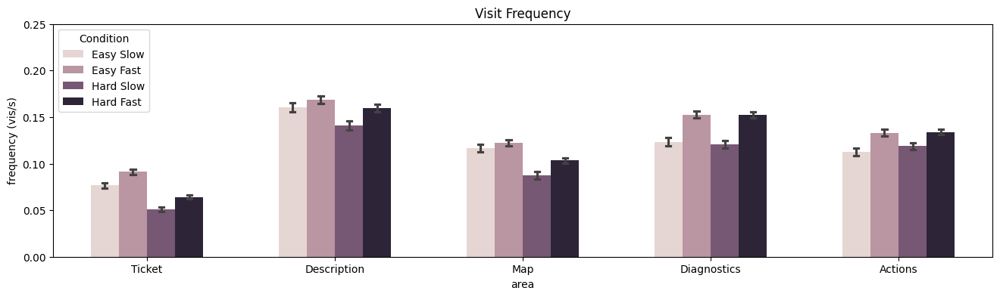

In [23]:
# barplot
plt.figure(figsize=(16, 4))
ax = sns.barplot(
    data=df_long_expanded,
    x='area',
    y='visit_freq',
    hue='condition',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=0.6,
    palette=custom_palette
)
plt.title('Visit Frequency')
plt.xlabel('area')
plt.ylabel('frequency (vis/s)')
plt.ylim(0, .25)

ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles, custom_labels, title='Condition', loc='upper left')
plt.show()


In [62]:
# Summary stats
mean = df_long_expanded.query("area == 'Ticket'")['visit_freq'].mean()
se = df_long_expanded.query("area == 'Ticket'")['visit_freq'].sem()
print(f"Ticket vis freq: {mean:.4f} (~{se:.4f})")

mean = df_long_expanded.query("area == 'Description'")['visit_freq'].mean()
se = df_long_expanded.query("area == 'Description'")['visit_freq'].sem()
print(f"Description vis freq: {mean:.4f} (~{se:.4f})")

mean = df_long_expanded.query("frequency == 'Slow'")['visit_freq'].mean()
se = df_long_expanded.query("frequency == 'Slow'")['visit_freq'].sem()
print(f"Slow vis freq: {mean:.4f} (~{se:.4f})")

mean = df_long_expanded.query("frequency == 'Fast'")['visit_freq'].mean()
se = df_long_expanded.query("frequency == 'Fast'")['visit_freq'].sem()
print(f"Fast vis freq: {mean:.4f} (~{se:.4f})")

Ticket vis freq: 0.0747 (~0.0014)
Description vis freq: 0.1603 (~0.0022)
Slow vis freq: 0.1118 (~0.0014)
Fast vis freq: 0.1293 (~0.0012)


### 9. Visit Length
Area- & condition based, per participant

##### Area-based
- A1: shorter visits
- A4: longer visits

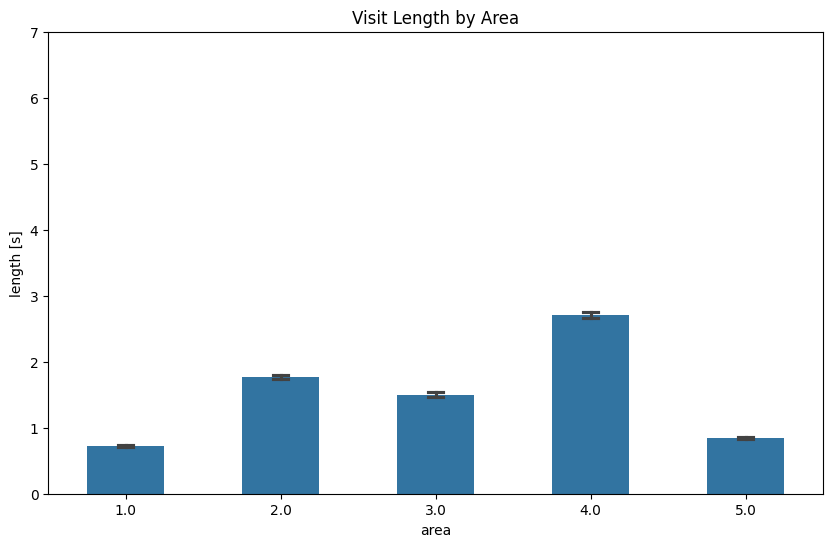

In [78]:
# barplot
df['end_timestamp'] = df['start_timestamp'] + (df['duration']/1000)
df['visit_id'] = (df['area'] != df['area'].shift(1)).cumsum()
visit_details = df.groupby(['participant_id', 'condition', 'task_id', 'area', 'visit_id']).agg(
    start_time=('start_timestamp', 'first'),
    end_time=('end_timestamp', 'last'),
).reset_index()
visit_details['length'] = visit_details['end_time'] - visit_details['start_time']

plt.figure(figsize=(10, 6))
sns.barplot(
    data=visit_details,
    x='area',
    y='length',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=0.5,
)
plt.title('Visit Length by Area')
plt.xlabel('area')
plt.ylabel('length [s]')
plt.ylim(0,7)
plt.show()

##### Area-based (per participant)
- consistent through participants

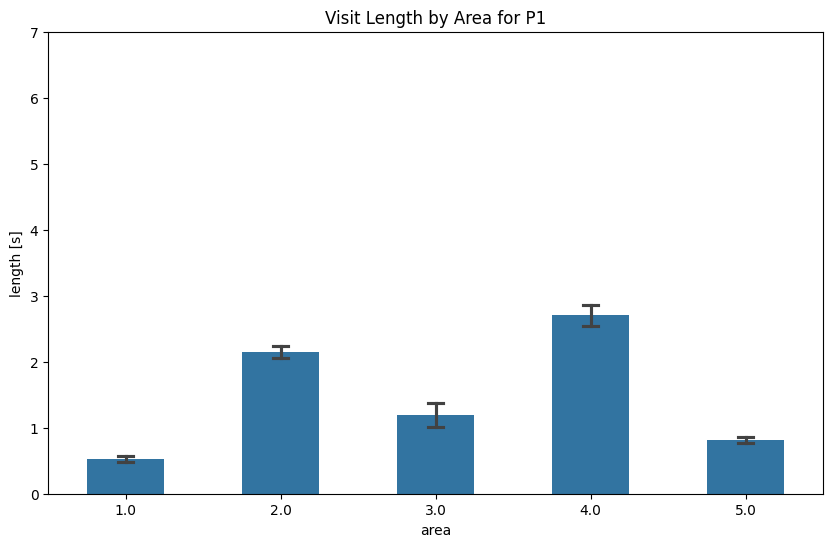

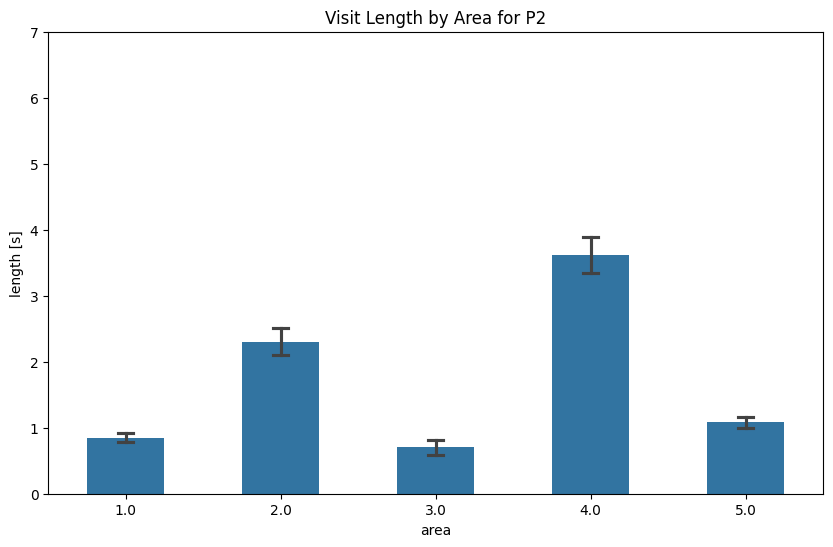

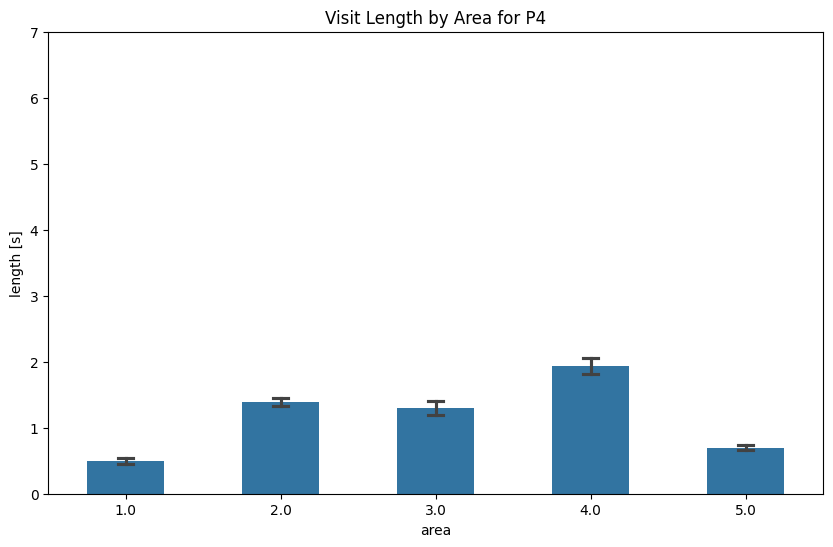

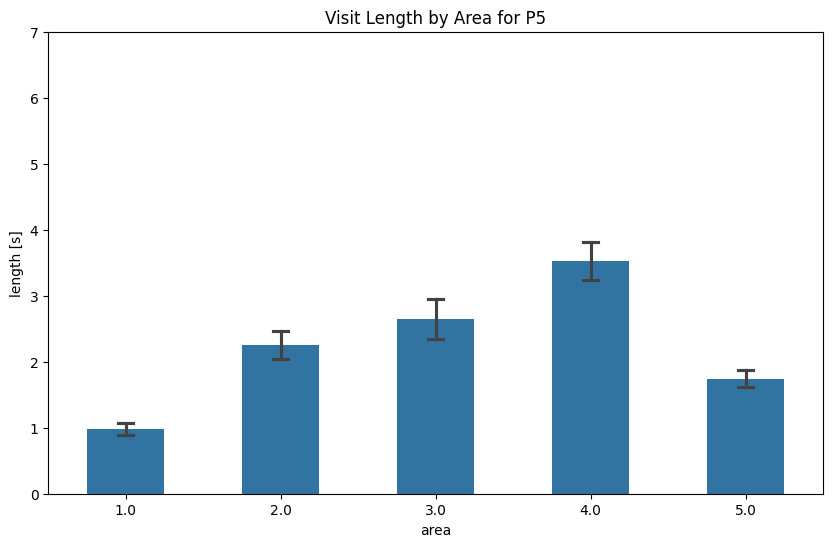

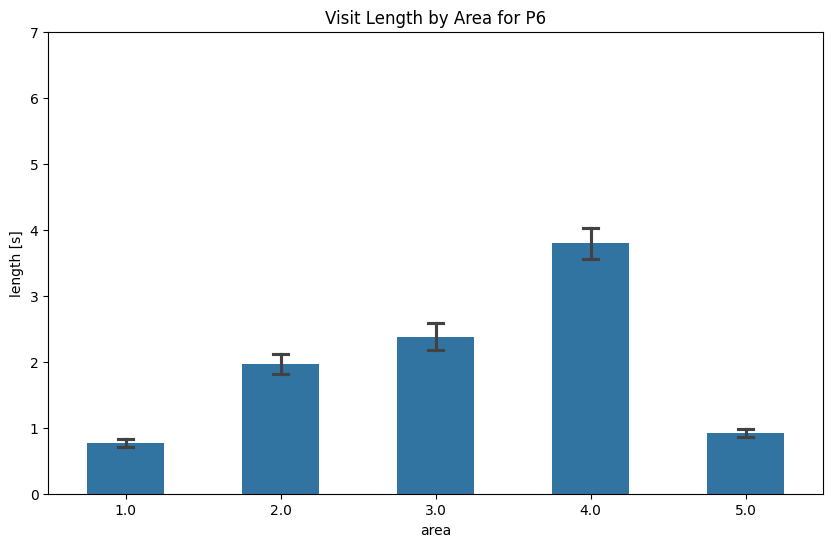

...

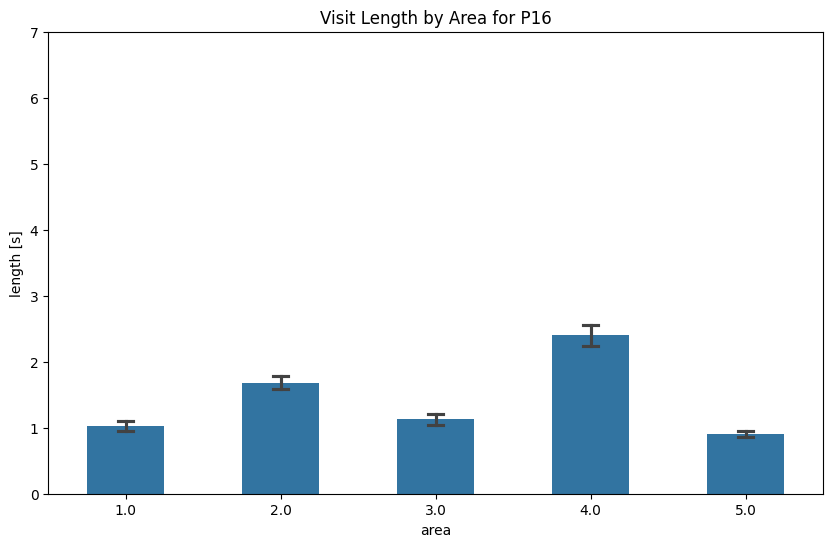

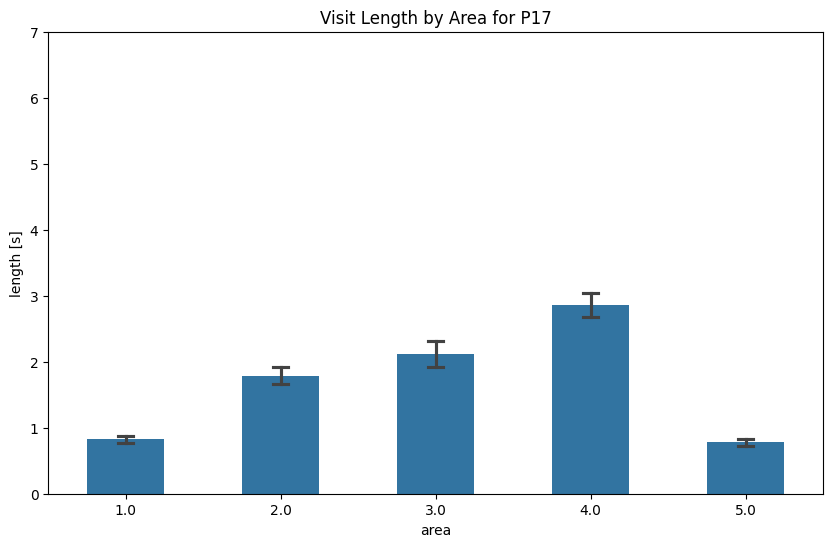

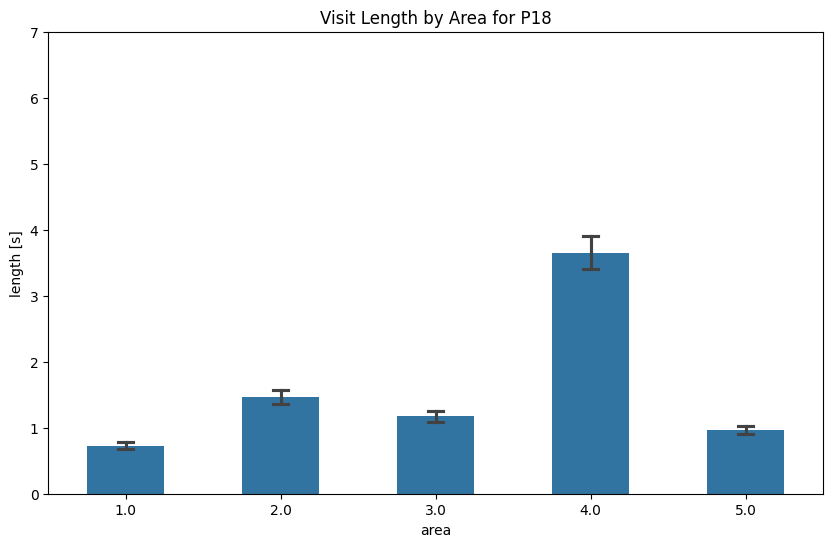

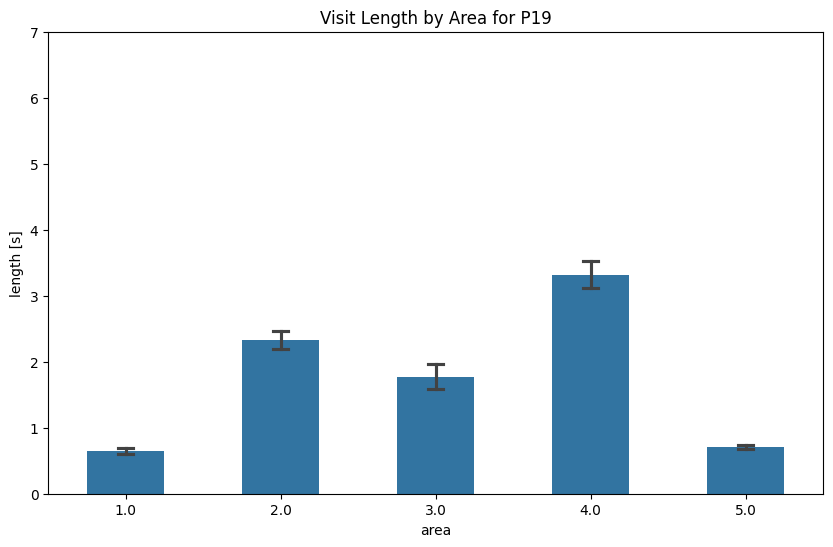

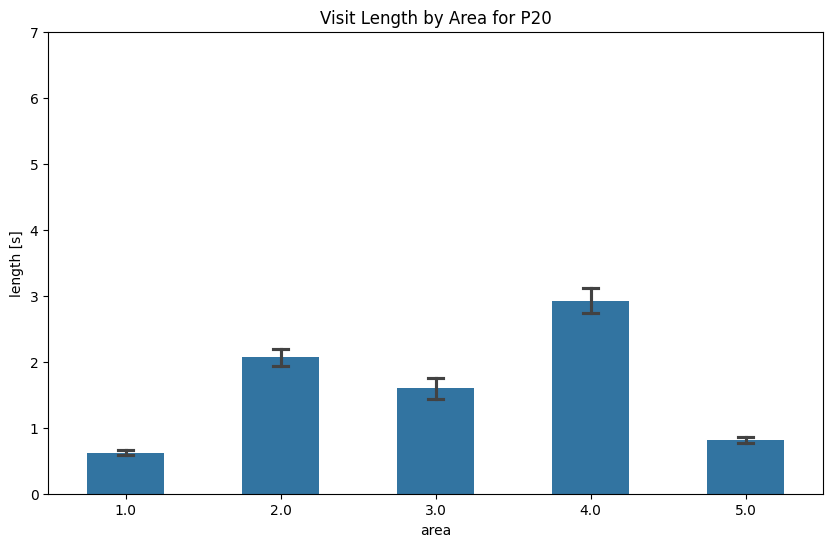

In [38]:
# barplot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")
    p_df = p_df.copy()
    p_df['end_timestamp'] = p_df['start_timestamp'] + (df['duration']/1000)
    p_df['visit_id'] = (p_df['area'] != p_df['area'].shift(1)).cumsum()
    p_visit_details = p_df.groupby(['participant_id', 'condition', 'task_id', 'area', 'visit_id']).agg(
        start_time=('start_timestamp', 'first'),
        end_time=('end_timestamp', 'last'),
    ).reset_index()
    p_visit_details['length'] = p_visit_details['end_time'] - p_visit_details['start_time']

    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=p_visit_details,
        x='area',
        y='length',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=0.5,
    )
    plt.title(f'Visit Length by Area for P{pid}')
    plt.xlabel('area')
    plt.ylabel('length [s]')
    plt.ylim(0, 7)
    plt.show()

##### Area- & condition- based
- A1: no diff
- A2: longer visits in hard
- A3: longer visits in slow
- A4: longer visits in slow
- A5: no diff

C:\Users\vale_ad\AppData\Local\Temp\ipykernel_6376\1873949670.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])


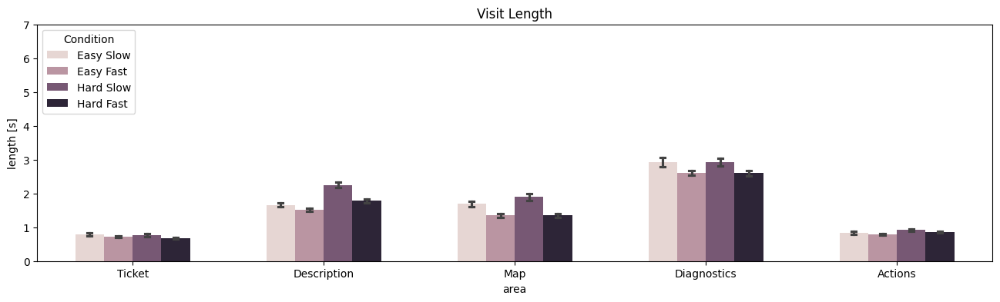

In [24]:
# barplot
df['end_timestamp'] = df['start_timestamp'] + (df['duration']/1000)
df['visit_id'] = (df['area'] != df['area'].shift(1)).cumsum()
visit_details = df.groupby(['participant_id', 'condition', 'task_id', 'area', 'visit_id']).agg(
    start_time=('start_timestamp', 'first'),
    end_time=('end_timestamp', 'last'),
).reset_index()
visit_details['length'] = visit_details['end_time'] - visit_details['start_time']

plt.figure(figsize=(16, 4))
ax = sns.barplot(
    data=visit_details,
    x='area',
    y='length',
    hue='condition',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=0.6,
    palette=custom_palette
)
plt.title('Visit Length')
plt.xlabel('area')
plt.ylabel('length [s]')
plt.ylim(0,7)

ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles, custom_labels, title='Condition', loc='upper left')
plt.show()

In [67]:
# Summary stats
mean = visit_details.query("area == 4")['length'].mean()
se = visit_details.query("area == 4")['length'].sem()
print(f"Diagnostics vis length: {mean:.2f} (~{se:.2f})")

mean = visit_details.query("condition == 1 or condition == 3")['length'].mean()
se = visit_details.query("condition == 1 or condition == 3")['length'].sem()
print(f"Slow vis length: {mean:.2f} (~{se:.2f})")

mean = visit_details.query("condition == 2 or condition == 4")['length'].mean()
se = visit_details.query("condition == 2 or condition == 4")['length'].sem()
print(f"Fast vis length: {mean:.2f} (~{se:.2f})")

Diagnostics vis length: 2.70 (~0.05)
Slow vis length: 1.80 (~0.03)
Fast vis length: 1.54 (~0.02)


##### Area- & condition- based (per participant)
- (...)

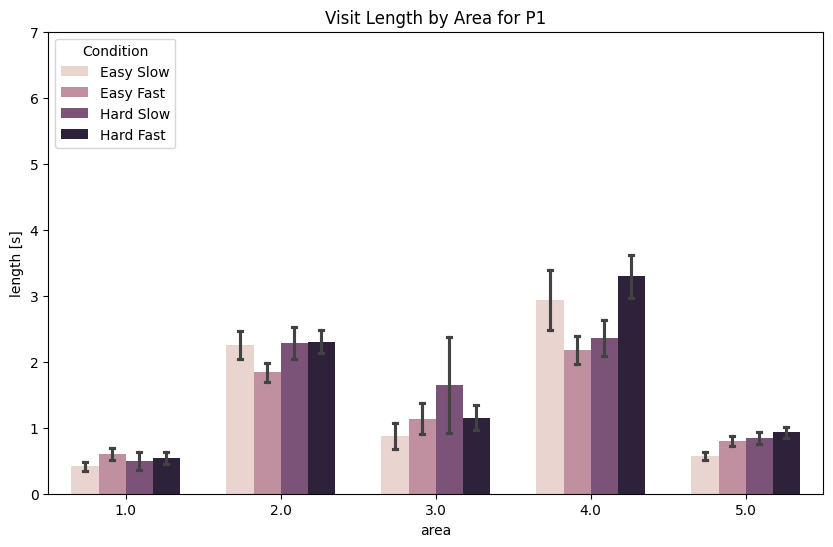

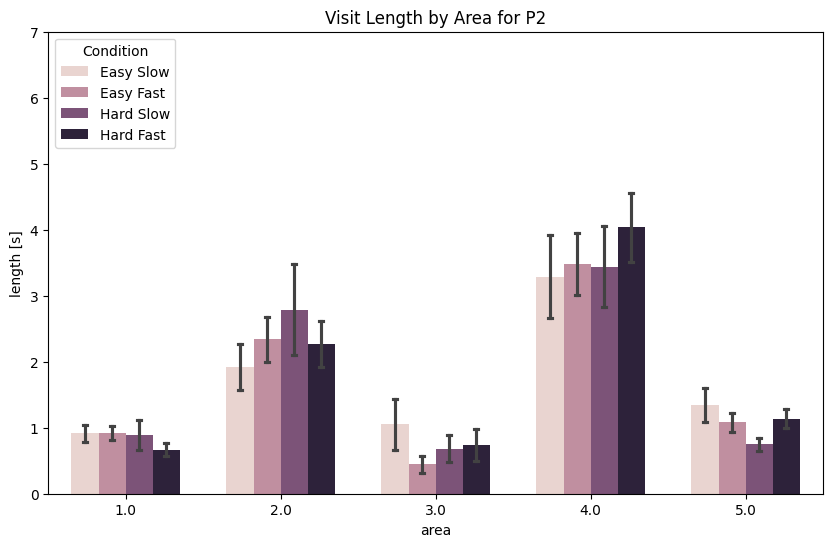

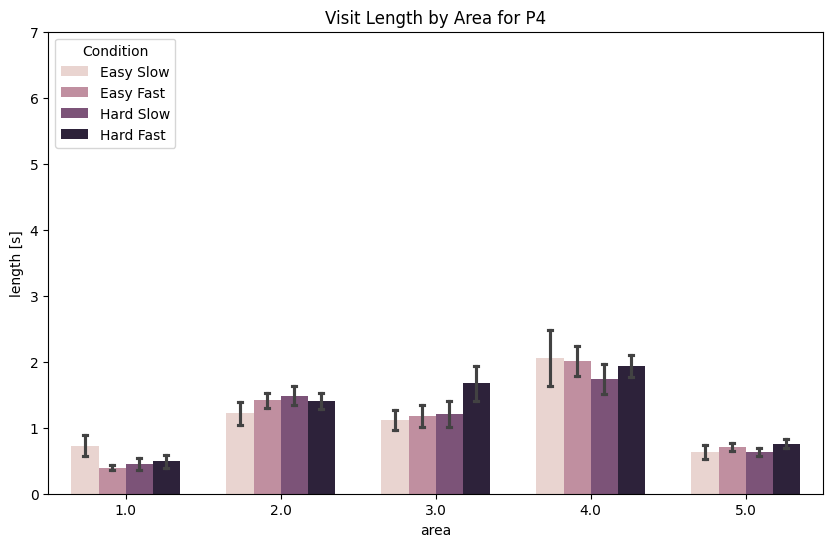

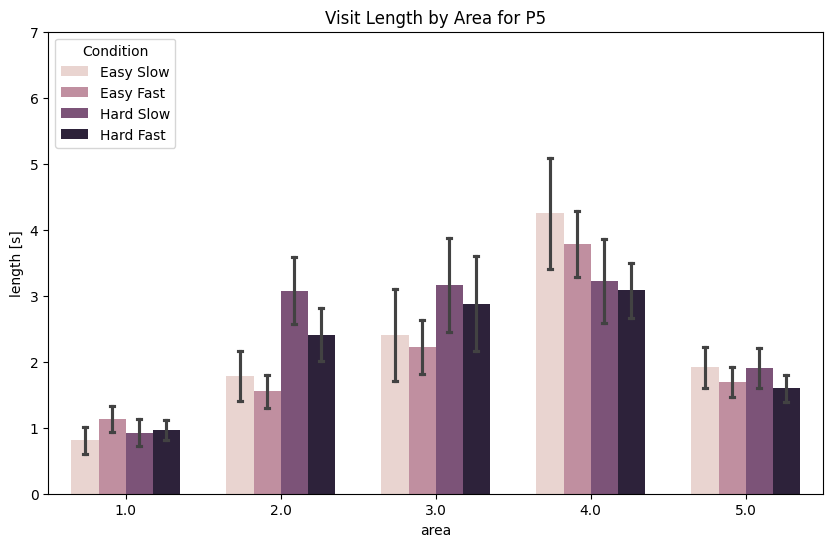

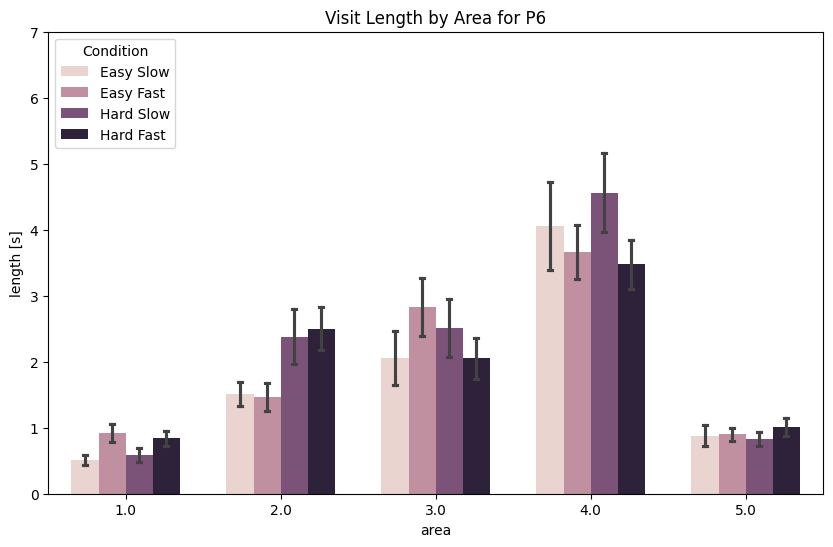

...

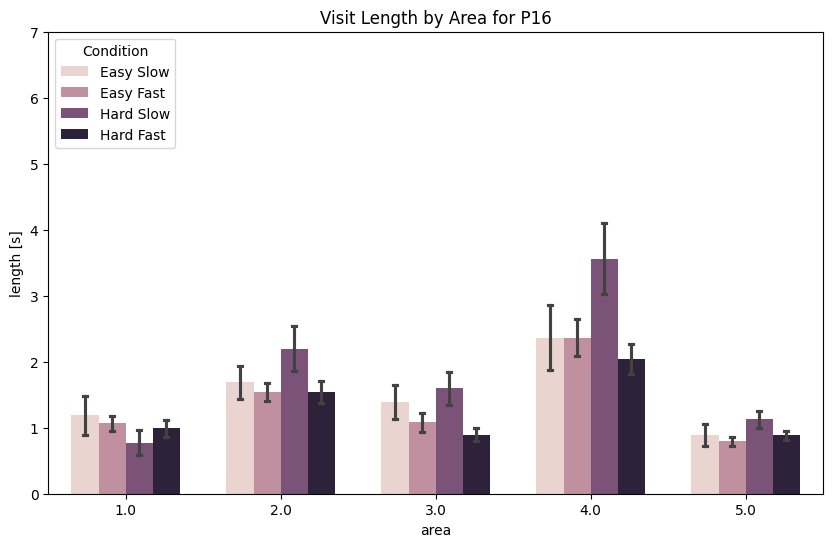

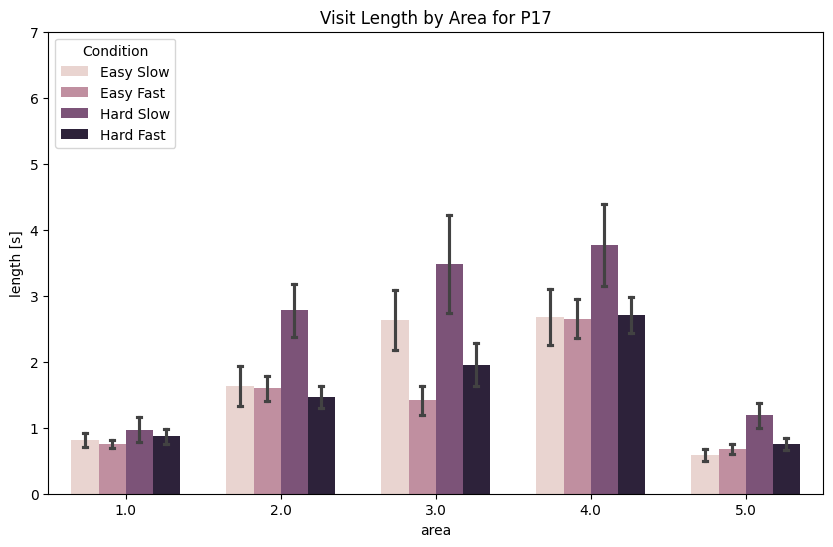

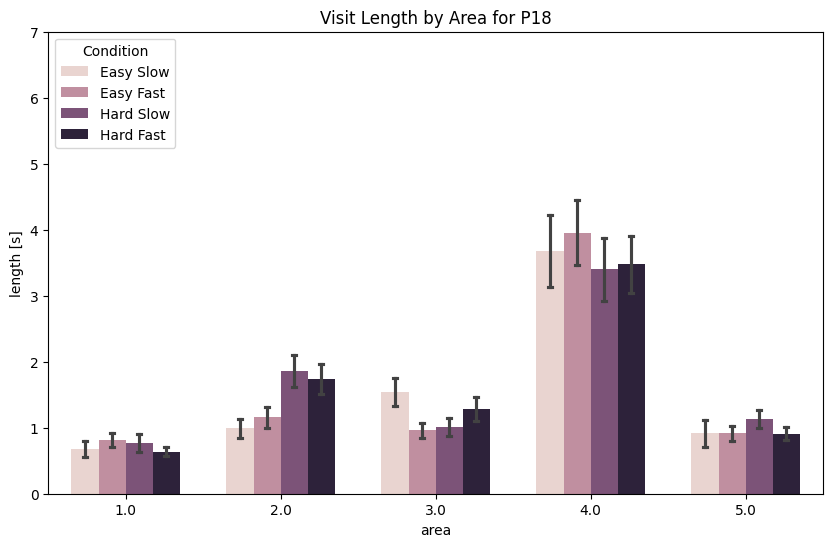

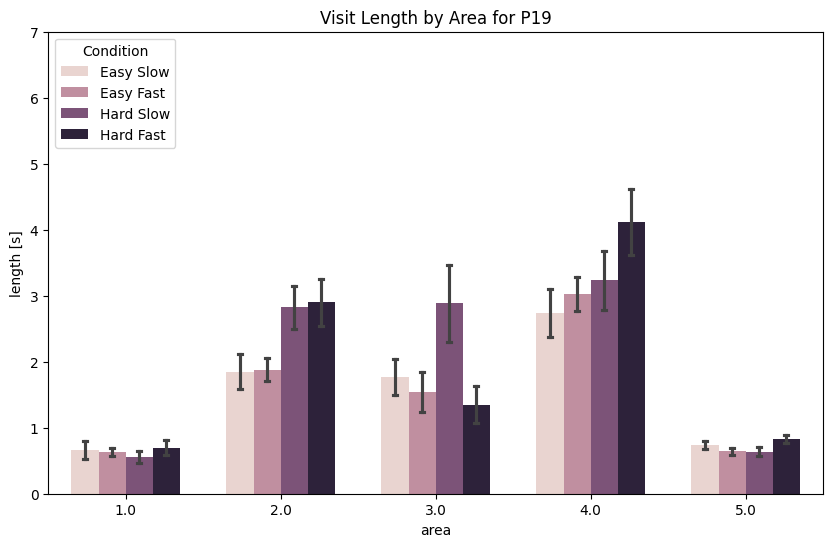

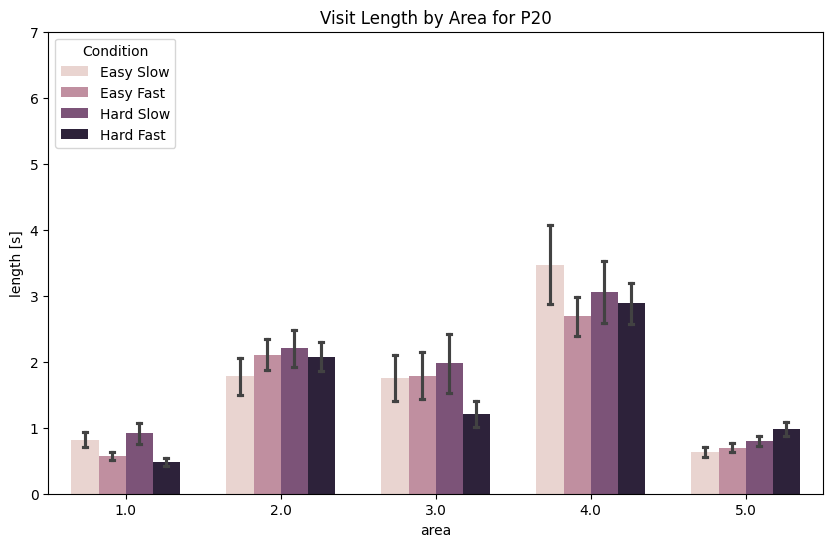

In [40]:
# barplot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")
    p_df = p_df.copy()
    p_df['end_timestamp'] = p_df['start_timestamp'] + (df['duration']/1000)
    p_df['visit_id'] = (p_df['area'] != p_df['area'].shift(1)).cumsum()
    p_visit_details = p_df.groupby(['participant_id', 'condition', 'task_id', 'area', 'visit_id']).agg(
        start_time=('start_timestamp', 'first'),
        end_time=('end_timestamp', 'last'),
    ).reset_index()
    p_visit_details['length'] = p_visit_details['end_time'] - p_visit_details['start_time']

    plt.figure(figsize=(10, 6))
    ax = sns.barplot(
        data=p_visit_details,
        x='area',
        y='length',
        hue='condition',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=0.7,
    )
    plt.title(f'Visit Length by Area for P{pid}')
    plt.xlabel('area')
    plt.ylabel('length [s]')
    plt.ylim(0, 7)

    handles, labels = ax.get_legend_handles_labels()
    plt.legend(handles, custom_labels, title='Condition', loc='upper left')
    plt.show()

### 10. Total Visit Length Percentage
Area- & condition based, per participant

##### Area-based
- A1: shorter time
- A4: longer time

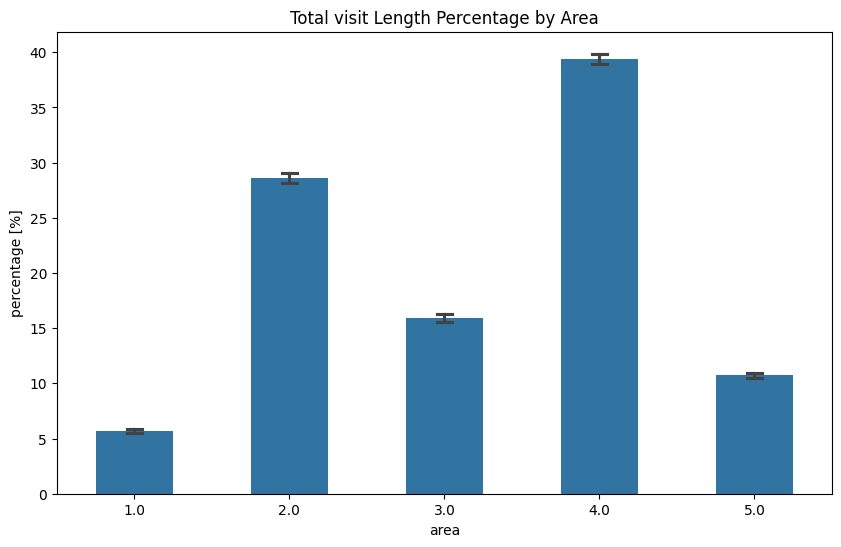

In [41]:
# barplot
df['end_timestamp'] = df['start_timestamp'] + (df['duration']/1000)
df['visit_id'] = (df['area'] != df['area'].shift(1)).cumsum()
visit_details = df.groupby(['participant_id', 'condition', 'task_id', 'area', 'visit_id']).agg(
    start_time=('start_timestamp', 'first'),
    end_time=('end_timestamp', 'last'),
).reset_index()
visit_details['length'] = visit_details['end_time'] - visit_details['start_time']

total_visit_details = visit_details.groupby(['participant_id', 'condition', 'task_id', 'area']).agg(
    total_length=('length', 'sum')
).reset_index()
total_lengths = total_visit_details.groupby(['participant_id', 'condition', 'task_id'])['total_length'].transform('sum')
total_visit_details['length_pct'] = (total_visit_details['total_length'] / total_lengths) * 100

plt.figure(figsize=(10, 6))
sns.barplot(
    data=total_visit_details,
    x='area',
    y='length_pct',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=0.5,
)
plt.title('Total visit Length Percentage by Area')
plt.xlabel('area')
plt.ylabel('percentage [%]')
plt.ylim(0,)
plt.show()

##### Area-based (per participant)
- consistent through participants

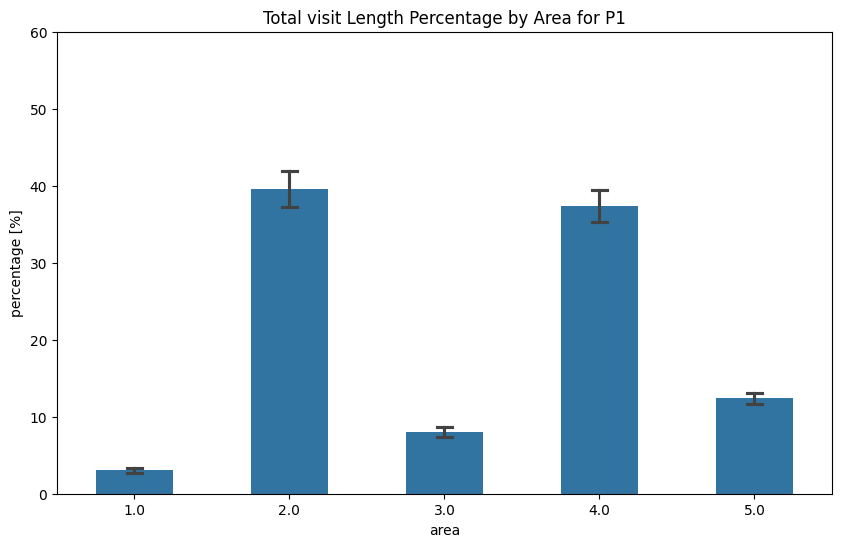

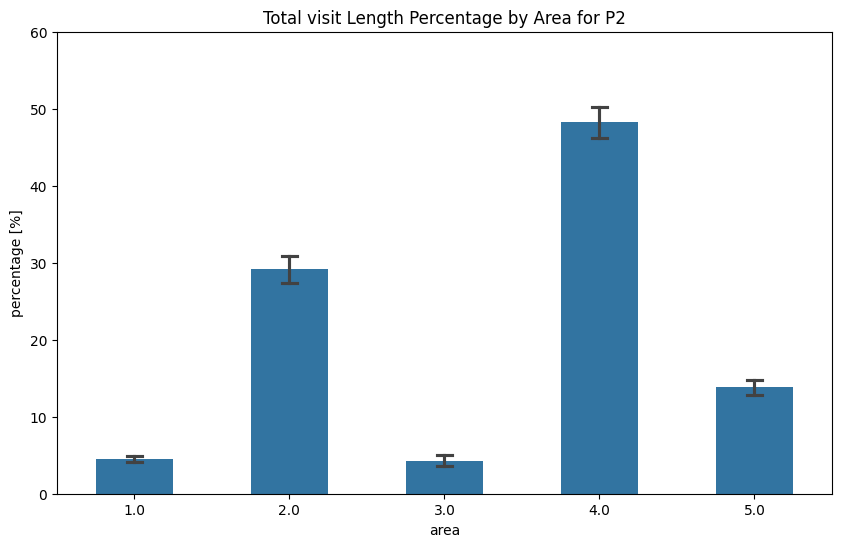

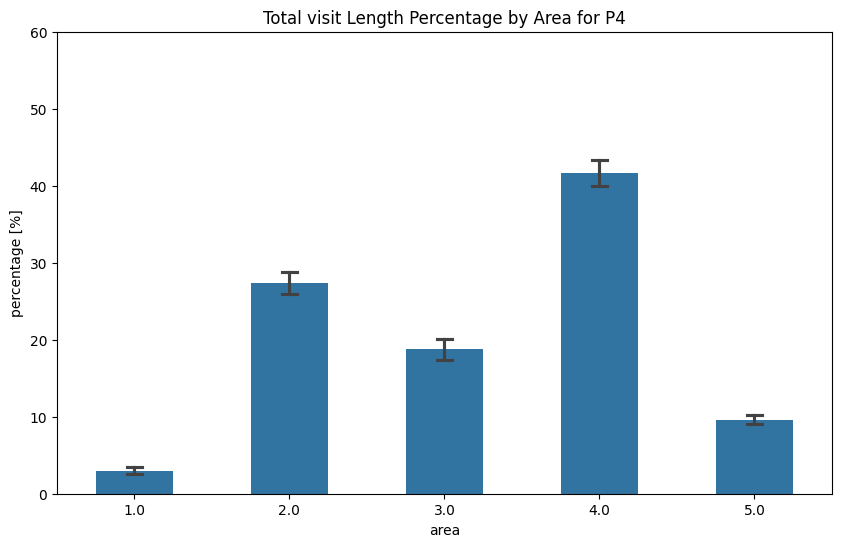

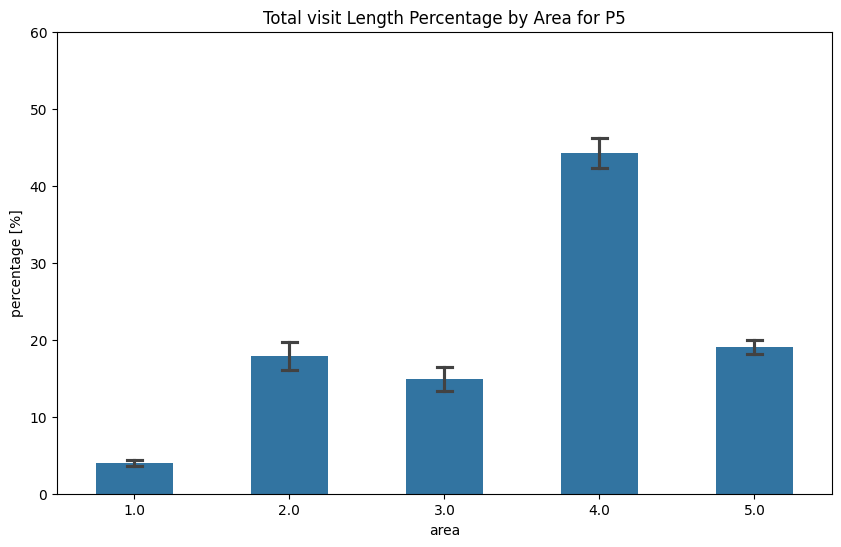

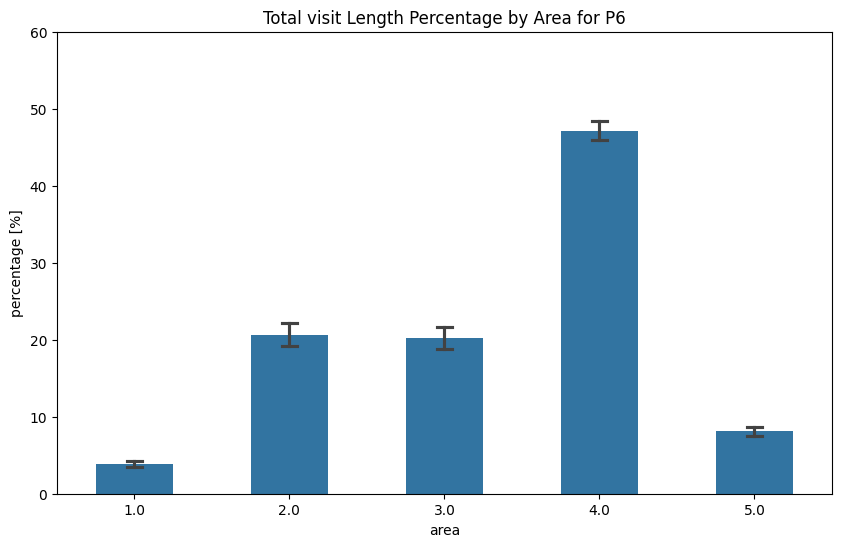

...

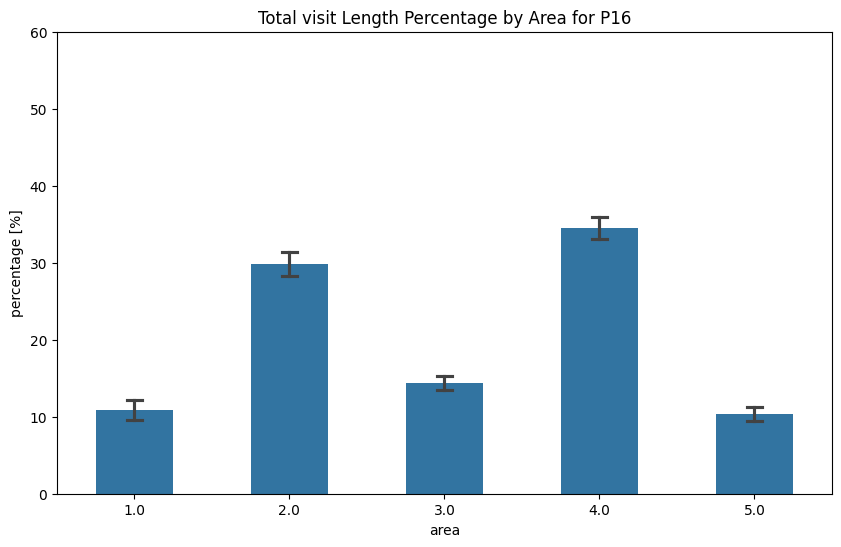

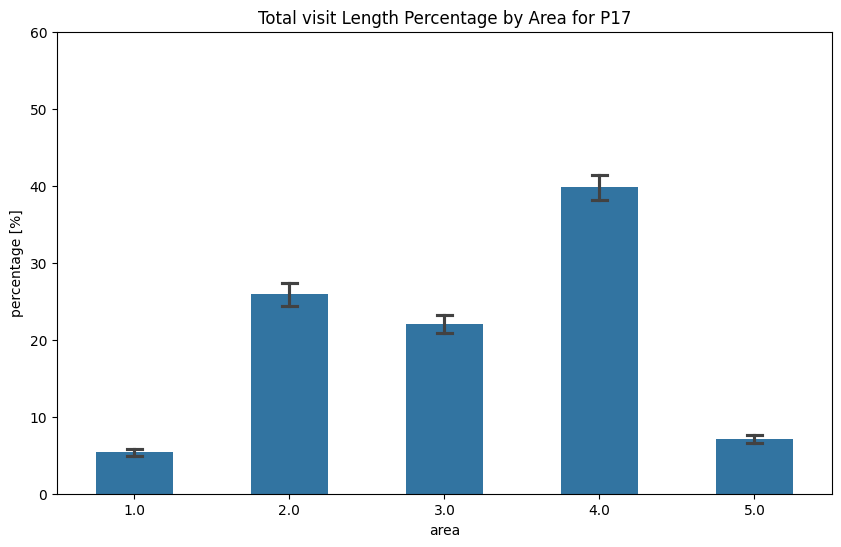

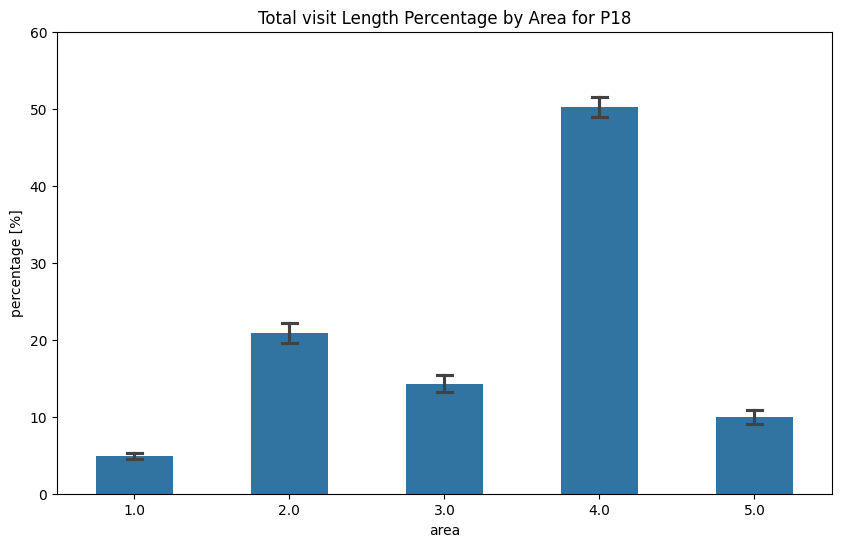

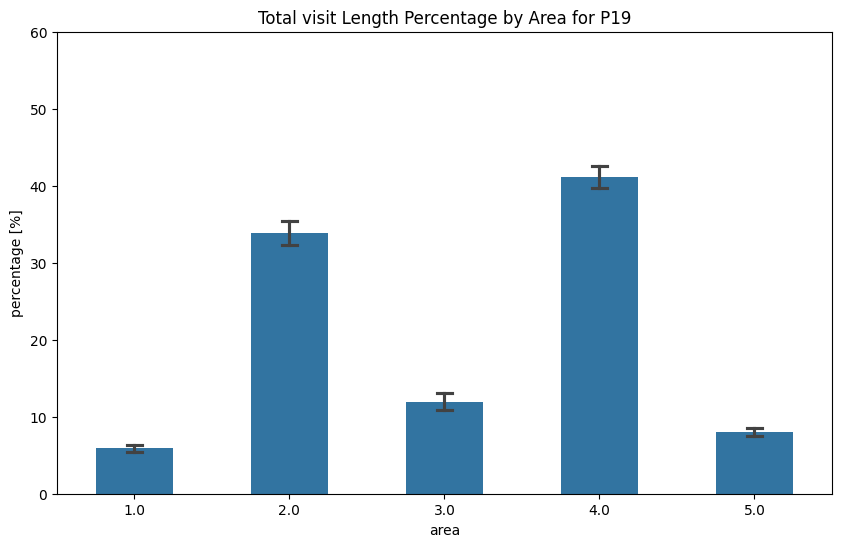

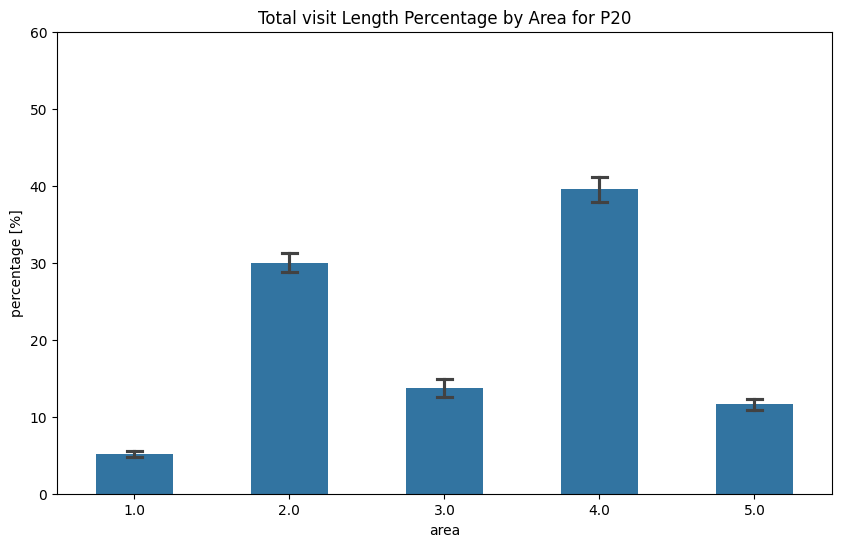

In [42]:
# barplot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")
    p_df = p_df.copy()
    p_df['end_timestamp'] = p_df['start_timestamp'] + (p_df['duration']/1000)
    p_df['visit_id'] = (p_df['area'] != p_df['area'].shift(1)).cumsum()
    p_visit_details = p_df.groupby(['participant_id', 'condition', 'task_id', 'area', 'visit_id']).agg(
        start_time=('start_timestamp', 'first'),
        end_time=('end_timestamp', 'last'),
    ).reset_index()
    p_visit_details['length'] = p_visit_details['end_time'] - p_visit_details['start_time']

    p_total_visit_details = p_visit_details.groupby(['participant_id', 'condition', 'task_id', 'area']).agg(
        total_length=('length', 'sum')
    ).reset_index()
    p_total_lengths = p_total_visit_details.groupby(['participant_id', 'condition', 'task_id'])['total_length'].transform('sum')
    p_total_visit_details['length_pct'] = (p_total_visit_details['total_length'] / p_total_lengths) * 100

    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=p_total_visit_details,
        x='area',
        y='length_pct',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=0.5,
    )
    plt.title(f'Total visit Length Percentage by Area for P{pid}')
    plt.xlabel('area')
    plt.ylabel('percentage [%]')
    plt.ylim(0, 60)
    plt.show()

##### Area- & condition- based
- A1: longer time in easy
- A2: longer in hard-slow
- A3: longer time in easy-slow
- A4: longer time in fast
- A5: Interaction effect

C:\Users\vale_ad\AppData\Local\Temp\ipykernel_6376\3233472740.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])


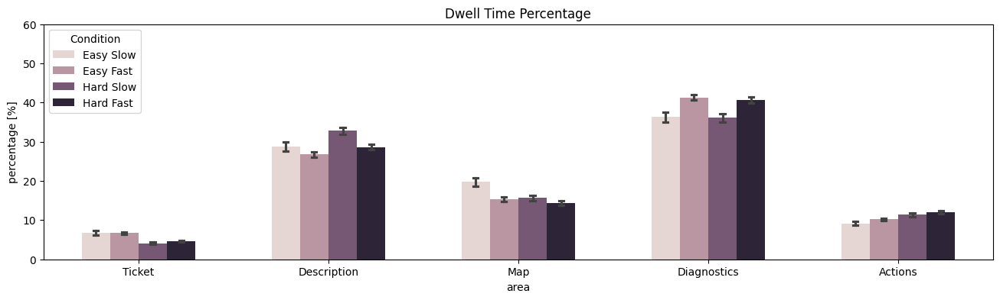

In [25]:
# barplot
df['end_timestamp'] = df['start_timestamp'] + (df['duration']/1000)
df['visit_id'] = (df['area'] != df['area'].shift(1)).cumsum()
visit_details = df.groupby(['participant_id', 'condition', 'task_id', 'area', 'visit_id']).agg(
    start_time=('start_timestamp', 'first'),
    end_time=('end_timestamp', 'last'),
).reset_index()
visit_details['length'] = visit_details['end_time'] - visit_details['start_time']

total_visit_details = visit_details.groupby(['participant_id', 'condition', 'task_id', 'area']).agg(
    total_length=('length', 'sum')
).reset_index()
total_lengths = total_visit_details.groupby(['participant_id', 'condition', 'task_id'])['total_length'].transform('sum')
total_visit_details['length_pct'] = (total_visit_details['total_length'] / total_lengths) * 100

plt.figure(figsize=(16, 4))
ax = sns.barplot(
    data=total_visit_details,
    x='area',
    y='length_pct',
    hue='condition',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=0.6,
    palette=custom_palette
)
plt.title('Dwell Time Percentage')
plt.xlabel('area')
plt.ylabel('percentage [%]')
plt.ylim(0, 60)

ax.set_xticklabels(['Ticket', 'Description', 'Map', 'Diagnostics', 'Actions'])
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles, custom_labels, title='Condition', loc='upper left')
plt.show()

In [77]:
# Summary stats
mean = total_visit_details.query("area == 1")['length_pct'].mean()
se = total_visit_details.query("area == 1")['length_pct'].sem()
print(f"Ticket dwell: {mean:.2f}% (~{se:.2f}%)")

mean = total_visit_details.query("area == 2")['length_pct'].mean()
se = total_visit_details.query("area == 2")['length_pct'].sem()
print(f"Description dwell: {mean:.2f}% (~{se:.2f}%)")

mean = total_visit_details.query("area == 4")['length_pct'].mean()
se = total_visit_details.query("area == 4")['length_pct'].sem()
print(f"Diagnostics dwell: {mean:.2f}% (~{se:.2f}%)")

mean = total_visit_details.query("area == 2 and (condition == 1 or condition == 3)")['length_pct'].mean()
se = total_visit_details.query("area == 2 and (condition == 1 or condition == 3)")['length_pct'].sem()
print(f"Description slow dwell: {mean:.2f}% (~{se:.2f}%)")

mean = total_visit_details.query("area == 2 and (condition == 2 or condition == 4)")['length_pct'].mean()
se = total_visit_details.query("area == 2 and (condition == 2 or condition == 4)")['length_pct'].sem()
print(f"Description fast dwell: {mean:.2f}% (~{se:.2f}%)")

mean = total_visit_details.query("area == 4 and (condition == 1 or condition == 3)")['length_pct'].mean()
se = total_visit_details.query("area == 4 and (condition == 1 or condition == 3)")['length_pct'].sem()
print(f"Diagnostics slow dwell: {mean:.2f}% (~{se:.2f}%)")

mean = total_visit_details.query("area == 4 and (condition == 2 or condition == 4)")['length_pct'].mean()
se = total_visit_details.query("area == 4 and (condition == 2 or condition == 4)")['length_pct'].sem()
print(f"Diagnostics fast dwell: {mean:.2f}% (~{se:.2f}%)")

mean = total_visit_details.query("area == 3 and (condition == 1 or condition ==23)")['length_pct'].mean()
se = total_visit_details.query("area == 3 and (condition == 1 or condition == 2)")['length_pct'].sem()
print(f"Map easy dwell: {mean:.2f}% (~{se:.2f}%)")

mean = total_visit_details.query("area == 3 and (condition == 3 or condition == 4)")['length_pct'].mean()
se = total_visit_details.query("area == 3 and (condition == 3 or condition == 4)")['length_pct'].sem()
print(f"Map hard dwell: {mean:.2f}% (~{se:.2f}%)")

mean = total_visit_details.query("area == 5 and (condition == 1 or condition == 2)")['length_pct'].mean()
se = total_visit_details.query("area == 5 and (condition == 1 or condition == 2)")['length_pct'].sem()
print(f"Actions easy dwell: {mean:.2f}% (~{se:.2f}%)")

mean = total_visit_details.query("area == 5 and (condition == 3 or condition == 4)")['length_pct'].mean()
se = total_visit_details.query("area == 5 and (condition == 3 or condition == 4)")['length_pct'].sem()
print(f"Actions hard dwell: {mean:.2f}% (~{se:.2f}%)")

Ticket dwell: 5.67% (~0.16%)
Description dwell: 28.61% (~0.42%)
Diagnostics dwell: 39.41% (~0.46%)
Description slow dwell: 30.62% (~0.74%)
Description fast dwell: 27.60% (~0.50%)
Diagnostics slow dwell: 36.21% (~0.84%)
Diagnostics fast dwell: 41.01% (~0.52%)
Map easy dwell: 19.75% (~0.55%)
Map hard dwell: 14.79% (~0.46%)
Actions easy dwell: 9.86% (~0.26%)
Actions hard dwell: 11.79% (~0.29%)


##### Area- & condition- based (per participant)
- (...)

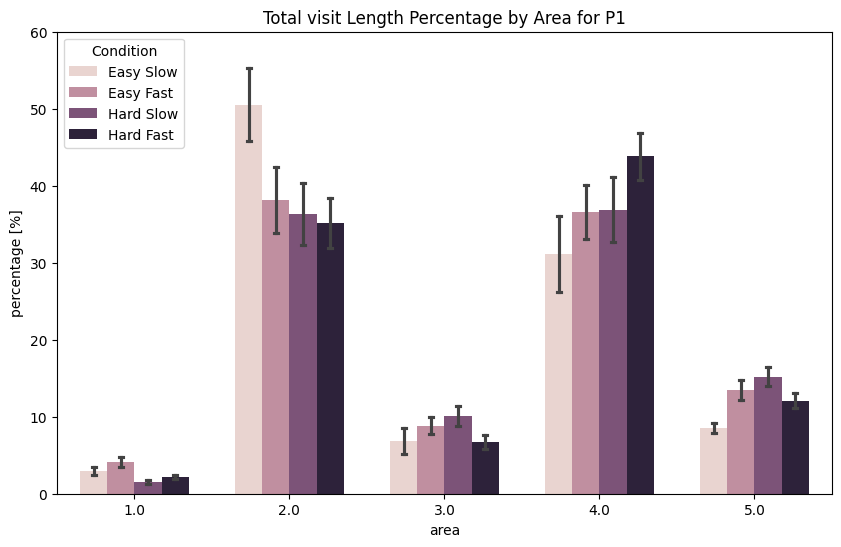

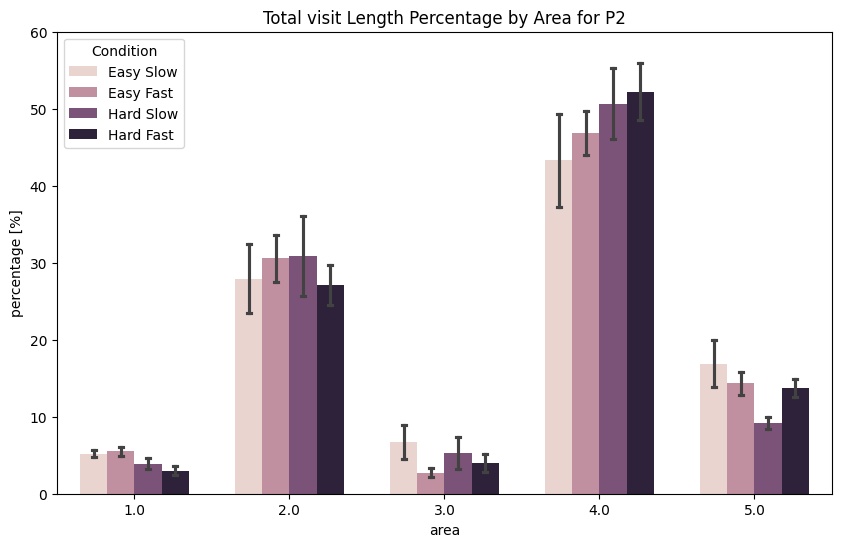

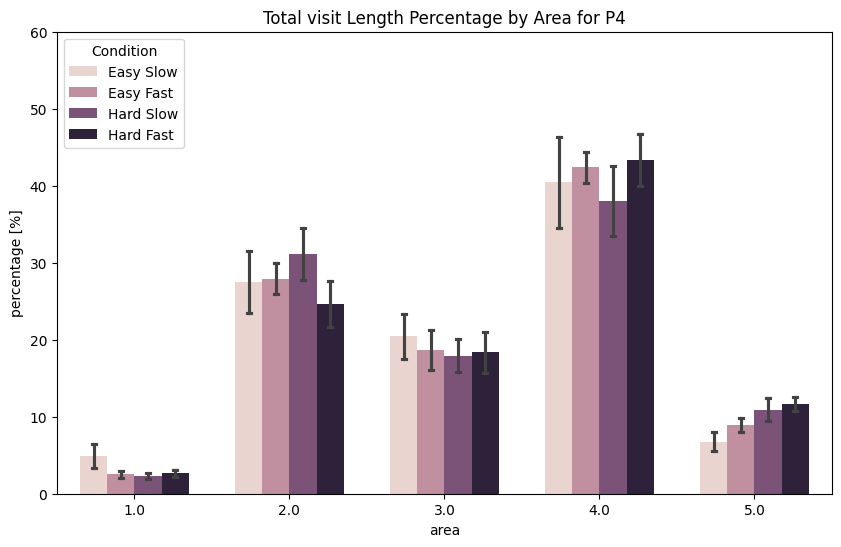

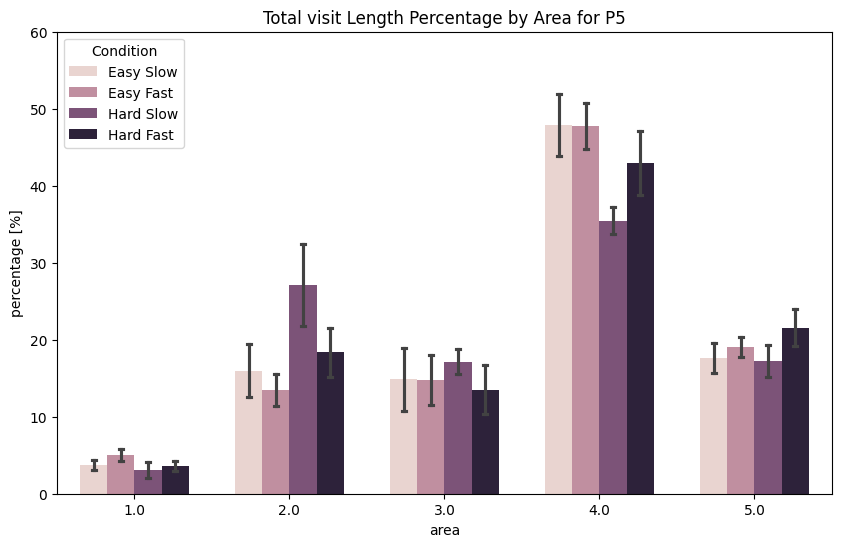

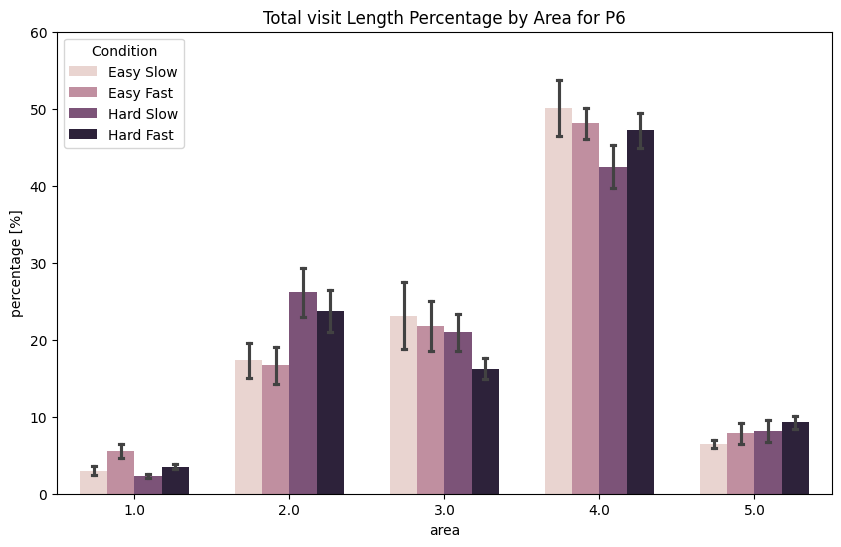

...

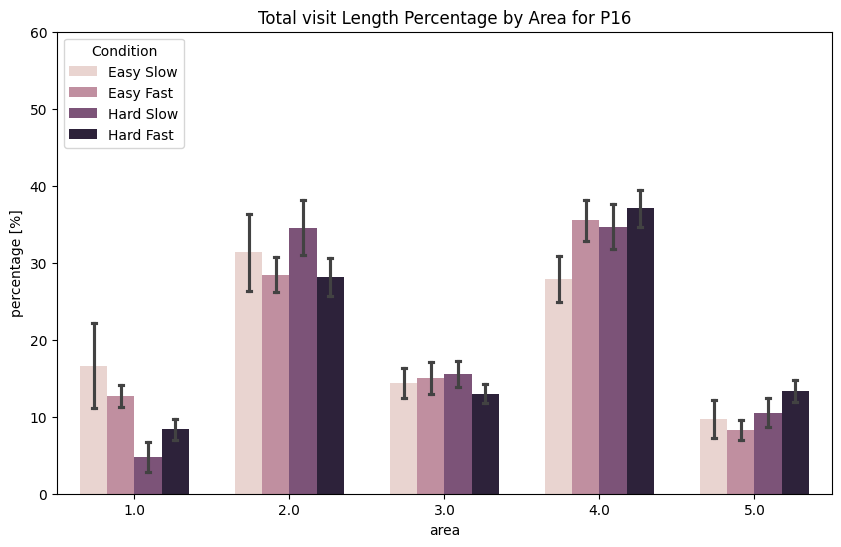

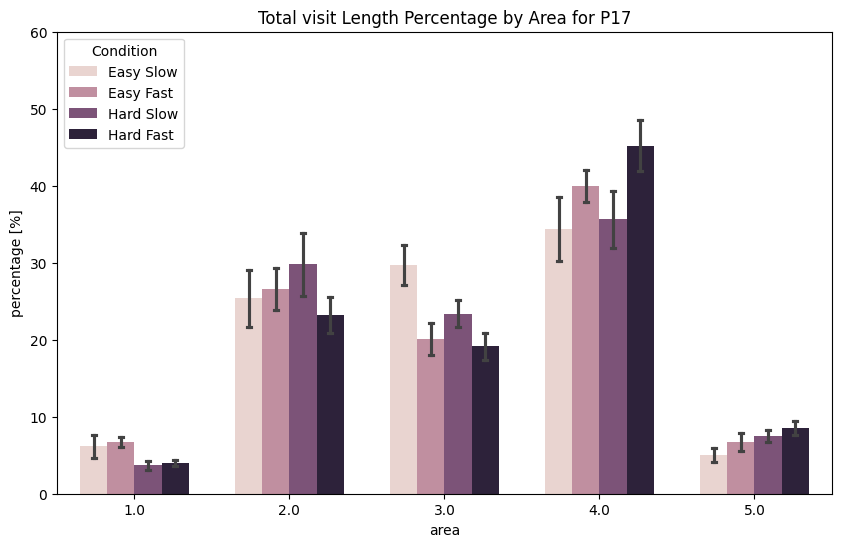

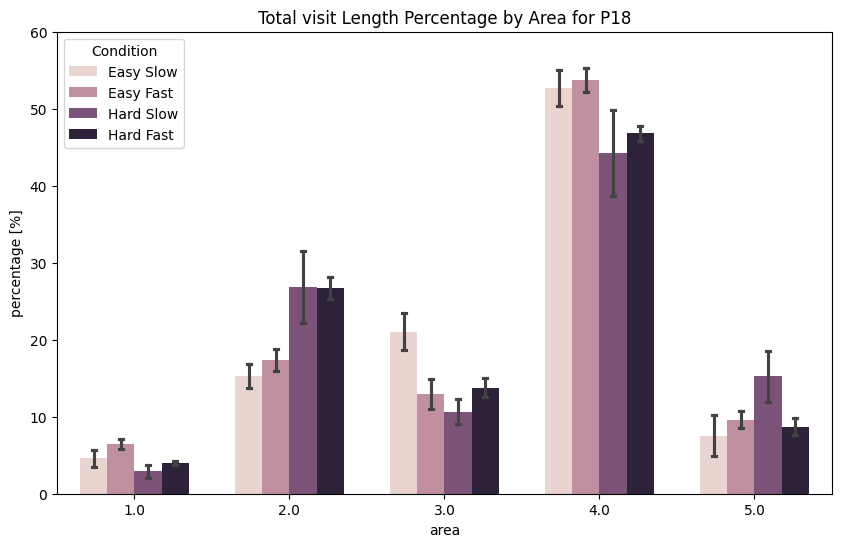

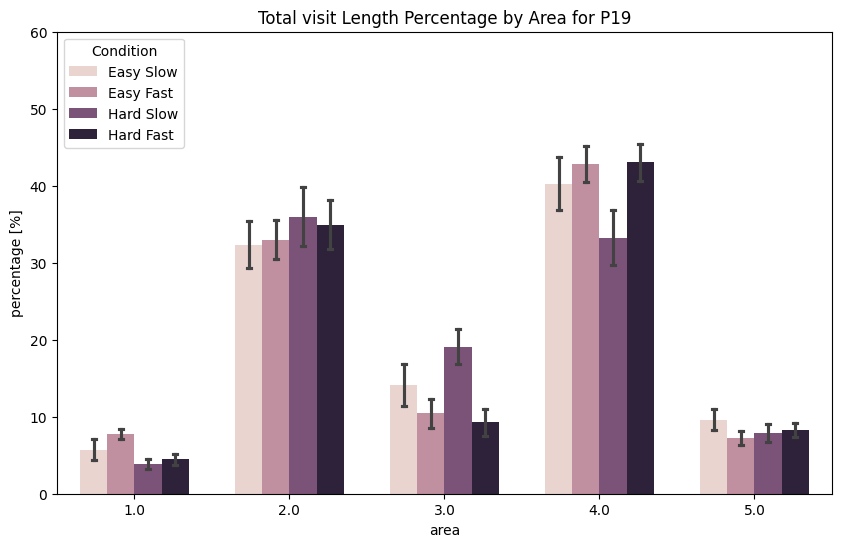

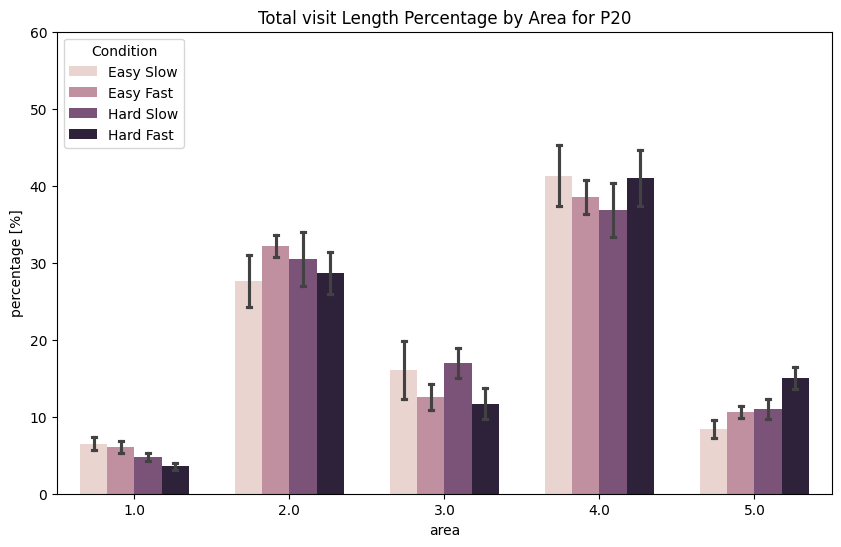

In [44]:
# barplot
for pid in participant_ids:
    p_df = df.query(f"participant_id == {pid}")
    p_df = p_df.copy()
    p_df['end_timestamp'] = p_df['start_timestamp'] + (p_df['duration']/1000)
    p_df['visit_id'] = (p_df['area'] != p_df['area'].shift(1)).cumsum()
    p_visit_details = p_df.groupby(['participant_id', 'condition', 'task_id', 'area', 'visit_id']).agg(
        start_time=('start_timestamp', 'first'),
        end_time=('end_timestamp', 'last'),
    ).reset_index()
    p_visit_details['length'] = p_visit_details['end_time'] - p_visit_details['start_time']

    p_total_visit_details = p_visit_details.groupby(['participant_id', 'condition', 'task_id', 'area']).agg(
        total_length=('length', 'sum')
    ).reset_index()
    p_total_lengths = p_total_visit_details.groupby(['participant_id', 'condition', 'task_id'])['total_length'].transform('sum')
    p_total_visit_details['length_pct'] = (p_total_visit_details['total_length'] / p_total_lengths) * 100

    plt.figure(figsize=(10, 6))
    ax = sns.barplot(
        data=p_total_visit_details,
        x='area',
        y='length_pct',
        hue='condition',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=0.7,
    )
    plt.title(f'Total visit Length Percentage by Area for P{pid}')
    plt.xlabel('area')
    plt.ylabel('percentage [%]')
    plt.ylim(0, 60)

    handles, labels = ax.get_legend_handles_labels()
    plt.legend(handles, custom_labels, title='Condition', loc='upper left')
    plt.show()

### 11. Stationary Entropy
Condition-based, per participant

##### Condition-based
- Not relevant differences

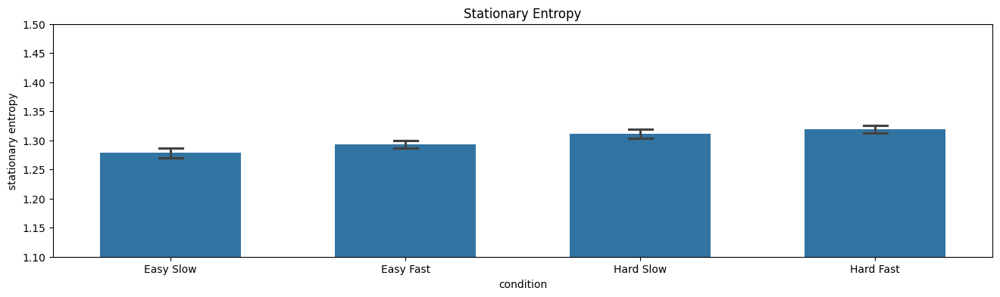

In [26]:
# barplot
df_long_conc = df_long.query("area == 'Ticket'")[['participant_id', 'difficulty', 'frequency', 'stat_entropy']].groupby(['difficulty', 'frequency']).agg({
    'stat_entropy': lambda x: np.concatenate(x.values).tolist()
}).reset_index()

df_long_expl = df_long_conc.explode('stat_entropy')
df_long_expl['condition'] = df_long_conc['difficulty'] + ' ' + df_long_conc['frequency']

sort_order = ['Easy Slow', 'Easy Fast', 'Hard Slow', 'Hard Fast']
df_long_expl['condition'] = pd.Categorical(df_long_expl['condition'], categories=sort_order, ordered=True)
df_long_expl = df_long_expl.sort_values('condition')

plt.figure(figsize=(16, 4))
ax = sns.barplot(
    data=df_long_expl,
    x='condition',
    y='stat_entropy',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=0.6
)
plt.title('Stationary Entropy')
plt.xlabel('condition')
plt.ylabel('stationary entropy')
plt.ylim(1.1, 1.5)

plt.show()


In [87]:
# Summary stats
mean = df_long_expl.query("difficulty == 'Easy'")['stat_entropy'].mean()
se = df_long_expl.query("difficulty == 'Easy'")['stat_entropy'].sem()
print(f"Easy stat entr: {mean:.4f} (~{se:.4f})")

mean = df_long_expl.query("difficulty == 'Hard'")['stat_entropy'].mean()
se = df_long_expl.query("difficulty == 'Hard'")['stat_entropy'].sem()
print(f"Hard stat entr: {mean:.4f} (~{se:.4f})")

mean = df_long_expl.query("frequency == 'Slow'")['stat_entropy'].mean()
se = df_long_expl.query("frequency == 'Slow'")['stat_entropy'].sem()
print(f"Slow stat entr: {mean:.4f} (~{se:.4f})")

mean = df_long_expl.query("frequency == 'Fast'")['stat_entropy'].mean()
se = df_long_expl.query("frequency == 'Fast'")['stat_entropy'].sem()
print(f"Fast stat entr: {mean:.4f} (~{se:.4f})")

Easy stat entr: 1.2881 (~0.0049)
Hard stat entr: 1.3161 (~0.0049)
Slow stat entr: 1.2931 (~0.0058)
Fast stat entr: 1.3040 (~0.0044)


##### Condition-based (per participant)
- (...)

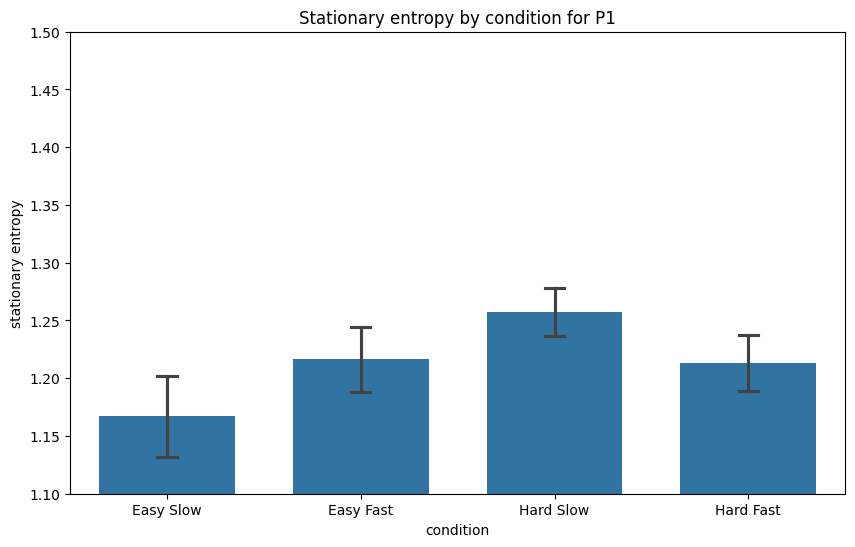

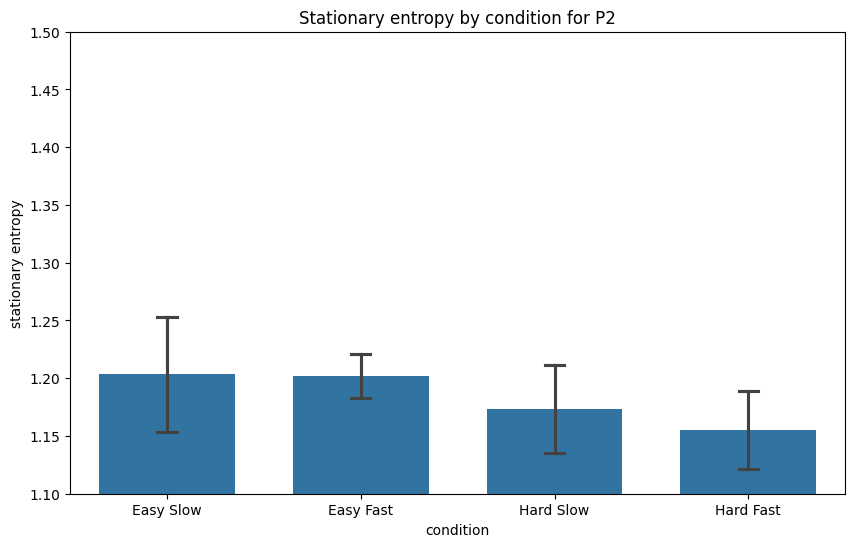

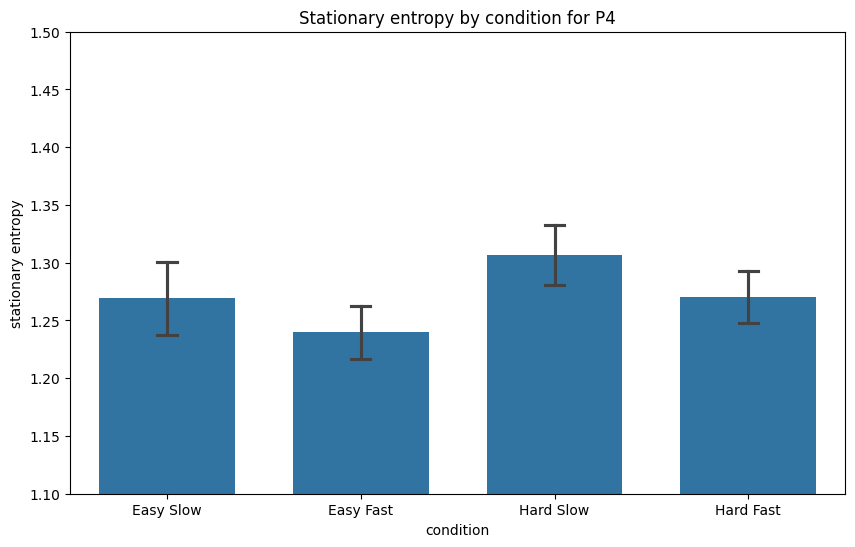

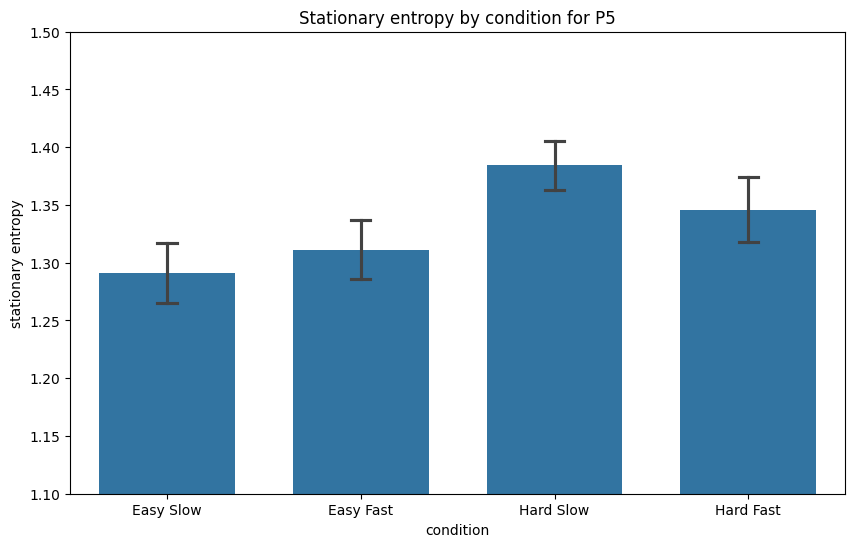

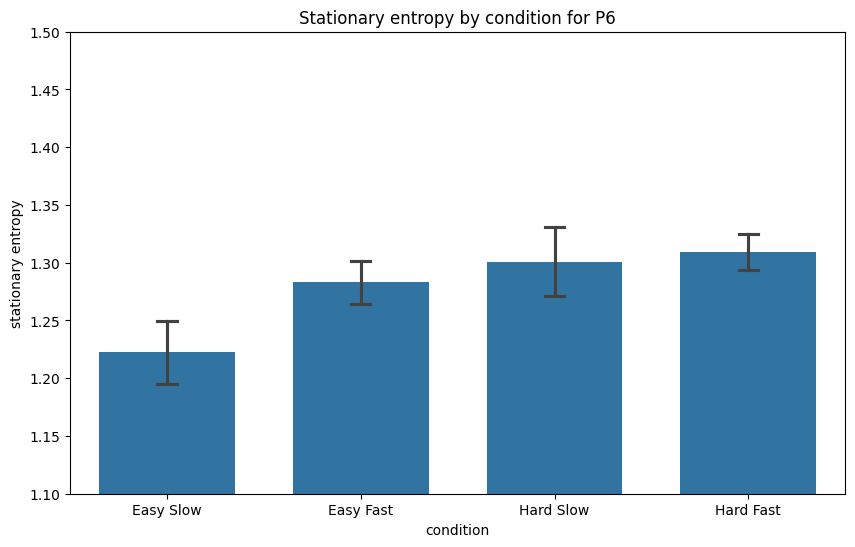

...

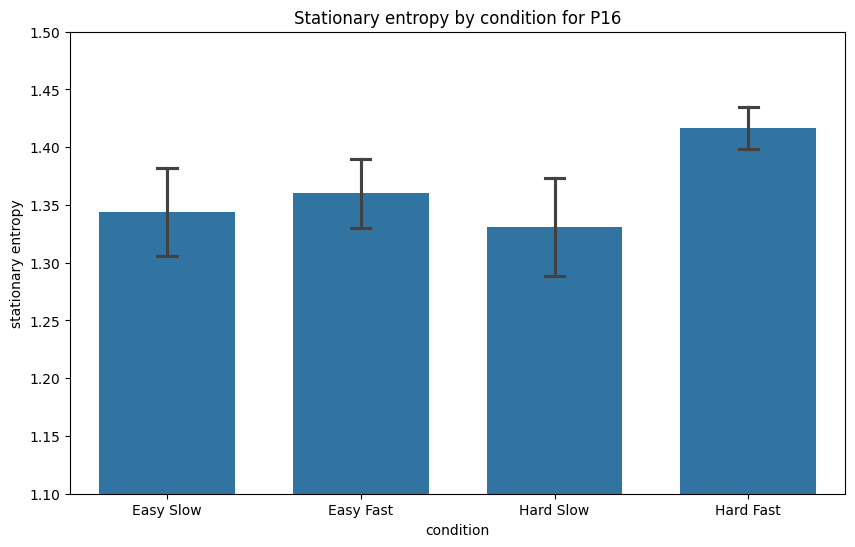

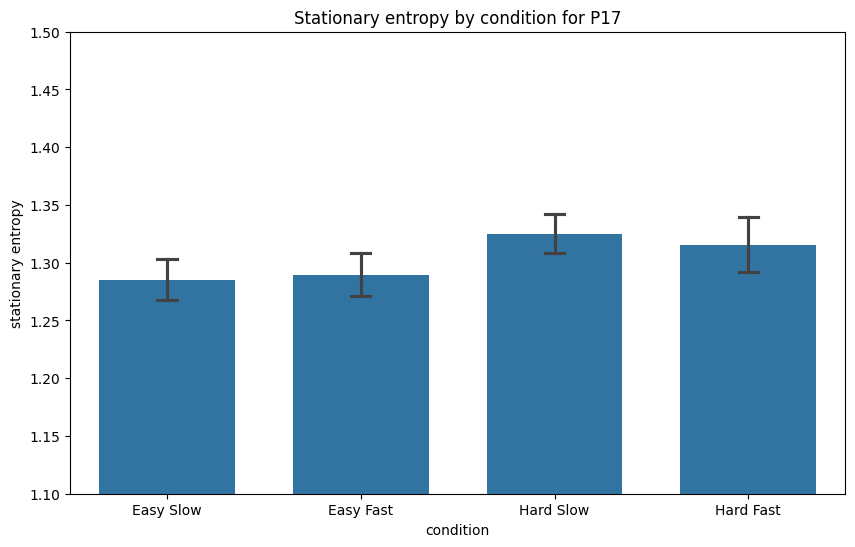

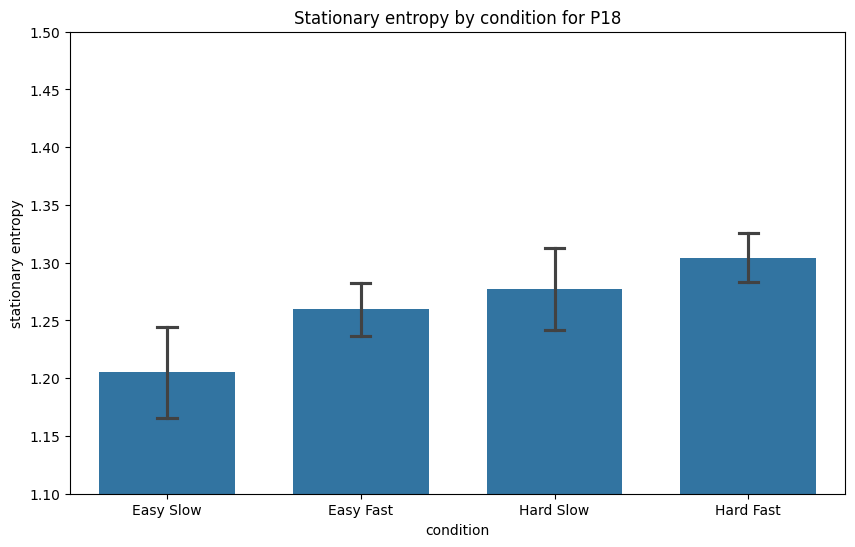

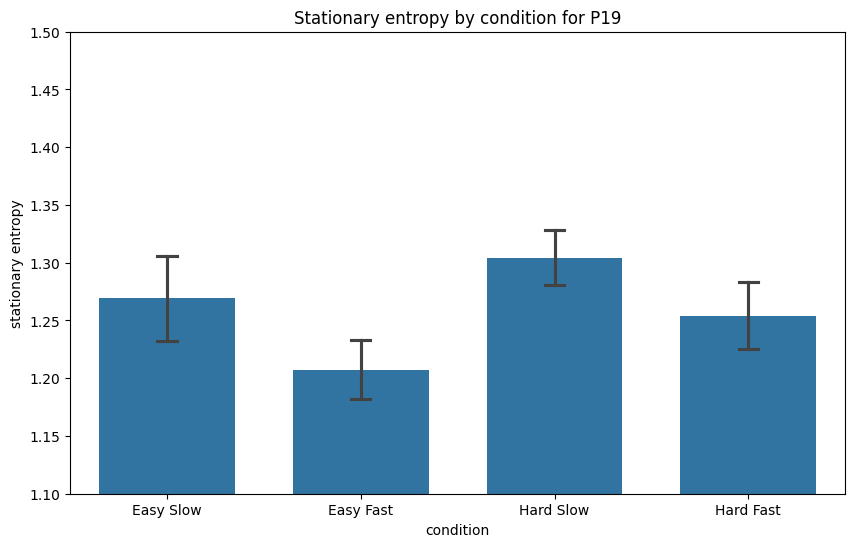

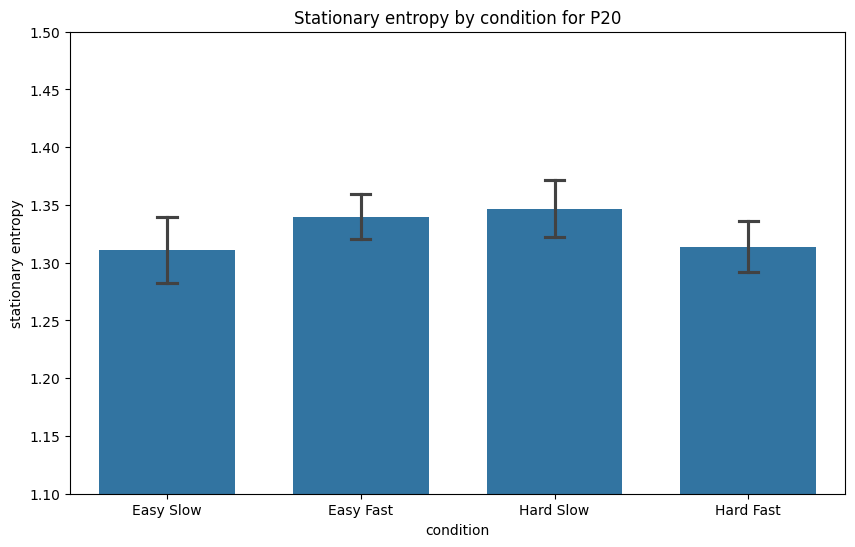

In [46]:
# barplot
df_long_conc = df_long.query("area == 'Ticket'")[['participant_id', 'difficulty', 'frequency', 'stat_entropy']].groupby(['participant_id', 'difficulty', 'frequency']).agg({
    'stat_entropy': lambda x: np.concatenate(x.values).tolist()
}).reset_index()

df_long_expl = df_long_conc.explode('stat_entropy')
df_long_expl['condition'] = df_long_conc['difficulty'] + ' ' + df_long_conc['frequency']

sort_order = ['Easy Slow', 'Easy Fast', 'Hard Slow', 'Hard Fast']
df_long_expl['condition'] = pd.Categorical(df_long_expl['condition'], categories=sort_order, ordered=True)
df_long_expl = df_long_expl.sort_values(['participant_id', 'condition'])

for pid in [1, 2, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20]:
    p_df_long_expl = df_long_expl.query(f'participant_id == {pid}')

    plt.figure(figsize=(10, 6))
    ax = sns.barplot(
        data=p_df_long_expl,
        x='condition',
        y='stat_entropy',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=0.7
    )
    plt.title(f'Stationary entropy by condition for P{pid}')
    plt.xlabel('condition')
    plt.ylabel('stationary entropy')
    plt.ylim(1.1, 1.5)

    plt.show()

### 12. Transition Entropy
Condition-based, per participant

##### Condition-based
- Easy Slow vs Hard Fast

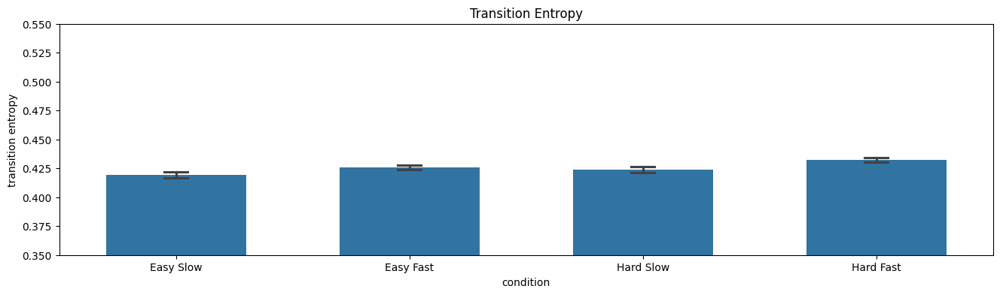

In [27]:
# barplot
df_long_conc = df_long.query("area == 'Ticket'")[['participant_id', 'difficulty', 'frequency', 'trans_entropy']].groupby(['difficulty', 'frequency']).agg({
    'trans_entropy': lambda x: np.concatenate(x.values).tolist()
}).reset_index()

df_long_expl = df_long_conc.explode('trans_entropy')
df_long_expl['condition'] = df_long_conc['difficulty'] + ' ' + df_long_conc['frequency']

sort_order = ['Easy Slow', 'Easy Fast', 'Hard Slow', 'Hard Fast']
df_long_expl['condition'] = pd.Categorical(df_long_expl['condition'], categories=sort_order, ordered=True)
df_long_expl = df_long_expl.sort_values('condition')

plt.figure(figsize=(16, 4))
ax = sns.barplot(
    data=df_long_expl,
    x='condition',
    y='trans_entropy',
    estimator='mean',
    errorbar='se',
    capsize=0.1,
    width=0.6
)
plt.title('Transition Entropy')
plt.xlabel('condition')
plt.ylabel('transition entropy')
plt.ylim(.35, .55)

plt.show()


In [90]:
# Summary stats
mean = df_long_expl.query("difficulty == 'Easy'")['trans_entropy'].mean()
se = df_long_expl.query("difficulty == 'Easy'")['trans_entropy'].sem()
print(f"Easy trans entr: {mean:.4f} (~{se:.4f})")

mean = df_long_expl.query("difficulty == 'Hard'")['trans_entropy'].mean()
se = df_long_expl.query("difficulty == 'Hard'")['trans_entropy'].sem()
print(f"Hard trans entr: {mean:.4f} (~{se:.4f})")

mean = df_long_expl.query("frequency == 'Slow'")['trans_entropy'].mean()
se = df_long_expl.query("frequency == 'Slow'")['trans_entropy'].sem()
print(f"Slow trans entr: {mean:.4f} (~{se:.4f})")

mean = df_long_expl.query("frequency == 'Fast'")['trans_entropy'].mean()
se = df_long_expl.query("frequency == 'Fast'")['trans_entropy'].sem()
print(f"Fast trans entr: {mean:.4f} (~{se:.4f})")

Easy trans entr: 0.4236 (~0.0016)
Hard trans entr: 0.4292 (~0.0016)
Slow trans entr: 0.4215 (~0.0019)
Fast trans entr: 0.4284 (~0.0015)


##### Condition-based (per participant)
- (...)

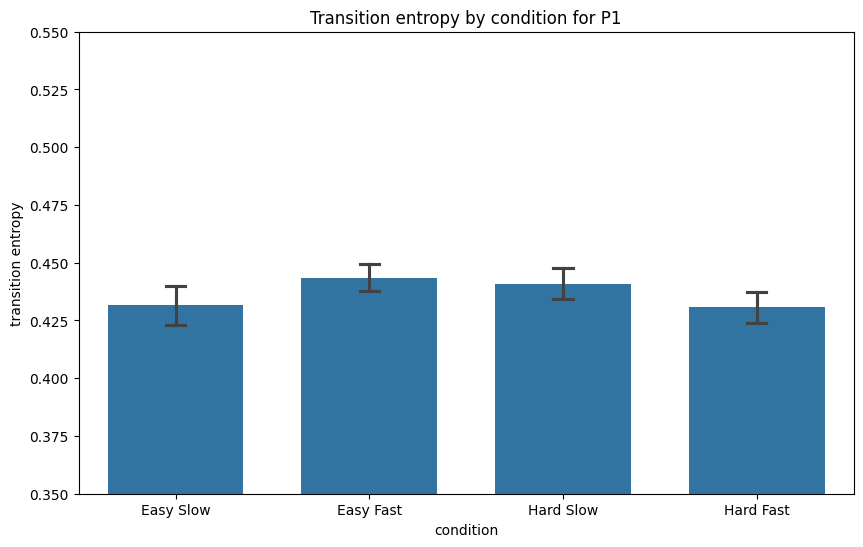

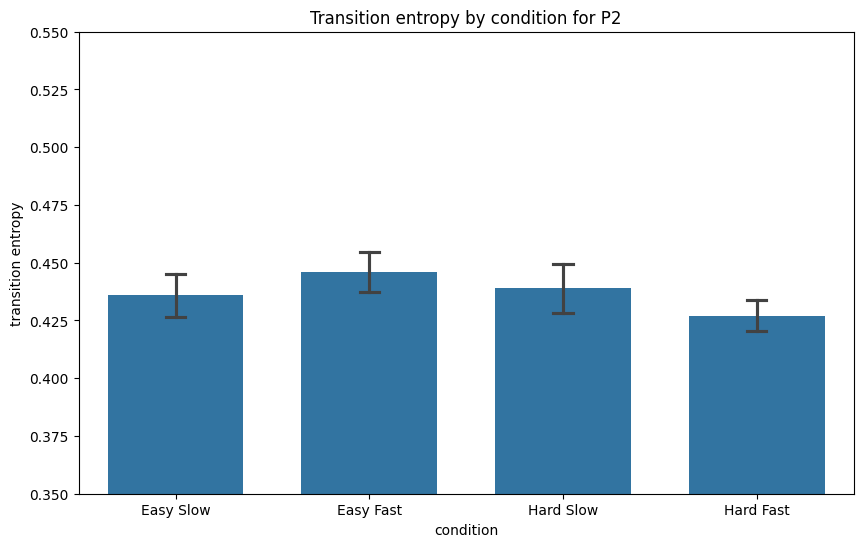

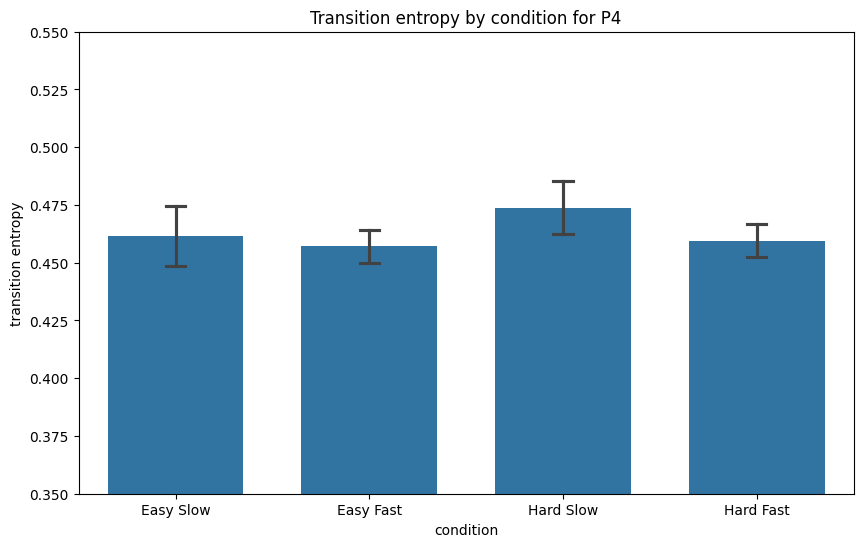

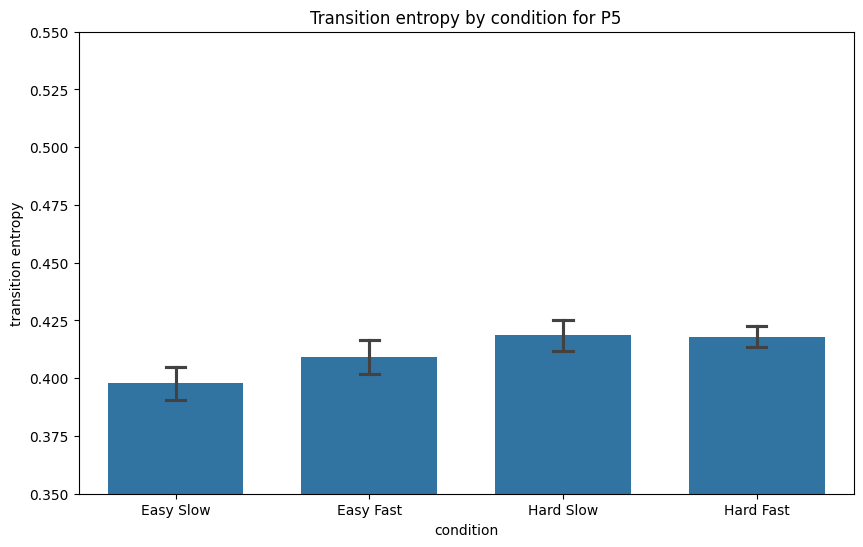

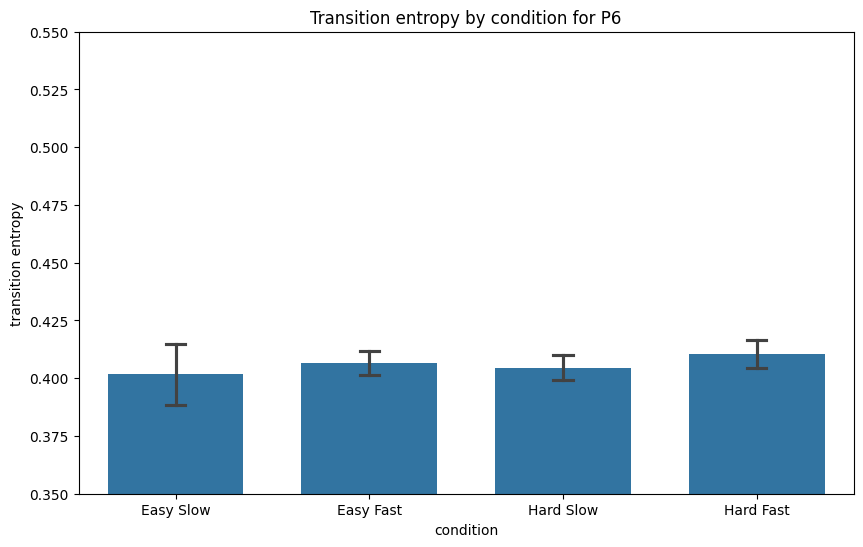

...

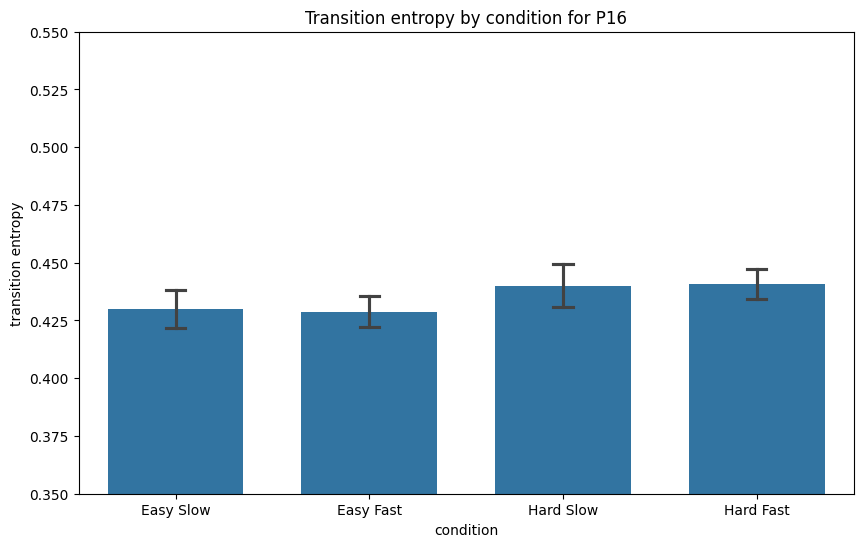

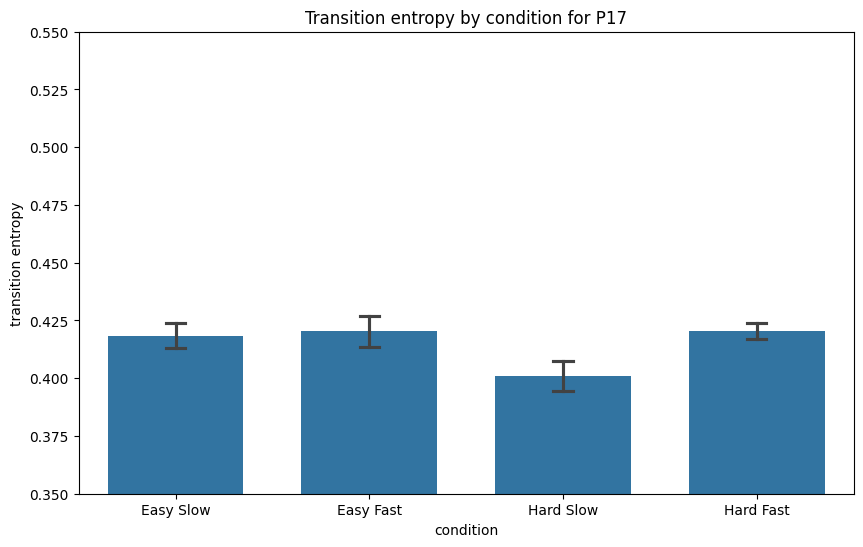

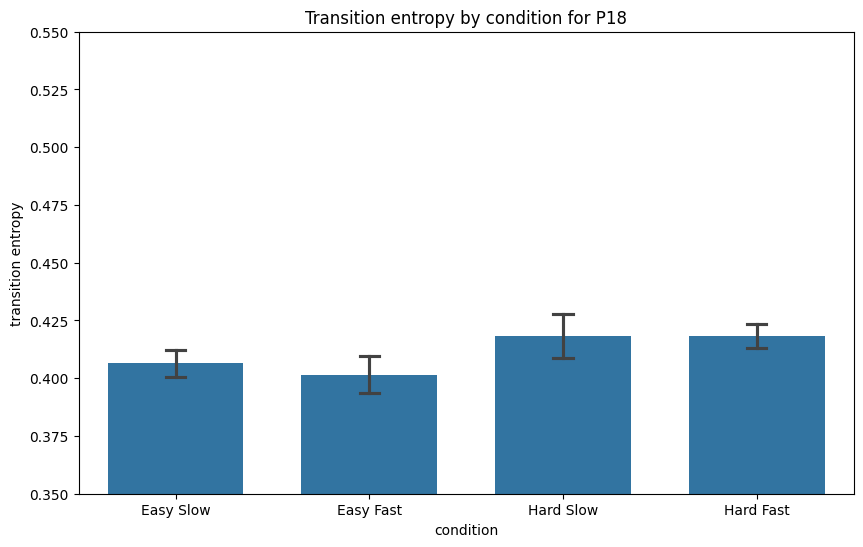

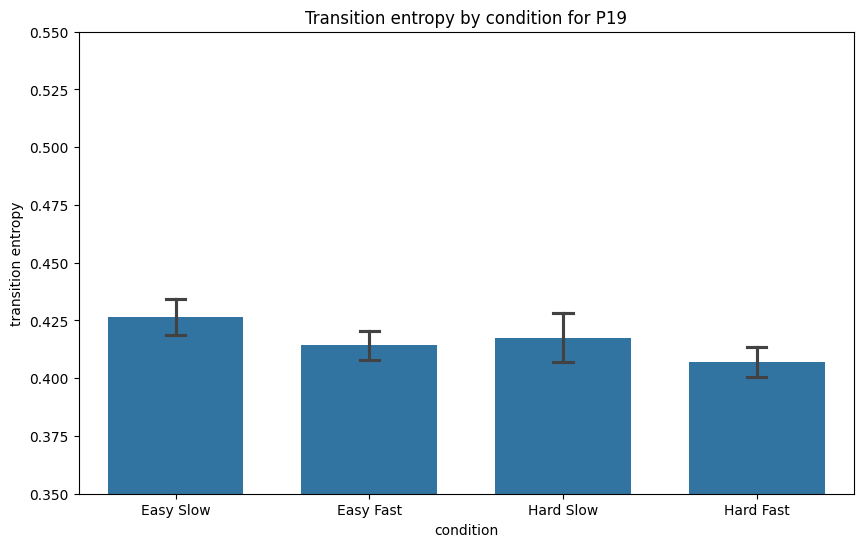

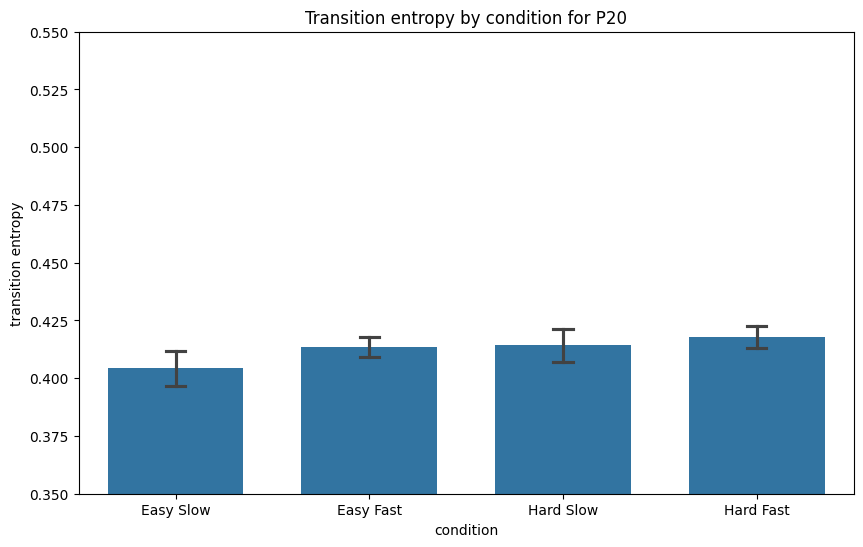

In [48]:
# barplot
df_long_conc = df_long.query("area == 'Ticket'")[['participant_id', 'difficulty', 'frequency', 'trans_entropy']].groupby(['participant_id', 'difficulty', 'frequency']).agg({
    'trans_entropy': lambda x: np.concatenate(x.values).tolist()
}).reset_index()

df_long_expl = df_long_conc.explode('trans_entropy')
df_long_expl['condition'] = df_long_conc['difficulty'] + ' ' + df_long_conc['frequency']

sort_order = ['Easy Slow', 'Easy Fast', 'Hard Slow', 'Hard Fast']
df_long_expl['condition'] = pd.Categorical(df_long_expl['condition'], categories=sort_order, ordered=True)
df_long_expl = df_long_expl.sort_values(['participant_id', 'condition'])

for pid in [1, 2, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20]:
    p_df_long_expl = df_long_expl.query(f'participant_id == {pid}')

    plt.figure(figsize=(10, 6))
    ax = sns.barplot(
        data=p_df_long_expl,
        x='condition',
        y='trans_entropy',
        estimator='mean',
        errorbar='se',
        capsize=0.1,
        width=0.7
    )
    plt.title(f'Transition entropy by condition for P{pid}')
    plt.xlabel('condition')
    plt.ylabel('transition entropy')
    plt.ylim(.35, .55)

    plt.show()